# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
asdp_1 = adata.X.sum()

In [7]:
ratio_true=0.994

from tardis._utils.functions import create_random_mask
mask = create_random_mask(adata.shape[1], ratio_true=ratio_true, seed=2024)
adata.X[:, mask] = 0.0

In [8]:
asdp_2 = adata.X.sum()

In [9]:
mask.sum()/adata.shape[1],  1-asdp_2/asdp_1

(0.9948, 0.9940106463618577)

In [10]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [11]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "status_control",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "time_cat",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "zone",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [12]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    f"afriat_v2_4_ablation_{ratio_true}"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/work/codes/tardis/tardis/_mymodel.py:81: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  library_log_means, library_log_vars = _init_library_size(self.adata_manager, n_batch)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_figures
ID: s6wddgkd
Name: leafy-universe-131
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_figures/runs/s6wddgkd
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240503_120422-s6wddgkd/files



GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "
SLURM auto-requeueing enabled. Setting signal handlers.


Training:   0%|                                                                                                                                                                                                                                 | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|                                                                                                                                                                                                                              | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `training` set. Number of elements in each group: 2548,3292,9403
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `training` set. Number of elements in each group: 2548,2588,1676,3393,1641,3397
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `training` set. Number of elements in each group: 4482,10761
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `validation` set. Number of elements in each group: 657,817,2336
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `validation` set. Number of elements in each group: 657,614,432,897,408,802
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `validation` set. Number of elements in each group: 1102,2708
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|▎                                                                                                                                                                                                                   | 1/600 [00:13<2:14:27, 13.47s/it]

Epoch 1/600:   0%|▎                                                                                                                                                           | 1/600 [00:13<2:14:27, 13.47s/it, v_num=kd_1, total_loss_train=50.5, kl_local_train=26.5]

Epoch 2/600:   0%|▎                                                                                                                                                           | 1/600 [00:13<2:14:27, 13.47s/it, v_num=kd_1, total_loss_train=50.5, kl_local_train=26.5]

Epoch 2/600:   0%|▌                                                                                                                                                           | 2/600 [00:25<2:07:28, 12.79s/it, v_num=kd_1, total_loss_train=50.5, kl_local_train=26.5]

Epoch 2/600:   0%|▌                                                                                                                                                           | 2/600 [00:25<2:07:28, 12.79s/it, v_num=kd_1, total_loss_train=25.8, kl_local_train=37.9]

Epoch 3/600:   0%|▌                                                                                                                                                           | 2/600 [00:25<2:07:28, 12.79s/it, v_num=kd_1, total_loss_train=25.8, kl_local_train=37.9]

Epoch 3/600:   0%|▊                                                                                                                                                           | 3/600 [00:38<2:04:42, 12.53s/it, v_num=kd_1, total_loss_train=25.8, kl_local_train=37.9]

Epoch 3/600:   0%|▊                                                                                                                                                           | 3/600 [00:38<2:04:42, 12.53s/it, v_num=kd_1, total_loss_train=21.5, kl_local_train=32.2]

Epoch 4/600:   0%|▊                                                                                                                                                           | 3/600 [00:38<2:04:42, 12.53s/it, v_num=kd_1, total_loss_train=21.5, kl_local_train=32.2]

Epoch 4/600:   1%|█                                                                                                                                                           | 4/600 [00:50<2:03:21, 12.42s/it, v_num=kd_1, total_loss_train=21.5, kl_local_train=32.2]

Epoch 4/600:   1%|█                                                                                                                                                           | 4/600 [00:50<2:03:21, 12.42s/it, v_num=kd_1, total_loss_train=20.4, kl_local_train=21.2]

Epoch 5/600:   1%|█                                                                                                                                                           | 4/600 [00:50<2:03:21, 12.42s/it, v_num=kd_1, total_loss_train=20.4, kl_local_train=21.2]

Epoch 5/600:   1%|█▎                                                                                                                                                          | 5/600 [01:02<2:02:51, 12.39s/it, v_num=kd_1, total_loss_train=20.4, kl_local_train=21.2]

Epoch 5/600:   1%|█▎                                                                                                                                                          | 5/600 [01:02<2:02:51, 12.39s/it, v_num=kd_1, total_loss_train=19.9, kl_local_train=13.3]

Epoch 6/600:   1%|█▎                                                                                                                                                          | 5/600 [01:03<2:02:51, 12.39s/it, v_num=kd_1, total_loss_train=19.9, kl_local_train=13.3]

Epoch 6/600:   1%|█▌                                                                                                                                                          | 6/600 [01:15<2:04:20, 12.56s/it, v_num=kd_1, total_loss_train=19.9, kl_local_train=13.3]

Epoch 6/600:   1%|▎                        | 6/600 [01:15<2:04:20, 12.56s/it, v_num=kd_1, total_loss_train=19.4, kl_local_train=11.8, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.00853, metric_mi|time_cat_train=0.015, metric_mi|mouse_train=0.0367]

Epoch 7/600:   1%|▎                        | 6/600 [01:15<2:04:20, 12.56s/it, v_num=kd_1, total_loss_train=19.4, kl_local_train=11.8, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.00853, metric_mi|time_cat_train=0.015, metric_mi|mouse_train=0.0367]

Epoch 7/600:   1%|▎                        | 7/600 [01:27<2:01:08, 12.26s/it, v_num=kd_1, total_loss_train=19.4, kl_local_train=11.8, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.00853, metric_mi|time_cat_train=0.015, metric_mi|mouse_train=0.0367]

Epoch 7/600:   1%|▎                        | 7/600 [01:27<2:01:08, 12.26s/it, v_num=kd_1, total_loss_train=18.9, kl_local_train=13.4, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.00853, metric_mi|time_cat_train=0.015, metric_mi|mouse_train=0.0367]

Epoch 8/600:   1%|▎                        | 7/600 [01:27<2:01:08, 12.26s/it, v_num=kd_1, total_loss_train=18.9, kl_local_train=13.4, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.00853, metric_mi|time_cat_train=0.015, metric_mi|mouse_train=0.0367]

Epoch 8/600:   1%|▎                        | 8/600 [01:38<1:58:55, 12.05s/it, v_num=kd_1, total_loss_train=18.9, kl_local_train=13.4, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.00853, metric_mi|time_cat_train=0.015, metric_mi|mouse_train=0.0367]

Epoch 8/600:   1%|▎                        | 8/600 [01:38<1:58:55, 12.05s/it, v_num=kd_1, total_loss_train=26.4, kl_local_train=14.5, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.00853, metric_mi|time_cat_train=0.015, metric_mi|mouse_train=0.0367]

Epoch 9/600:   1%|▎                        | 8/600 [01:38<1:58:55, 12.05s/it, v_num=kd_1, total_loss_train=26.4, kl_local_train=14.5, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.00853, metric_mi|time_cat_train=0.015, metric_mi|mouse_train=0.0367]

Epoch 9/600:   2%|▍                        | 9/600 [01:50<1:57:25, 11.92s/it, v_num=kd_1, total_loss_train=26.4, kl_local_train=14.5, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.00853, metric_mi|time_cat_train=0.015, metric_mi|mouse_train=0.0367]

Epoch 9/600:   2%|▍                        | 9/600 [01:50<1:57:25, 11.92s/it, v_num=kd_1, total_loss_train=33.9, kl_local_train=17.1, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.00853, metric_mi|time_cat_train=0.015, metric_mi|mouse_train=0.0367]

Epoch 10/600:   2%|▎                       | 9/600 [01:50<1:57:25, 11.92s/it, v_num=kd_1, total_loss_train=33.9, kl_local_train=17.1, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.00853, metric_mi|time_cat_train=0.015, metric_mi|mouse_train=0.0367]

Epoch 10/600:   2%|▍                      | 10/600 [02:02<1:56:37, 11.86s/it, v_num=kd_1, total_loss_train=33.9, kl_local_train=17.1, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.00853, metric_mi|time_cat_train=0.015, metric_mi|mouse_train=0.0367]

Epoch 10/600:   2%|▍                      | 10/600 [02:02<1:56:37, 11.86s/it, v_num=kd_1, total_loss_train=39.6, kl_local_train=44.6, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.00853, metric_mi|time_cat_train=0.015, metric_mi|mouse_train=0.0367]

Epoch 11/600:   2%|▍                      | 10/600 [02:03<1:56:37, 11.86s/it, v_num=kd_1, total_loss_train=39.6, kl_local_train=44.6, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.00853, metric_mi|time_cat_train=0.015, metric_mi|mouse_train=0.0367]

Epoch 11/600:   2%|▍                      | 11/600 [02:15<1:59:36, 12.18s/it, v_num=kd_1, total_loss_train=39.6, kl_local_train=44.6, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.00853, metric_mi|time_cat_train=0.015, metric_mi|mouse_train=0.0367]

Epoch 11/600:   2%|▍                       | 11/600 [02:15<1:59:36, 12.18s/it, v_num=kd_1, total_loss_train=42.6, kl_local_train=78.7, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0108, metric_mi|time_cat_train=0.0411, metric_mi|mouse_train=0.0533]

Epoch 12/600:   2%|▍                       | 11/600 [02:15<1:59:36, 12.18s/it, v_num=kd_1, total_loss_train=42.6, kl_local_train=78.7, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0108, metric_mi|time_cat_train=0.0411, metric_mi|mouse_train=0.0533]

Epoch 12/600:   2%|▍                       | 12/600 [02:26<1:57:53, 12.03s/it, v_num=kd_1, total_loss_train=42.6, kl_local_train=78.7, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0108, metric_mi|time_cat_train=0.0411, metric_mi|mouse_train=0.0533]

Epoch 12/600:   2%|▌                         | 12/600 [02:26<1:57:53, 12.03s/it, v_num=kd_1, total_loss_train=46, kl_local_train=94.9, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0108, metric_mi|time_cat_train=0.0411, metric_mi|mouse_train=0.0533]

Epoch 13/600:   2%|▌                         | 12/600 [02:26<1:57:53, 12.03s/it, v_num=kd_1, total_loss_train=46, kl_local_train=94.9, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0108, metric_mi|time_cat_train=0.0411, metric_mi|mouse_train=0.0533]

Epoch 13/600:   2%|▌                         | 13/600 [02:38<1:56:33, 11.91s/it, v_num=kd_1, total_loss_train=46, kl_local_train=94.9, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0108, metric_mi|time_cat_train=0.0411, metric_mi|mouse_train=0.0533]

Epoch 13/600:   2%|▌                        | 13/600 [02:38<1:56:33, 11.91s/it, v_num=kd_1, total_loss_train=49.4, kl_local_train=112, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0108, metric_mi|time_cat_train=0.0411, metric_mi|mouse_train=0.0533]

Epoch 14/600:   2%|▌                        | 13/600 [02:38<1:56:33, 11.91s/it, v_num=kd_1, total_loss_train=49.4, kl_local_train=112, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0108, metric_mi|time_cat_train=0.0411, metric_mi|mouse_train=0.0533]

Epoch 14/600:   2%|▌                        | 14/600 [02:49<1:55:31, 11.83s/it, v_num=kd_1, total_loss_train=49.4, kl_local_train=112, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0108, metric_mi|time_cat_train=0.0411, metric_mi|mouse_train=0.0533]

Epoch 14/600:   2%|▌                        | 14/600 [02:49<1:55:31, 11.83s/it, v_num=kd_1, total_loss_train=53.4, kl_local_train=133, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0108, metric_mi|time_cat_train=0.0411, metric_mi|mouse_train=0.0533]

Epoch 15/600:   2%|▌                        | 14/600 [02:49<1:55:31, 11.83s/it, v_num=kd_1, total_loss_train=53.4, kl_local_train=133, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0108, metric_mi|time_cat_train=0.0411, metric_mi|mouse_train=0.0533]

Epoch 15/600:   2%|▋                        | 15/600 [03:01<1:54:57, 11.79s/it, v_num=kd_1, total_loss_train=53.4, kl_local_train=133, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0108, metric_mi|time_cat_train=0.0411, metric_mi|mouse_train=0.0533]

Epoch 15/600:   2%|▋                        | 15/600 [03:01<1:54:57, 11.79s/it, v_num=kd_1, total_loss_train=57.5, kl_local_train=143, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0108, metric_mi|time_cat_train=0.0411, metric_mi|mouse_train=0.0533]

Epoch 16/600:   2%|▋                        | 15/600 [03:02<1:54:57, 11.79s/it, v_num=kd_1, total_loss_train=57.5, kl_local_train=143, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0108, metric_mi|time_cat_train=0.0411, metric_mi|mouse_train=0.0533]

Epoch 16/600:   3%|▋                        | 16/600 [03:14<1:58:06, 12.13s/it, v_num=kd_1, total_loss_train=57.5, kl_local_train=143, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0108, metric_mi|time_cat_train=0.0411, metric_mi|mouse_train=0.0533]

Epoch 16/600:   3%|▋                           | 16/600 [03:14<1:58:06, 12.13s/it, v_num=kd_1, total_loss_train=61.5, kl_local_train=145, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 17/600:   3%|▋                           | 16/600 [03:14<1:58:06, 12.13s/it, v_num=kd_1, total_loss_train=61.5, kl_local_train=145, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 17/600:   3%|▊                           | 17/600 [03:26<1:56:31, 11.99s/it, v_num=kd_1, total_loss_train=61.5, kl_local_train=145, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 17/600:   3%|▊                           | 17/600 [03:26<1:56:31, 11.99s/it, v_num=kd_1, total_loss_train=65.7, kl_local_train=147, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 18/600:   3%|▊                           | 17/600 [03:26<1:56:31, 11.99s/it, v_num=kd_1, total_loss_train=65.7, kl_local_train=147, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 18/600:   3%|▊                           | 18/600 [03:37<1:55:21, 11.89s/it, v_num=kd_1, total_loss_train=65.7, kl_local_train=147, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 18/600:   3%|▊                           | 18/600 [03:37<1:55:21, 11.89s/it, v_num=kd_1, total_loss_train=69.9, kl_local_train=146, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 19/600:   3%|▊                           | 18/600 [03:37<1:55:21, 11.89s/it, v_num=kd_1, total_loss_train=69.9, kl_local_train=146, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 19/600:   3%|▉                           | 19/600 [03:49<1:54:27, 11.82s/it, v_num=kd_1, total_loss_train=69.9, kl_local_train=146, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 19/600:   3%|▉                           | 19/600 [03:49<1:54:27, 11.82s/it, v_num=kd_1, total_loss_train=74.1, kl_local_train=145, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 20/600:   3%|▉                           | 19/600 [03:49<1:54:27, 11.82s/it, v_num=kd_1, total_loss_train=74.1, kl_local_train=145, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 20/600:   3%|▉                           | 20/600 [04:01<1:53:59, 11.79s/it, v_num=kd_1, total_loss_train=74.1, kl_local_train=145, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 20/600:   3%|▉                           | 20/600 [04:01<1:53:59, 11.79s/it, v_num=kd_1, total_loss_train=78.3, kl_local_train=147, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 21/600:   3%|▉                           | 20/600 [04:02<1:53:59, 11.79s/it, v_num=kd_1, total_loss_train=78.3, kl_local_train=147, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 21/600:   4%|▉                           | 21/600 [04:14<1:57:12, 12.15s/it, v_num=kd_1, total_loss_train=78.3, kl_local_train=147, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 21/600:   4%|█                             | 21/600 [04:14<1:57:12, 12.15s/it, v_num=kd_1, total_loss_train=82.4, kl_local_train=150, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 22/600:   4%|█                             | 21/600 [04:14<1:57:12, 12.15s/it, v_num=kd_1, total_loss_train=82.4, kl_local_train=150, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 22/600:   4%|█                             | 22/600 [04:25<1:55:42, 12.01s/it, v_num=kd_1, total_loss_train=82.4, kl_local_train=150, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 22/600:   4%|█▏                              | 22/600 [04:25<1:55:42, 12.01s/it, v_num=kd_1, total_loss_train=87, kl_local_train=151, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 23/600:   4%|█▏                              | 22/600 [04:25<1:55:42, 12.01s/it, v_num=kd_1, total_loss_train=87, kl_local_train=151, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 23/600:   4%|█▏                              | 23/600 [04:37<1:54:34, 11.91s/it, v_num=kd_1, total_loss_train=87, kl_local_train=151, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 23/600:   4%|█▏                            | 23/600 [04:37<1:54:34, 11.91s/it, v_num=kd_1, total_loss_train=91.1, kl_local_train=153, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 24/600:   4%|█▏                            | 23/600 [04:37<1:54:34, 11.91s/it, v_num=kd_1, total_loss_train=91.1, kl_local_train=153, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 24/600:   4%|█▏                            | 24/600 [04:49<1:53:46, 11.85s/it, v_num=kd_1, total_loss_train=91.1, kl_local_train=153, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 24/600:   4%|█▏                            | 24/600 [04:49<1:53:46, 11.85s/it, v_num=kd_1, total_loss_train=95.3, kl_local_train=152, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 25/600:   4%|█▏                            | 24/600 [04:49<1:53:46, 11.85s/it, v_num=kd_1, total_loss_train=95.3, kl_local_train=152, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 25/600:   4%|█▎                            | 25/600 [05:01<1:53:16, 11.82s/it, v_num=kd_1, total_loss_train=95.3, kl_local_train=152, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 25/600:   4%|█▎                            | 25/600 [05:01<1:53:16, 11.82s/it, v_num=kd_1, total_loss_train=99.6, kl_local_train=152, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 26/600:   4%|█▎                            | 25/600 [05:02<1:53:16, 11.82s/it, v_num=kd_1, total_loss_train=99.6, kl_local_train=152, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 26/600:   4%|█▎                            | 26/600 [05:14<1:56:32, 12.18s/it, v_num=kd_1, total_loss_train=99.6, kl_local_train=152, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 26/600:   4%|█▎                           | 26/600 [05:14<1:56:32, 12.18s/it, v_num=kd_1, total_loss_train=104, kl_local_train=152, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 27/600:   4%|█▎                           | 26/600 [05:14<1:56:32, 12.18s/it, v_num=kd_1, total_loss_train=104, kl_local_train=152, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 27/600:   4%|█▎                           | 27/600 [05:25<1:54:56, 12.04s/it, v_num=kd_1, total_loss_train=104, kl_local_train=152, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 27/600:   4%|█▎                           | 27/600 [05:25<1:54:56, 12.04s/it, v_num=kd_1, total_loss_train=108, kl_local_train=151, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 28/600:   4%|█▎                           | 27/600 [05:25<1:54:56, 12.04s/it, v_num=kd_1, total_loss_train=108, kl_local_train=151, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 28/600:   5%|█▎                           | 28/600 [05:37<1:53:46, 11.93s/it, v_num=kd_1, total_loss_train=108, kl_local_train=151, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 28/600:   5%|█▎                           | 28/600 [05:37<1:53:46, 11.93s/it, v_num=kd_1, total_loss_train=112, kl_local_train=153, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 29/600:   5%|█▎                           | 28/600 [05:37<1:53:46, 11.93s/it, v_num=kd_1, total_loss_train=112, kl_local_train=153, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 29/600:   5%|█▍                           | 29/600 [05:49<1:52:55, 11.87s/it, v_num=kd_1, total_loss_train=112, kl_local_train=153, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 29/600:   5%|█▍                           | 29/600 [05:49<1:52:55, 11.87s/it, v_num=kd_1, total_loss_train=116, kl_local_train=148, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 30/600:   5%|█▍                           | 29/600 [05:49<1:52:55, 11.87s/it, v_num=kd_1, total_loss_train=116, kl_local_train=148, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 30/600:   5%|█▍                           | 30/600 [06:00<1:52:18, 11.82s/it, v_num=kd_1, total_loss_train=116, kl_local_train=148, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 30/600:   5%|█▍                           | 30/600 [06:00<1:52:18, 11.82s/it, v_num=kd_1, total_loss_train=121, kl_local_train=152, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 31/600:   5%|█▍                           | 30/600 [06:02<1:52:18, 11.82s/it, v_num=kd_1, total_loss_train=121, kl_local_train=152, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 31/600:   5%|█▍                           | 31/600 [06:13<1:55:26, 12.17s/it, v_num=kd_1, total_loss_train=121, kl_local_train=152, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 31/600:   5%|█▍                           | 31/600 [06:13<1:55:26, 12.17s/it, v_num=kd_1, total_loss_train=125, kl_local_train=150, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 32/600:   5%|█▍                           | 31/600 [06:13<1:55:26, 12.17s/it, v_num=kd_1, total_loss_train=125, kl_local_train=150, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 32/600:   5%|█▌                           | 32/600 [06:25<1:54:01, 12.05s/it, v_num=kd_1, total_loss_train=125, kl_local_train=150, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 32/600:   5%|█▌                           | 32/600 [06:25<1:54:01, 12.05s/it, v_num=kd_1, total_loss_train=129, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 33/600:   5%|█▌                           | 32/600 [06:25<1:54:01, 12.05s/it, v_num=kd_1, total_loss_train=129, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 33/600:   6%|█▌                           | 33/600 [06:37<1:52:55, 11.95s/it, v_num=kd_1, total_loss_train=129, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 33/600:   6%|█▌                           | 33/600 [06:37<1:52:55, 11.95s/it, v_num=kd_1, total_loss_train=133, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 34/600:   6%|█▌                           | 33/600 [06:37<1:52:55, 11.95s/it, v_num=kd_1, total_loss_train=133, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 34/600:   6%|█▋                           | 34/600 [06:49<1:52:05, 11.88s/it, v_num=kd_1, total_loss_train=133, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 34/600:   6%|█▋                           | 34/600 [06:49<1:52:05, 11.88s/it, v_num=kd_1, total_loss_train=138, kl_local_train=151, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 35/600:   6%|█▋                           | 34/600 [06:49<1:52:05, 11.88s/it, v_num=kd_1, total_loss_train=138, kl_local_train=151, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 35/600:   6%|█▋                           | 35/600 [07:00<1:51:29, 11.84s/it, v_num=kd_1, total_loss_train=138, kl_local_train=151, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 35/600:   6%|█▋                           | 35/600 [07:00<1:51:29, 11.84s/it, v_num=kd_1, total_loss_train=142, kl_local_train=149, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 36/600:   6%|█▋                           | 35/600 [07:02<1:51:29, 11.84s/it, v_num=kd_1, total_loss_train=142, kl_local_train=149, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 36/600:   6%|█▋                           | 36/600 [07:13<1:54:31, 12.18s/it, v_num=kd_1, total_loss_train=142, kl_local_train=149, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 36/600:   6%|█▋                           | 36/600 [07:13<1:54:31, 12.18s/it, v_num=kd_1, total_loss_train=146, kl_local_train=149, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 37/600:   6%|█▋                           | 36/600 [07:13<1:54:31, 12.18s/it, v_num=kd_1, total_loss_train=146, kl_local_train=149, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 37/600:   6%|█▊                           | 37/600 [07:25<1:53:03, 12.05s/it, v_num=kd_1, total_loss_train=146, kl_local_train=149, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 37/600:   6%|█▊                           | 37/600 [07:25<1:53:03, 12.05s/it, v_num=kd_1, total_loss_train=150, kl_local_train=151, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 38/600:   6%|█▊                           | 37/600 [07:25<1:53:03, 12.05s/it, v_num=kd_1, total_loss_train=150, kl_local_train=151, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 38/600:   6%|█▊                           | 38/600 [07:37<1:51:56, 11.95s/it, v_num=kd_1, total_loss_train=150, kl_local_train=151, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 38/600:   6%|█▊                           | 38/600 [07:37<1:51:56, 11.95s/it, v_num=kd_1, total_loss_train=155, kl_local_train=148, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 39/600:   6%|█▊                           | 38/600 [07:37<1:51:56, 11.95s/it, v_num=kd_1, total_loss_train=155, kl_local_train=148, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 39/600:   6%|█▉                           | 39/600 [07:49<1:51:04, 11.88s/it, v_num=kd_1, total_loss_train=155, kl_local_train=148, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 39/600:   6%|█▉                           | 39/600 [07:49<1:51:04, 11.88s/it, v_num=kd_1, total_loss_train=159, kl_local_train=150, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 40/600:   6%|█▉                           | 39/600 [07:49<1:51:04, 11.88s/it, v_num=kd_1, total_loss_train=159, kl_local_train=150, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 40/600:   7%|█▉                           | 40/600 [08:00<1:50:29, 11.84s/it, v_num=kd_1, total_loss_train=159, kl_local_train=150, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 40/600:   7%|█▉                           | 40/600 [08:00<1:50:29, 11.84s/it, v_num=kd_1, total_loss_train=163, kl_local_train=152, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 41/600:   7%|█▉                           | 40/600 [08:02<1:50:29, 11.84s/it, v_num=kd_1, total_loss_train=163, kl_local_train=152, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 41/600:   7%|█▉                           | 41/600 [08:13<1:53:35, 12.19s/it, v_num=kd_1, total_loss_train=163, kl_local_train=152, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 41/600:   7%|██                             | 41/600 [08:13<1:53:35, 12.19s/it, v_num=kd_1, total_loss_train=167, kl_local_train=149, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.147]

Epoch 42/600:   7%|██                             | 41/600 [08:13<1:53:35, 12.19s/it, v_num=kd_1, total_loss_train=167, kl_local_train=149, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.147]

Epoch 42/600:   7%|██▏                            | 42/600 [08:25<1:52:12, 12.06s/it, v_num=kd_1, total_loss_train=167, kl_local_train=149, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.147]

Epoch 42/600:   7%|██▏                            | 42/600 [08:25<1:52:12, 12.06s/it, v_num=kd_1, total_loss_train=172, kl_local_train=147, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.147]

Epoch 43/600:   7%|██▏                            | 42/600 [08:25<1:52:12, 12.06s/it, v_num=kd_1, total_loss_train=172, kl_local_train=147, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.147]

Epoch 43/600:   7%|██▏                            | 43/600 [08:37<1:51:09, 11.97s/it, v_num=kd_1, total_loss_train=172, kl_local_train=147, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.147]

Epoch 43/600:   7%|██▏                            | 43/600 [08:37<1:51:09, 11.97s/it, v_num=kd_1, total_loss_train=176, kl_local_train=148, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.147]

Epoch 44/600:   7%|██▏                            | 43/600 [08:37<1:51:09, 11.97s/it, v_num=kd_1, total_loss_train=176, kl_local_train=148, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.147]

Epoch 44/600:   7%|██▎                            | 44/600 [08:49<1:50:22, 11.91s/it, v_num=kd_1, total_loss_train=176, kl_local_train=148, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.147]

Epoch 44/600:   7%|██▎                            | 44/600 [08:49<1:50:22, 11.91s/it, v_num=kd_1, total_loss_train=180, kl_local_train=149, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.147]

Epoch 45/600:   7%|██▎                            | 44/600 [08:49<1:50:22, 11.91s/it, v_num=kd_1, total_loss_train=180, kl_local_train=149, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.147]

Epoch 45/600:   8%|██▎                            | 45/600 [09:00<1:49:58, 11.89s/it, v_num=kd_1, total_loss_train=180, kl_local_train=149, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.147]

Epoch 45/600:   8%|██▎                            | 45/600 [09:00<1:49:58, 11.89s/it, v_num=kd_1, total_loss_train=184, kl_local_train=150, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.147]

Epoch 46/600:   8%|██▎                            | 45/600 [09:02<1:49:58, 11.89s/it, v_num=kd_1, total_loss_train=184, kl_local_train=150, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.147]

Epoch 46/600:   8%|██▍                            | 46/600 [09:13<1:52:57, 12.23s/it, v_num=kd_1, total_loss_train=184, kl_local_train=150, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.147]

Epoch 46/600:   8%|██▏                          | 46/600 [09:13<1:52:57, 12.23s/it, v_num=kd_1, total_loss_train=189, kl_local_train=153, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 47/600:   8%|██▏                          | 46/600 [09:13<1:52:57, 12.23s/it, v_num=kd_1, total_loss_train=189, kl_local_train=153, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 47/600:   8%|██▎                          | 47/600 [09:25<1:51:27, 12.09s/it, v_num=kd_1, total_loss_train=189, kl_local_train=153, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 47/600:   8%|██▎                          | 47/600 [09:25<1:51:27, 12.09s/it, v_num=kd_1, total_loss_train=193, kl_local_train=156, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 48/600:   8%|██▎                          | 47/600 [09:25<1:51:27, 12.09s/it, v_num=kd_1, total_loss_train=193, kl_local_train=156, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 48/600:   8%|██▎                          | 48/600 [09:37<1:50:39, 12.03s/it, v_num=kd_1, total_loss_train=193, kl_local_train=156, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 48/600:   8%|██▎                          | 48/600 [09:37<1:50:39, 12.03s/it, v_num=kd_1, total_loss_train=197, kl_local_train=153, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 49/600:   8%|██▎                          | 48/600 [09:37<1:50:39, 12.03s/it, v_num=kd_1, total_loss_train=197, kl_local_train=153, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 49/600:   8%|██▎                          | 49/600 [09:49<1:49:53, 11.97s/it, v_num=kd_1, total_loss_train=197, kl_local_train=153, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 49/600:   8%|██▎                          | 49/600 [09:49<1:49:53, 11.97s/it, v_num=kd_1, total_loss_train=201, kl_local_train=150, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 50/600:   8%|██▎                          | 49/600 [09:49<1:49:53, 11.97s/it, v_num=kd_1, total_loss_train=201, kl_local_train=150, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 50/600:   8%|██▍                          | 50/600 [10:01<1:49:18, 11.92s/it, v_num=kd_1, total_loss_train=201, kl_local_train=150, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 50/600:   8%|██▍                          | 50/600 [10:01<1:49:18, 11.92s/it, v_num=kd_1, total_loss_train=206, kl_local_train=153, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 51/600:   8%|██▍                          | 50/600 [10:02<1:49:18, 11.92s/it, v_num=kd_1, total_loss_train=206, kl_local_train=153, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 51/600:   8%|██▍                          | 51/600 [10:14<1:52:09, 12.26s/it, v_num=kd_1, total_loss_train=206, kl_local_train=153, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 51/600:   8%|██▍                          | 51/600 [10:14<1:52:09, 12.26s/it, v_num=kd_1, total_loss_train=206, kl_local_train=153, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.144]

Epoch 52/600:   8%|██▍                          | 51/600 [10:14<1:52:09, 12.26s/it, v_num=kd_1, total_loss_train=206, kl_local_train=153, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.144]

Epoch 52/600:   9%|██▌                          | 52/600 [10:26<1:50:39, 12.12s/it, v_num=kd_1, total_loss_train=206, kl_local_train=153, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.144]

Epoch 52/600:   9%|██▌                          | 52/600 [10:26<1:50:39, 12.12s/it, v_num=kd_1, total_loss_train=206, kl_local_train=155, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.144]

Epoch 53/600:   9%|██▌                          | 52/600 [10:26<1:50:39, 12.12s/it, v_num=kd_1, total_loss_train=206, kl_local_train=155, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.144]

Epoch 53/600:   9%|██▌                          | 53/600 [10:37<1:49:32, 12.02s/it, v_num=kd_1, total_loss_train=206, kl_local_train=155, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.144]

Epoch 53/600:   9%|██▌                          | 53/600 [10:37<1:49:32, 12.02s/it, v_num=kd_1, total_loss_train=206, kl_local_train=152, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.144]

Epoch 54/600:   9%|██▌                          | 53/600 [10:37<1:49:32, 12.02s/it, v_num=kd_1, total_loss_train=206, kl_local_train=152, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.144]

Epoch 54/600:   9%|██▌                          | 54/600 [10:49<1:48:44, 11.95s/it, v_num=kd_1, total_loss_train=206, kl_local_train=152, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.144]

Epoch 54/600:   9%|██▌                          | 54/600 [10:49<1:48:44, 11.95s/it, v_num=kd_1, total_loss_train=206, kl_local_train=150, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.144]

Epoch 55/600:   9%|██▌                          | 54/600 [10:49<1:48:44, 11.95s/it, v_num=kd_1, total_loss_train=206, kl_local_train=150, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.144]

Epoch 55/600:   9%|██▋                          | 55/600 [11:01<1:48:18, 11.92s/it, v_num=kd_1, total_loss_train=206, kl_local_train=150, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.144]

Epoch 55/600:   9%|██▋                          | 55/600 [11:01<1:48:18, 11.92s/it, v_num=kd_1, total_loss_train=206, kl_local_train=150, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.144]

Epoch 56/600:   9%|██▋                          | 55/600 [11:02<1:48:18, 11.92s/it, v_num=kd_1, total_loss_train=206, kl_local_train=150, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.144]

Epoch 56/600:   9%|██▋                          | 56/600 [11:14<1:51:07, 12.26s/it, v_num=kd_1, total_loss_train=206, kl_local_train=150, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.144]

Epoch 56/600:   9%|██▋                          | 56/600 [11:14<1:51:07, 12.26s/it, v_num=kd_1, total_loss_train=206, kl_local_train=150, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:   9%|██▋                          | 56/600 [11:14<1:51:07, 12.26s/it, v_num=kd_1, total_loss_train=206, kl_local_train=150, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:  10%|██▊                          | 57/600 [11:26<1:49:38, 12.12s/it, v_num=kd_1, total_loss_train=206, kl_local_train=150, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:  10%|██▊                          | 57/600 [11:26<1:49:38, 12.12s/it, v_num=kd_1, total_loss_train=206, kl_local_train=149, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▊                          | 57/600 [11:26<1:49:38, 12.12s/it, v_num=kd_1, total_loss_train=206, kl_local_train=149, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▊                          | 58/600 [11:38<1:48:34, 12.02s/it, v_num=kd_1, total_loss_train=206, kl_local_train=149, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▊                          | 58/600 [11:38<1:48:34, 12.02s/it, v_num=kd_1, total_loss_train=206, kl_local_train=146, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▊                          | 58/600 [11:38<1:48:34, 12.02s/it, v_num=kd_1, total_loss_train=206, kl_local_train=146, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▊                          | 59/600 [11:49<1:47:46, 11.95s/it, v_num=kd_1, total_loss_train=206, kl_local_train=146, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▊                          | 59/600 [11:49<1:47:46, 11.95s/it, v_num=kd_1, total_loss_train=207, kl_local_train=143, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|██▊                          | 59/600 [11:49<1:47:46, 11.95s/it, v_num=kd_1, total_loss_train=207, kl_local_train=143, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|██▉                          | 60/600 [12:01<1:47:16, 11.92s/it, v_num=kd_1, total_loss_train=207, kl_local_train=143, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|██▉                          | 60/600 [12:01<1:47:16, 11.92s/it, v_num=kd_1, total_loss_train=206, kl_local_train=142, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|██▉                          | 60/600 [12:03<1:47:16, 11.92s/it, v_num=kd_1, total_loss_train=206, kl_local_train=142, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|██▉                          | 61/600 [12:14<1:50:06, 12.26s/it, v_num=kd_1, total_loss_train=206, kl_local_train=142, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|███▏                           | 61/600 [12:14<1:50:06, 12.26s/it, v_num=kd_1, total_loss_train=207, kl_local_train=142, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 62/600:  10%|███▏                           | 61/600 [12:14<1:50:06, 12.26s/it, v_num=kd_1, total_loss_train=207, kl_local_train=142, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 62/600:  10%|███▏                           | 62/600 [12:26<1:48:42, 12.12s/it, v_num=kd_1, total_loss_train=207, kl_local_train=142, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 62/600:  10%|███▏                           | 62/600 [12:26<1:48:42, 12.12s/it, v_num=kd_1, total_loss_train=207, kl_local_train=142, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 63/600:  10%|███▏                           | 62/600 [12:26<1:48:42, 12.12s/it, v_num=kd_1, total_loss_train=207, kl_local_train=142, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 63/600:  10%|███▎                           | 63/600 [12:38<1:47:39, 12.03s/it, v_num=kd_1, total_loss_train=207, kl_local_train=142, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 63/600:  10%|███▎                           | 63/600 [12:38<1:47:39, 12.03s/it, v_num=kd_1, total_loss_train=207, kl_local_train=140, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 64/600:  10%|███▎                           | 63/600 [12:38<1:47:39, 12.03s/it, v_num=kd_1, total_loss_train=207, kl_local_train=140, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 64/600:  11%|███▎                           | 64/600 [12:50<1:46:52, 11.96s/it, v_num=kd_1, total_loss_train=207, kl_local_train=140, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 64/600:  11%|███▎                           | 64/600 [12:50<1:46:52, 11.96s/it, v_num=kd_1, total_loss_train=207, kl_local_train=139, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 65/600:  11%|███▎                           | 64/600 [12:50<1:46:52, 11.96s/it, v_num=kd_1, total_loss_train=207, kl_local_train=139, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 65/600:  11%|███▎                           | 65/600 [13:02<1:46:29, 11.94s/it, v_num=kd_1, total_loss_train=207, kl_local_train=139, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 65/600:  11%|███▎                           | 65/600 [13:02<1:46:29, 11.94s/it, v_num=kd_1, total_loss_train=207, kl_local_train=138, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 66/600:  11%|███▎                           | 65/600 [13:03<1:46:29, 11.94s/it, v_num=kd_1, total_loss_train=207, kl_local_train=138, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 66/600:  11%|███▍                           | 66/600 [13:15<1:49:18, 12.28s/it, v_num=kd_1, total_loss_train=207, kl_local_train=138, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 66/600:  11%|███▏                         | 66/600 [13:15<1:49:18, 12.28s/it, v_num=kd_1, total_loss_train=207, kl_local_train=137, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 67/600:  11%|███▏                         | 66/600 [13:15<1:49:18, 12.28s/it, v_num=kd_1, total_loss_train=207, kl_local_train=137, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 67/600:  11%|███▏                         | 67/600 [13:27<1:47:51, 12.14s/it, v_num=kd_1, total_loss_train=207, kl_local_train=137, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 67/600:  11%|███▏                         | 67/600 [13:27<1:47:51, 12.14s/it, v_num=kd_1, total_loss_train=207, kl_local_train=138, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 68/600:  11%|███▏                         | 67/600 [13:27<1:47:51, 12.14s/it, v_num=kd_1, total_loss_train=207, kl_local_train=138, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 68/600:  11%|███▎                         | 68/600 [13:38<1:46:48, 12.05s/it, v_num=kd_1, total_loss_train=207, kl_local_train=138, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 68/600:  11%|███▎                         | 68/600 [13:38<1:46:48, 12.05s/it, v_num=kd_1, total_loss_train=208, kl_local_train=134, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 69/600:  11%|███▎                         | 68/600 [13:38<1:46:48, 12.05s/it, v_num=kd_1, total_loss_train=208, kl_local_train=134, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 69/600:  12%|███▎                         | 69/600 [13:50<1:45:57, 11.97s/it, v_num=kd_1, total_loss_train=208, kl_local_train=134, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 69/600:  12%|███▎                         | 69/600 [13:50<1:45:57, 11.97s/it, v_num=kd_1, total_loss_train=208, kl_local_train=134, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 70/600:  12%|███▎                         | 69/600 [13:50<1:45:57, 11.97s/it, v_num=kd_1, total_loss_train=208, kl_local_train=134, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 70/600:  12%|███▍                         | 70/600 [14:02<1:45:53, 11.99s/it, v_num=kd_1, total_loss_train=208, kl_local_train=134, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 70/600:  12%|███▍                         | 70/600 [14:02<1:45:53, 11.99s/it, v_num=kd_1, total_loss_train=208, kl_local_train=132, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 71/600:  12%|███▍                         | 70/600 [14:03<1:45:53, 11.99s/it, v_num=kd_1, total_loss_train=208, kl_local_train=132, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 71/600:  12%|███▍                         | 71/600 [14:15<1:48:30, 12.31s/it, v_num=kd_1, total_loss_train=208, kl_local_train=132, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 71/600:  12%|███▌                          | 71/600 [14:15<1:48:30, 12.31s/it, v_num=kd_1, total_loss_train=208, kl_local_train=130, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 72/600:  12%|███▌                          | 71/600 [14:15<1:48:30, 12.31s/it, v_num=kd_1, total_loss_train=208, kl_local_train=130, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 72/600:  12%|███▌                          | 72/600 [14:27<1:47:23, 12.20s/it, v_num=kd_1, total_loss_train=208, kl_local_train=130, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 72/600:  12%|███▌                          | 72/600 [14:27<1:47:23, 12.20s/it, v_num=kd_1, total_loss_train=208, kl_local_train=130, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 73/600:  12%|███▌                          | 72/600 [14:27<1:47:23, 12.20s/it, v_num=kd_1, total_loss_train=208, kl_local_train=130, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 73/600:  12%|███▋                          | 73/600 [14:39<1:46:10, 12.09s/it, v_num=kd_1, total_loss_train=208, kl_local_train=130, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 73/600:  12%|███▋                          | 73/600 [14:39<1:46:10, 12.09s/it, v_num=kd_1, total_loss_train=208, kl_local_train=128, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 74/600:  12%|███▋                          | 73/600 [14:39<1:46:10, 12.09s/it, v_num=kd_1, total_loss_train=208, kl_local_train=128, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 74/600:  12%|███▋                          | 74/600 [14:51<1:45:19, 12.01s/it, v_num=kd_1, total_loss_train=208, kl_local_train=128, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 74/600:  12%|███▋                          | 74/600 [14:51<1:45:19, 12.01s/it, v_num=kd_1, total_loss_train=208, kl_local_train=126, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 75/600:  12%|███▋                          | 74/600 [14:51<1:45:19, 12.01s/it, v_num=kd_1, total_loss_train=208, kl_local_train=126, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 75/600:  12%|███▊                          | 75/600 [15:03<1:44:41, 11.96s/it, v_num=kd_1, total_loss_train=208, kl_local_train=126, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 75/600:  12%|███▊                          | 75/600 [15:03<1:44:41, 11.96s/it, v_num=kd_1, total_loss_train=208, kl_local_train=125, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 76/600:  12%|███▊                          | 75/600 [15:04<1:44:41, 11.96s/it, v_num=kd_1, total_loss_train=208, kl_local_train=125, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 76/600:  13%|███▊                          | 76/600 [15:16<1:47:14, 12.28s/it, v_num=kd_1, total_loss_train=208, kl_local_train=125, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 76/600:  13%|███▋                         | 76/600 [15:16<1:47:14, 12.28s/it, v_num=kd_1, total_loss_train=208, kl_local_train=124, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 77/600:  13%|███▋                         | 76/600 [15:16<1:47:14, 12.28s/it, v_num=kd_1, total_loss_train=208, kl_local_train=124, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 77/600:  13%|███▋                         | 77/600 [15:27<1:45:41, 12.12s/it, v_num=kd_1, total_loss_train=208, kl_local_train=124, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 77/600:  13%|███▋                         | 77/600 [15:27<1:45:41, 12.12s/it, v_num=kd_1, total_loss_train=208, kl_local_train=122, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 78/600:  13%|███▋                         | 77/600 [15:27<1:45:41, 12.12s/it, v_num=kd_1, total_loss_train=208, kl_local_train=122, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 78/600:  13%|███▊                         | 78/600 [15:39<1:44:36, 12.02s/it, v_num=kd_1, total_loss_train=208, kl_local_train=122, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 78/600:  13%|███▊                         | 78/600 [15:39<1:44:36, 12.02s/it, v_num=kd_1, total_loss_train=208, kl_local_train=122, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 79/600:  13%|███▊                         | 78/600 [15:39<1:44:36, 12.02s/it, v_num=kd_1, total_loss_train=208, kl_local_train=122, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 79/600:  13%|███▊                         | 79/600 [15:51<1:43:42, 11.94s/it, v_num=kd_1, total_loss_train=208, kl_local_train=122, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 79/600:  13%|███▊                         | 79/600 [15:51<1:43:42, 11.94s/it, v_num=kd_1, total_loss_train=209, kl_local_train=122, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 80/600:  13%|███▊                         | 79/600 [15:51<1:43:42, 11.94s/it, v_num=kd_1, total_loss_train=209, kl_local_train=122, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 80/600:  13%|███▊                         | 80/600 [16:03<1:43:27, 11.94s/it, v_num=kd_1, total_loss_train=209, kl_local_train=122, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 80/600:  13%|███▊                         | 80/600 [16:03<1:43:27, 11.94s/it, v_num=kd_1, total_loss_train=209, kl_local_train=121, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 81/600:  13%|███▊                         | 80/600 [16:04<1:43:27, 11.94s/it, v_num=kd_1, total_loss_train=209, kl_local_train=121, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 81/600:  14%|███▉                         | 81/600 [16:16<1:46:00, 12.25s/it, v_num=kd_1, total_loss_train=209, kl_local_train=121, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 81/600:  14%|████                          | 81/600 [16:16<1:46:00, 12.25s/it, v_num=kd_1, total_loss_train=209, kl_local_train=120, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 82/600:  14%|████                          | 81/600 [16:16<1:46:00, 12.25s/it, v_num=kd_1, total_loss_train=209, kl_local_train=120, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 82/600:  14%|████                          | 82/600 [16:28<1:44:29, 12.10s/it, v_num=kd_1, total_loss_train=209, kl_local_train=120, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 82/600:  14%|████                          | 82/600 [16:28<1:44:29, 12.10s/it, v_num=kd_1, total_loss_train=209, kl_local_train=120, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 83/600:  14%|████                          | 82/600 [16:28<1:44:29, 12.10s/it, v_num=kd_1, total_loss_train=209, kl_local_train=120, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 83/600:  14%|████▏                         | 83/600 [16:39<1:43:20, 11.99s/it, v_num=kd_1, total_loss_train=209, kl_local_train=120, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 83/600:  14%|████▏                         | 83/600 [16:39<1:43:20, 11.99s/it, v_num=kd_1, total_loss_train=209, kl_local_train=120, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 84/600:  14%|████▏                         | 83/600 [16:39<1:43:20, 11.99s/it, v_num=kd_1, total_loss_train=209, kl_local_train=120, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 84/600:  14%|████▏                         | 84/600 [16:51<1:42:31, 11.92s/it, v_num=kd_1, total_loss_train=209, kl_local_train=120, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 84/600:  14%|████▏                         | 84/600 [16:51<1:42:31, 11.92s/it, v_num=kd_1, total_loss_train=209, kl_local_train=120, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 85/600:  14%|████▏                         | 84/600 [16:51<1:42:31, 11.92s/it, v_num=kd_1, total_loss_train=209, kl_local_train=120, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 85/600:  14%|████▎                         | 85/600 [17:03<1:41:56, 11.88s/it, v_num=kd_1, total_loss_train=209, kl_local_train=120, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 85/600:  14%|████▎                         | 85/600 [17:03<1:41:56, 11.88s/it, v_num=kd_1, total_loss_train=209, kl_local_train=119, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 86/600:  14%|████▎                         | 85/600 [17:04<1:41:56, 11.88s/it, v_num=kd_1, total_loss_train=209, kl_local_train=119, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 86/600:  14%|████▎                         | 86/600 [17:16<1:44:32, 12.20s/it, v_num=kd_1, total_loss_train=209, kl_local_train=119, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 86/600:  14%|████▎                         | 86/600 [17:16<1:44:32, 12.20s/it, v_num=kd_1, total_loss_train=209, kl_local_train=118, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 87/600:  14%|████▎                         | 86/600 [17:16<1:44:32, 12.20s/it, v_num=kd_1, total_loss_train=209, kl_local_train=118, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 87/600:  14%|████▎                         | 87/600 [17:28<1:43:06, 12.06s/it, v_num=kd_1, total_loss_train=209, kl_local_train=118, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 87/600:  14%|████▎                         | 87/600 [17:28<1:43:06, 12.06s/it, v_num=kd_1, total_loss_train=210, kl_local_train=117, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 88/600:  14%|████▎                         | 87/600 [17:28<1:43:06, 12.06s/it, v_num=kd_1, total_loss_train=210, kl_local_train=117, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 88/600:  15%|████▍                         | 88/600 [17:39<1:42:03, 11.96s/it, v_num=kd_1, total_loss_train=210, kl_local_train=117, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 88/600:  15%|████▍                         | 88/600 [17:39<1:42:03, 11.96s/it, v_num=kd_1, total_loss_train=209, kl_local_train=116, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 89/600:  15%|████▍                         | 88/600 [17:39<1:42:03, 11.96s/it, v_num=kd_1, total_loss_train=209, kl_local_train=116, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 89/600:  15%|████▍                         | 89/600 [17:51<1:41:15, 11.89s/it, v_num=kd_1, total_loss_train=209, kl_local_train=116, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 89/600:  15%|████▍                         | 89/600 [17:51<1:41:15, 11.89s/it, v_num=kd_1, total_loss_train=210, kl_local_train=116, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 90/600:  15%|████▍                         | 89/600 [17:51<1:41:15, 11.89s/it, v_num=kd_1, total_loss_train=210, kl_local_train=116, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 90/600:  15%|████▌                         | 90/600 [18:03<1:40:36, 11.84s/it, v_num=kd_1, total_loss_train=210, kl_local_train=116, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 90/600:  15%|████▌                         | 90/600 [18:03<1:40:36, 11.84s/it, v_num=kd_1, total_loss_train=210, kl_local_train=116, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 91/600:  15%|████▌                         | 90/600 [18:04<1:40:36, 11.84s/it, v_num=kd_1, total_loss_train=210, kl_local_train=116, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 91/600:  15%|████▌                         | 91/600 [18:16<1:43:16, 12.17s/it, v_num=kd_1, total_loss_train=210, kl_local_train=116, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 91/600:  15%|████▍                        | 91/600 [18:16<1:43:16, 12.17s/it, v_num=kd_1, total_loss_train=210, kl_local_train=116, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 92/600:  15%|████▍                        | 91/600 [18:16<1:43:16, 12.17s/it, v_num=kd_1, total_loss_train=210, kl_local_train=116, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 92/600:  15%|████▍                        | 92/600 [18:28<1:41:57, 12.04s/it, v_num=kd_1, total_loss_train=210, kl_local_train=116, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 92/600:  15%|████▍                        | 92/600 [18:28<1:41:57, 12.04s/it, v_num=kd_1, total_loss_train=210, kl_local_train=115, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 93/600:  15%|████▍                        | 92/600 [18:28<1:41:57, 12.04s/it, v_num=kd_1, total_loss_train=210, kl_local_train=115, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 93/600:  16%|████▍                        | 93/600 [18:39<1:40:58, 11.95s/it, v_num=kd_1, total_loss_train=210, kl_local_train=115, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 93/600:  16%|████▍                        | 93/600 [18:39<1:40:58, 11.95s/it, v_num=kd_1, total_loss_train=210, kl_local_train=115, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 94/600:  16%|████▍                        | 93/600 [18:39<1:40:58, 11.95s/it, v_num=kd_1, total_loss_train=210, kl_local_train=115, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 94/600:  16%|████▌                        | 94/600 [18:51<1:40:11, 11.88s/it, v_num=kd_1, total_loss_train=210, kl_local_train=115, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 94/600:  16%|████▌                        | 94/600 [18:51<1:40:11, 11.88s/it, v_num=kd_1, total_loss_train=210, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 95/600:  16%|████▌                        | 94/600 [18:51<1:40:11, 11.88s/it, v_num=kd_1, total_loss_train=210, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 95/600:  16%|████▌                        | 95/600 [19:03<1:39:36, 11.83s/it, v_num=kd_1, total_loss_train=210, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 95/600:  16%|████▌                        | 95/600 [19:03<1:39:36, 11.83s/it, v_num=kd_1, total_loss_train=210, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 96/600:  16%|████▌                        | 95/600 [19:04<1:39:36, 11.83s/it, v_num=kd_1, total_loss_train=210, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 96/600:  16%|████▋                        | 96/600 [19:16<1:42:11, 12.17s/it, v_num=kd_1, total_loss_train=210, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 96/600:  16%|████▋                        | 96/600 [19:16<1:42:11, 12.17s/it, v_num=kd_1, total_loss_train=211, kl_local_train=110, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 97/600:  16%|████▋                        | 96/600 [19:16<1:42:11, 12.17s/it, v_num=kd_1, total_loss_train=211, kl_local_train=110, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 97/600:  16%|████▋                        | 97/600 [19:27<1:40:52, 12.03s/it, v_num=kd_1, total_loss_train=211, kl_local_train=110, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 97/600:  16%|████▋                        | 97/600 [19:27<1:40:52, 12.03s/it, v_num=kd_1, total_loss_train=211, kl_local_train=111, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 98/600:  16%|████▋                        | 97/600 [19:27<1:40:52, 12.03s/it, v_num=kd_1, total_loss_train=211, kl_local_train=111, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 98/600:  16%|████▋                        | 98/600 [19:39<1:39:59, 11.95s/it, v_num=kd_1, total_loss_train=211, kl_local_train=111, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 98/600:  16%|████▋                        | 98/600 [19:39<1:39:59, 11.95s/it, v_num=kd_1, total_loss_train=211, kl_local_train=111, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 99/600:  16%|████▋                        | 98/600 [19:39<1:39:59, 11.95s/it, v_num=kd_1, total_loss_train=211, kl_local_train=111, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 99/600:  16%|████▊                        | 99/600 [19:51<1:39:20, 11.90s/it, v_num=kd_1, total_loss_train=211, kl_local_train=111, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 99/600:  16%|████▊                        | 99/600 [19:51<1:39:20, 11.90s/it, v_num=kd_1, total_loss_train=211, kl_local_train=109, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 100/600:  16%|████▌                       | 99/600 [19:51<1:39:20, 11.90s/it, v_num=kd_1, total_loss_train=211, kl_local_train=109, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 100/600:  17%|████▌                      | 100/600 [20:03<1:38:56, 11.87s/it, v_num=kd_1, total_loss_train=211, kl_local_train=109, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 100/600:  17%|████▌                      | 100/600 [20:03<1:38:56, 11.87s/it, v_num=kd_1, total_loss_train=211, kl_local_train=110, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 101/600:  17%|████▌                      | 100/600 [20:04<1:38:56, 11.87s/it, v_num=kd_1, total_loss_train=211, kl_local_train=110, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 101/600:  17%|████▌                      | 101/600 [20:16<1:41:31, 12.21s/it, v_num=kd_1, total_loss_train=211, kl_local_train=110, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 101/600:  17%|████▌                      | 101/600 [20:16<1:41:31, 12.21s/it, v_num=kd_1, total_loss_train=211, kl_local_train=108, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 102/600:  17%|████▌                      | 101/600 [20:16<1:41:31, 12.21s/it, v_num=kd_1, total_loss_train=211, kl_local_train=108, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 102/600:  17%|████▌                      | 102/600 [20:27<1:39:59, 12.05s/it, v_num=kd_1, total_loss_train=211, kl_local_train=108, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 102/600:  17%|████▌                      | 102/600 [20:27<1:39:59, 12.05s/it, v_num=kd_1, total_loss_train=211, kl_local_train=109, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 103/600:  17%|████▌                      | 102/600 [20:27<1:39:59, 12.05s/it, v_num=kd_1, total_loss_train=211, kl_local_train=109, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 103/600:  17%|████▋                      | 103/600 [20:39<1:38:51, 11.93s/it, v_num=kd_1, total_loss_train=211, kl_local_train=109, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 103/600:  17%|████▋                      | 103/600 [20:39<1:38:51, 11.93s/it, v_num=kd_1, total_loss_train=211, kl_local_train=110, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 104/600:  17%|████▋                      | 103/600 [20:39<1:38:51, 11.93s/it, v_num=kd_1, total_loss_train=211, kl_local_train=110, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 104/600:  17%|████▋                      | 104/600 [20:51<1:38:07, 11.87s/it, v_num=kd_1, total_loss_train=211, kl_local_train=110, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 104/600:  17%|████▋                      | 104/600 [20:51<1:38:07, 11.87s/it, v_num=kd_1, total_loss_train=212, kl_local_train=109, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 105/600:  17%|████▋                      | 104/600 [20:51<1:38:07, 11.87s/it, v_num=kd_1, total_loss_train=212, kl_local_train=109, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 105/600:  18%|████▋                      | 105/600 [21:02<1:37:30, 11.82s/it, v_num=kd_1, total_loss_train=212, kl_local_train=109, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 105/600:  18%|████▋                      | 105/600 [21:02<1:37:30, 11.82s/it, v_num=kd_1, total_loss_train=212, kl_local_train=107, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 106/600:  18%|████▋                      | 105/600 [21:04<1:37:30, 11.82s/it, v_num=kd_1, total_loss_train=212, kl_local_train=107, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 106/600:  18%|████▊                      | 106/600 [21:15<1:39:56, 12.14s/it, v_num=kd_1, total_loss_train=212, kl_local_train=107, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 106/600:  18%|████▉                       | 106/600 [21:15<1:39:56, 12.14s/it, v_num=kd_1, total_loss_train=212, kl_local_train=106, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.149]

Epoch 107/600:  18%|████▉                       | 106/600 [21:15<1:39:56, 12.14s/it, v_num=kd_1, total_loss_train=212, kl_local_train=106, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.149]

Epoch 107/600:  18%|████▉                       | 107/600 [21:27<1:38:33, 11.99s/it, v_num=kd_1, total_loss_train=212, kl_local_train=106, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.149]

Epoch 107/600:  18%|████▉                       | 107/600 [21:27<1:38:33, 11.99s/it, v_num=kd_1, total_loss_train=212, kl_local_train=107, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.149]

Epoch 108/600:  18%|████▉                       | 107/600 [21:27<1:38:33, 11.99s/it, v_num=kd_1, total_loss_train=212, kl_local_train=107, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.149]

Epoch 108/600:  18%|█████                       | 108/600 [21:39<1:37:30, 11.89s/it, v_num=kd_1, total_loss_train=212, kl_local_train=107, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.149]

Epoch 108/600:  18%|█████                       | 108/600 [21:39<1:37:30, 11.89s/it, v_num=kd_1, total_loss_train=212, kl_local_train=106, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.149]

Epoch 109/600:  18%|█████                       | 108/600 [21:39<1:37:30, 11.89s/it, v_num=kd_1, total_loss_train=212, kl_local_train=106, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.149]

Epoch 109/600:  18%|█████                       | 109/600 [21:50<1:36:43, 11.82s/it, v_num=kd_1, total_loss_train=212, kl_local_train=106, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.149]

Epoch 109/600:  18%|█████                       | 109/600 [21:50<1:36:43, 11.82s/it, v_num=kd_1, total_loss_train=212, kl_local_train=106, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.149]

Epoch 110/600:  18%|█████                       | 109/600 [21:50<1:36:43, 11.82s/it, v_num=kd_1, total_loss_train=212, kl_local_train=106, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.149]

Epoch 110/600:  18%|█████▏                      | 110/600 [22:02<1:36:01, 11.76s/it, v_num=kd_1, total_loss_train=212, kl_local_train=106, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.149]

Epoch 110/600:  18%|█████▏                      | 110/600 [22:02<1:36:01, 11.76s/it, v_num=kd_1, total_loss_train=212, kl_local_train=105, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.149]

Epoch 111/600:  18%|█████▏                      | 110/600 [22:03<1:36:01, 11.76s/it, v_num=kd_1, total_loss_train=212, kl_local_train=105, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.149]

Epoch 111/600:  18%|█████▏                      | 111/600 [22:15<1:38:30, 12.09s/it, v_num=kd_1, total_loss_train=212, kl_local_train=105, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.149]

Epoch 111/600:  18%|████▉                      | 111/600 [22:15<1:38:30, 12.09s/it, v_num=kd_1, total_loss_train=212, kl_local_train=105, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 112/600:  18%|████▉                      | 111/600 [22:15<1:38:30, 12.09s/it, v_num=kd_1, total_loss_train=212, kl_local_train=105, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 112/600:  19%|█████                      | 112/600 [22:26<1:37:12, 11.95s/it, v_num=kd_1, total_loss_train=212, kl_local_train=105, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 112/600:  19%|█████                      | 112/600 [22:26<1:37:12, 11.95s/it, v_num=kd_1, total_loss_train=212, kl_local_train=104, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 113/600:  19%|█████                      | 112/600 [22:26<1:37:12, 11.95s/it, v_num=kd_1, total_loss_train=212, kl_local_train=104, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 113/600:  19%|█████                      | 113/600 [22:38<1:36:16, 11.86s/it, v_num=kd_1, total_loss_train=212, kl_local_train=104, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 113/600:  19%|█████                      | 113/600 [22:38<1:36:16, 11.86s/it, v_num=kd_1, total_loss_train=212, kl_local_train=104, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 114/600:  19%|█████                      | 113/600 [22:38<1:36:16, 11.86s/it, v_num=kd_1, total_loss_train=212, kl_local_train=104, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 114/600:  19%|█████▏                     | 114/600 [22:50<1:35:33, 11.80s/it, v_num=kd_1, total_loss_train=212, kl_local_train=104, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 114/600:  19%|█████▏                     | 114/600 [22:50<1:35:33, 11.80s/it, v_num=kd_1, total_loss_train=212, kl_local_train=104, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 115/600:  19%|█████▏                     | 114/600 [22:50<1:35:33, 11.80s/it, v_num=kd_1, total_loss_train=212, kl_local_train=104, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 115/600:  19%|█████▏                     | 115/600 [23:01<1:35:01, 11.75s/it, v_num=kd_1, total_loss_train=212, kl_local_train=104, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 115/600:  19%|█████▏                     | 115/600 [23:01<1:35:01, 11.75s/it, v_num=kd_1, total_loss_train=212, kl_local_train=104, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 116/600:  19%|█████▏                     | 115/600 [23:03<1:35:01, 11.75s/it, v_num=kd_1, total_loss_train=212, kl_local_train=104, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 116/600:  19%|█████▏                     | 116/600 [23:14<1:37:35, 12.10s/it, v_num=kd_1, total_loss_train=212, kl_local_train=104, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 116/600:  19%|█████▏                     | 116/600 [23:14<1:37:35, 12.10s/it, v_num=kd_1, total_loss_train=213, kl_local_train=103, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 117/600:  19%|█████▏                     | 116/600 [23:14<1:37:35, 12.10s/it, v_num=kd_1, total_loss_train=213, kl_local_train=103, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 117/600:  20%|█████▎                     | 117/600 [23:26<1:36:17, 11.96s/it, v_num=kd_1, total_loss_train=213, kl_local_train=103, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 117/600:  20%|█████▎                     | 117/600 [23:26<1:36:17, 11.96s/it, v_num=kd_1, total_loss_train=213, kl_local_train=104, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 118/600:  20%|█████▎                     | 117/600 [23:26<1:36:17, 11.96s/it, v_num=kd_1, total_loss_train=213, kl_local_train=104, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 118/600:  20%|█████▎                     | 118/600 [23:38<1:35:17, 11.86s/it, v_num=kd_1, total_loss_train=213, kl_local_train=104, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 118/600:  20%|█████▎                     | 118/600 [23:38<1:35:17, 11.86s/it, v_num=kd_1, total_loss_train=213, kl_local_train=101, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 119/600:  20%|█████▎                     | 118/600 [23:38<1:35:17, 11.86s/it, v_num=kd_1, total_loss_train=213, kl_local_train=101, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 119/600:  20%|█████▎                     | 119/600 [23:49<1:34:34, 11.80s/it, v_num=kd_1, total_loss_train=213, kl_local_train=101, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 119/600:  20%|█████▎                     | 119/600 [23:49<1:34:34, 11.80s/it, v_num=kd_1, total_loss_train=213, kl_local_train=101, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 120/600:  20%|█████▎                     | 119/600 [23:49<1:34:34, 11.80s/it, v_num=kd_1, total_loss_train=213, kl_local_train=101, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 120/600:  20%|█████▍                     | 120/600 [24:01<1:33:55, 11.74s/it, v_num=kd_1, total_loss_train=213, kl_local_train=101, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 120/600:  20%|█████▍                     | 120/600 [24:01<1:33:55, 11.74s/it, v_num=kd_1, total_loss_train=213, kl_local_train=102, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 121/600:  20%|█████▍                     | 120/600 [24:02<1:33:55, 11.74s/it, v_num=kd_1, total_loss_train=213, kl_local_train=102, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 121/600:  20%|█████▍                     | 121/600 [24:14<1:36:29, 12.09s/it, v_num=kd_1, total_loss_train=213, kl_local_train=102, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 121/600:  20%|█████▋                      | 121/600 [24:14<1:36:29, 12.09s/it, v_num=kd_1, total_loss_train=213, kl_local_train=101, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 122/600:  20%|█████▋                      | 121/600 [24:14<1:36:29, 12.09s/it, v_num=kd_1, total_loss_train=213, kl_local_train=101, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 122/600:  20%|█████▋                      | 122/600 [24:25<1:35:33, 11.99s/it, v_num=kd_1, total_loss_train=213, kl_local_train=101, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 122/600:  20%|█████▍                     | 122/600 [24:25<1:35:33, 11.99s/it, v_num=kd_1, total_loss_train=213, kl_local_train=99.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 123/600:  20%|█████▍                     | 122/600 [24:25<1:35:33, 11.99s/it, v_num=kd_1, total_loss_train=213, kl_local_train=99.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 123/600:  20%|█████▌                     | 123/600 [24:37<1:34:55, 11.94s/it, v_num=kd_1, total_loss_train=213, kl_local_train=99.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 123/600:  20%|█████▌                     | 123/600 [24:37<1:34:55, 11.94s/it, v_num=kd_1, total_loss_train=214, kl_local_train=99.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 124/600:  20%|█████▌                     | 123/600 [24:37<1:34:55, 11.94s/it, v_num=kd_1, total_loss_train=214, kl_local_train=99.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 124/600:  21%|█████▌                     | 124/600 [24:49<1:34:11, 11.87s/it, v_num=kd_1, total_loss_train=214, kl_local_train=99.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 124/600:  21%|█████▌                     | 124/600 [24:49<1:34:11, 11.87s/it, v_num=kd_1, total_loss_train=214, kl_local_train=98.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 125/600:  21%|█████▌                     | 124/600 [24:49<1:34:11, 11.87s/it, v_num=kd_1, total_loss_train=214, kl_local_train=98.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 125/600:  21%|█████▋                     | 125/600 [25:01<1:33:31, 11.81s/it, v_num=kd_1, total_loss_train=214, kl_local_train=98.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 125/600:  21%|█████▋                     | 125/600 [25:01<1:33:31, 11.81s/it, v_num=kd_1, total_loss_train=214, kl_local_train=98.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 126/600:  21%|█████▋                     | 125/600 [25:02<1:33:31, 11.81s/it, v_num=kd_1, total_loss_train=214, kl_local_train=98.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 126/600:  21%|█████▋                     | 126/600 [25:14<1:36:04, 12.16s/it, v_num=kd_1, total_loss_train=214, kl_local_train=98.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 126/600:  21%|█████▋                     | 126/600 [25:14<1:36:04, 12.16s/it, v_num=kd_1, total_loss_train=214, kl_local_train=98.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 127/600:  21%|█████▋                     | 126/600 [25:14<1:36:04, 12.16s/it, v_num=kd_1, total_loss_train=214, kl_local_train=98.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 127/600:  21%|█████▋                     | 127/600 [25:25<1:34:43, 12.02s/it, v_num=kd_1, total_loss_train=214, kl_local_train=98.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 127/600:  21%|█████▋                     | 127/600 [25:25<1:34:43, 12.02s/it, v_num=kd_1, total_loss_train=214, kl_local_train=97.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 128/600:  21%|█████▋                     | 127/600 [25:25<1:34:43, 12.02s/it, v_num=kd_1, total_loss_train=214, kl_local_train=97.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 128/600:  21%|█████▊                     | 128/600 [25:37<1:33:42, 11.91s/it, v_num=kd_1, total_loss_train=214, kl_local_train=97.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 128/600:  21%|█████▊                     | 128/600 [25:37<1:33:42, 11.91s/it, v_num=kd_1, total_loss_train=214, kl_local_train=98.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 129/600:  21%|█████▊                     | 128/600 [25:37<1:33:42, 11.91s/it, v_num=kd_1, total_loss_train=214, kl_local_train=98.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 129/600:  22%|█████▊                     | 129/600 [25:49<1:32:55, 11.84s/it, v_num=kd_1, total_loss_train=214, kl_local_train=98.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 129/600:  22%|█████▊                     | 129/600 [25:49<1:32:55, 11.84s/it, v_num=kd_1, total_loss_train=214, kl_local_train=97.4, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 130/600:  22%|█████▊                     | 129/600 [25:49<1:32:55, 11.84s/it, v_num=kd_1, total_loss_train=214, kl_local_train=97.4, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 130/600:  22%|█████▊                     | 130/600 [26:00<1:32:12, 11.77s/it, v_num=kd_1, total_loss_train=214, kl_local_train=97.4, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 130/600:  22%|█████▊                     | 130/600 [26:00<1:32:12, 11.77s/it, v_num=kd_1, total_loss_train=214, kl_local_train=96.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 131/600:  22%|█████▊                     | 130/600 [26:02<1:32:12, 11.77s/it, v_num=kd_1, total_loss_train=214, kl_local_train=96.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 131/600:  22%|█████▉                     | 131/600 [26:13<1:34:39, 12.11s/it, v_num=kd_1, total_loss_train=214, kl_local_train=96.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 131/600:  22%|██████                      | 131/600 [26:13<1:34:39, 12.11s/it, v_num=kd_1, total_loss_train=214, kl_local_train=96, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 132/600:  22%|██████                      | 131/600 [26:13<1:34:39, 12.11s/it, v_num=kd_1, total_loss_train=214, kl_local_train=96, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 132/600:  22%|██████▏                     | 132/600 [26:25<1:33:23, 11.97s/it, v_num=kd_1, total_loss_train=214, kl_local_train=96, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 132/600:  22%|█████▋                    | 132/600 [26:25<1:33:23, 11.97s/it, v_num=kd_1, total_loss_train=214, kl_local_train=95.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 133/600:  22%|█████▋                    | 132/600 [26:25<1:33:23, 11.97s/it, v_num=kd_1, total_loss_train=214, kl_local_train=95.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 133/600:  22%|█████▊                    | 133/600 [26:36<1:32:27, 11.88s/it, v_num=kd_1, total_loss_train=214, kl_local_train=95.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 133/600:  22%|█████▊                    | 133/600 [26:36<1:32:27, 11.88s/it, v_num=kd_1, total_loss_train=214, kl_local_train=95.2, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 134/600:  22%|█████▊                    | 133/600 [26:36<1:32:27, 11.88s/it, v_num=kd_1, total_loss_train=214, kl_local_train=95.2, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 134/600:  22%|█████▊                    | 134/600 [26:48<1:31:51, 11.83s/it, v_num=kd_1, total_loss_train=214, kl_local_train=95.2, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 134/600:  22%|█████▊                    | 134/600 [26:48<1:31:51, 11.83s/it, v_num=kd_1, total_loss_train=215, kl_local_train=94.9, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 135/600:  22%|█████▊                    | 134/600 [26:48<1:31:51, 11.83s/it, v_num=kd_1, total_loss_train=215, kl_local_train=94.9, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 135/600:  22%|█████▊                    | 135/600 [27:00<1:31:14, 11.77s/it, v_num=kd_1, total_loss_train=215, kl_local_train=94.9, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 135/600:  22%|██████▎                     | 135/600 [27:00<1:31:14, 11.77s/it, v_num=kd_1, total_loss_train=215, kl_local_train=95, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 136/600:  22%|██████▎                     | 135/600 [27:01<1:31:14, 11.77s/it, v_num=kd_1, total_loss_train=215, kl_local_train=95, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 136/600:  23%|██████▎                     | 136/600 [27:13<1:33:39, 12.11s/it, v_num=kd_1, total_loss_train=215, kl_local_train=95, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 136/600:  23%|█████▉                    | 136/600 [27:13<1:33:39, 12.11s/it, v_num=kd_1, total_loss_train=215, kl_local_train=95.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 137/600:  23%|█████▉                    | 136/600 [27:13<1:33:39, 12.11s/it, v_num=kd_1, total_loss_train=215, kl_local_train=95.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 137/600:  23%|█████▉                    | 137/600 [27:24<1:32:28, 11.98s/it, v_num=kd_1, total_loss_train=215, kl_local_train=95.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 137/600:  23%|█████▉                    | 137/600 [27:24<1:32:28, 11.98s/it, v_num=kd_1, total_loss_train=215, kl_local_train=94.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 138/600:  23%|█████▉                    | 137/600 [27:24<1:32:28, 11.98s/it, v_num=kd_1, total_loss_train=215, kl_local_train=94.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 138/600:  23%|█████▉                    | 138/600 [27:36<1:31:33, 11.89s/it, v_num=kd_1, total_loss_train=215, kl_local_train=94.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 138/600:  23%|██████▍                     | 138/600 [27:36<1:31:33, 11.89s/it, v_num=kd_1, total_loss_train=215, kl_local_train=94, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 139/600:  23%|██████▍                     | 138/600 [27:36<1:31:33, 11.89s/it, v_num=kd_1, total_loss_train=215, kl_local_train=94, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 139/600:  23%|██████▍                     | 139/600 [27:48<1:30:53, 11.83s/it, v_num=kd_1, total_loss_train=215, kl_local_train=94, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 139/600:  23%|██████                    | 139/600 [27:48<1:30:53, 11.83s/it, v_num=kd_1, total_loss_train=216, kl_local_train=93.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 140/600:  23%|██████                    | 139/600 [27:48<1:30:53, 11.83s/it, v_num=kd_1, total_loss_train=216, kl_local_train=93.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 140/600:  23%|██████                    | 140/600 [27:59<1:30:22, 11.79s/it, v_num=kd_1, total_loss_train=216, kl_local_train=93.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 140/600:  23%|██████                    | 140/600 [27:59<1:30:22, 11.79s/it, v_num=kd_1, total_loss_train=216, kl_local_train=92.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 141/600:  23%|██████                    | 140/600 [28:01<1:30:22, 11.79s/it, v_num=kd_1, total_loss_train=216, kl_local_train=92.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 141/600:  24%|██████                    | 141/600 [28:12<1:32:41, 12.12s/it, v_num=kd_1, total_loss_train=216, kl_local_train=92.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 141/600:  24%|██████                    | 141/600 [28:12<1:32:41, 12.12s/it, v_num=kd_1, total_loss_train=216, kl_local_train=92.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 142/600:  24%|██████                    | 141/600 [28:12<1:32:41, 12.12s/it, v_num=kd_1, total_loss_train=216, kl_local_train=92.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 142/600:  24%|██████▏                   | 142/600 [28:24<1:31:27, 11.98s/it, v_num=kd_1, total_loss_train=216, kl_local_train=92.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 142/600:  24%|██████▏                   | 142/600 [28:24<1:31:27, 11.98s/it, v_num=kd_1, total_loss_train=216, kl_local_train=92.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 143/600:  24%|██████▏                   | 142/600 [28:24<1:31:27, 11.98s/it, v_num=kd_1, total_loss_train=216, kl_local_train=92.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 143/600:  24%|██████▏                   | 143/600 [28:36<1:30:33, 11.89s/it, v_num=kd_1, total_loss_train=216, kl_local_train=92.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 143/600:  24%|██████▏                   | 143/600 [28:36<1:30:33, 11.89s/it, v_num=kd_1, total_loss_train=216, kl_local_train=92.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 144/600:  24%|██████▏                   | 143/600 [28:36<1:30:33, 11.89s/it, v_num=kd_1, total_loss_train=216, kl_local_train=92.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 144/600:  24%|██████▏                   | 144/600 [28:47<1:29:51, 11.82s/it, v_num=kd_1, total_loss_train=216, kl_local_train=92.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 144/600:  24%|██████▏                   | 144/600 [28:47<1:29:51, 11.82s/it, v_num=kd_1, total_loss_train=216, kl_local_train=92.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 145/600:  24%|██████▏                   | 144/600 [28:47<1:29:51, 11.82s/it, v_num=kd_1, total_loss_train=216, kl_local_train=92.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 145/600:  24%|██████▎                   | 145/600 [28:59<1:29:10, 11.76s/it, v_num=kd_1, total_loss_train=216, kl_local_train=92.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 145/600:  24%|██████▊                     | 145/600 [28:59<1:29:10, 11.76s/it, v_num=kd_1, total_loss_train=216, kl_local_train=91, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 146/600:  24%|██████▊                     | 145/600 [29:00<1:29:10, 11.76s/it, v_num=kd_1, total_loss_train=216, kl_local_train=91, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 146/600:  24%|██████▊                     | 146/600 [29:12<1:31:32, 12.10s/it, v_num=kd_1, total_loss_train=216, kl_local_train=91, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 146/600:  24%|██████▎                   | 146/600 [29:12<1:31:32, 12.10s/it, v_num=kd_1, total_loss_train=216, kl_local_train=90.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 147/600:  24%|██████▎                   | 146/600 [29:12<1:31:32, 12.10s/it, v_num=kd_1, total_loss_train=216, kl_local_train=90.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 147/600:  24%|██████▎                   | 147/600 [29:24<1:30:24, 11.97s/it, v_num=kd_1, total_loss_train=216, kl_local_train=90.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 147/600:  24%|██████▎                   | 147/600 [29:24<1:30:24, 11.97s/it, v_num=kd_1, total_loss_train=216, kl_local_train=90.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 148/600:  24%|██████▎                   | 147/600 [29:24<1:30:24, 11.97s/it, v_num=kd_1, total_loss_train=216, kl_local_train=90.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 148/600:  25%|██████▍                   | 148/600 [29:35<1:29:59, 11.94s/it, v_num=kd_1, total_loss_train=216, kl_local_train=90.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 148/600:  25%|██████▍                   | 148/600 [29:35<1:29:59, 11.94s/it, v_num=kd_1, total_loss_train=216, kl_local_train=89.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 149/600:  25%|██████▍                   | 148/600 [29:35<1:29:59, 11.94s/it, v_num=kd_1, total_loss_train=216, kl_local_train=89.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 149/600:  25%|██████▍                   | 149/600 [29:47<1:29:15, 11.87s/it, v_num=kd_1, total_loss_train=216, kl_local_train=89.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 149/600:  25%|██████▍                   | 149/600 [29:47<1:29:15, 11.87s/it, v_num=kd_1, total_loss_train=216, kl_local_train=89.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 150/600:  25%|██████▍                   | 149/600 [29:47<1:29:15, 11.87s/it, v_num=kd_1, total_loss_train=216, kl_local_train=89.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 150/600:  25%|██████▌                   | 150/600 [29:59<1:28:41, 11.83s/it, v_num=kd_1, total_loss_train=216, kl_local_train=89.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 150/600:  25%|██████▌                   | 150/600 [29:59<1:28:41, 11.83s/it, v_num=kd_1, total_loss_train=216, kl_local_train=89.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 151/600:  25%|██████▌                   | 150/600 [30:00<1:28:41, 11.83s/it, v_num=kd_1, total_loss_train=216, kl_local_train=89.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 151/600:  25%|██████▌                   | 151/600 [30:12<1:31:00, 12.16s/it, v_num=kd_1, total_loss_train=216, kl_local_train=89.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 151/600:  25%|██████▊                    | 151/600 [30:12<1:31:00, 12.16s/it, v_num=kd_1, total_loss_train=217, kl_local_train=89.2, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 152/600:  25%|██████▊                    | 151/600 [30:12<1:31:00, 12.16s/it, v_num=kd_1, total_loss_train=217, kl_local_train=89.2, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 152/600:  25%|██████▊                    | 152/600 [30:24<1:29:51, 12.03s/it, v_num=kd_1, total_loss_train=217, kl_local_train=89.2, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 152/600:  25%|███████▎                     | 152/600 [30:24<1:29:51, 12.03s/it, v_num=kd_1, total_loss_train=216, kl_local_train=89, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 153/600:  25%|███████▎                     | 152/600 [30:24<1:29:51, 12.03s/it, v_num=kd_1, total_loss_train=216, kl_local_train=89, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 153/600:  26%|███████▍                     | 153/600 [30:35<1:28:57, 11.94s/it, v_num=kd_1, total_loss_train=216, kl_local_train=89, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 153/600:  26%|██████▉                    | 153/600 [30:35<1:28:57, 11.94s/it, v_num=kd_1, total_loss_train=217, kl_local_train=88.7, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 154/600:  26%|██████▉                    | 153/600 [30:35<1:28:57, 11.94s/it, v_num=kd_1, total_loss_train=217, kl_local_train=88.7, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 154/600:  26%|██████▉                    | 154/600 [30:47<1:28:13, 11.87s/it, v_num=kd_1, total_loss_train=217, kl_local_train=88.7, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 154/600:  26%|██████▉                    | 154/600 [30:47<1:28:13, 11.87s/it, v_num=kd_1, total_loss_train=217, kl_local_train=88.4, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 155/600:  26%|██████▉                    | 154/600 [30:47<1:28:13, 11.87s/it, v_num=kd_1, total_loss_train=217, kl_local_train=88.4, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 155/600:  26%|██████▉                    | 155/600 [30:59<1:27:35, 11.81s/it, v_num=kd_1, total_loss_train=217, kl_local_train=88.4, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 155/600:  26%|██████▉                    | 155/600 [30:59<1:27:35, 11.81s/it, v_num=kd_1, total_loss_train=217, kl_local_train=87.7, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 156/600:  26%|██████▉                    | 155/600 [31:00<1:27:35, 11.81s/it, v_num=kd_1, total_loss_train=217, kl_local_train=87.7, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 156/600:  26%|███████                    | 156/600 [31:12<1:29:55, 12.15s/it, v_num=kd_1, total_loss_train=217, kl_local_train=87.7, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 156/600:  26%|██████▊                   | 156/600 [31:12<1:29:55, 12.15s/it, v_num=kd_1, total_loss_train=217, kl_local_train=88.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 157/600:  26%|██████▊                   | 156/600 [31:12<1:29:55, 12.15s/it, v_num=kd_1, total_loss_train=217, kl_local_train=88.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 157/600:  26%|██████▊                   | 157/600 [31:23<1:28:44, 12.02s/it, v_num=kd_1, total_loss_train=217, kl_local_train=88.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 157/600:  26%|███████▎                    | 157/600 [31:23<1:28:44, 12.02s/it, v_num=kd_1, total_loss_train=217, kl_local_train=88, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 158/600:  26%|███████▎                    | 157/600 [31:23<1:28:44, 12.02s/it, v_num=kd_1, total_loss_train=217, kl_local_train=88, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 158/600:  26%|███████▎                    | 158/600 [31:35<1:27:50, 11.92s/it, v_num=kd_1, total_loss_train=217, kl_local_train=88, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 158/600:  26%|██████▊                   | 158/600 [31:35<1:27:50, 11.92s/it, v_num=kd_1, total_loss_train=217, kl_local_train=87.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 159/600:  26%|██████▊                   | 158/600 [31:35<1:27:50, 11.92s/it, v_num=kd_1, total_loss_train=217, kl_local_train=87.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 159/600:  26%|██████▉                   | 159/600 [31:47<1:27:14, 11.87s/it, v_num=kd_1, total_loss_train=217, kl_local_train=87.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 159/600:  26%|██████▉                   | 159/600 [31:47<1:27:14, 11.87s/it, v_num=kd_1, total_loss_train=218, kl_local_train=87.2, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 160/600:  26%|██████▉                   | 159/600 [31:47<1:27:14, 11.87s/it, v_num=kd_1, total_loss_train=218, kl_local_train=87.2, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 160/600:  27%|██████▉                   | 160/600 [31:58<1:26:35, 11.81s/it, v_num=kd_1, total_loss_train=218, kl_local_train=87.2, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 160/600:  27%|██████▉                   | 160/600 [31:58<1:26:35, 11.81s/it, v_num=kd_1, total_loss_train=217, kl_local_train=86.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 161/600:  27%|██████▉                   | 160/600 [32:00<1:26:35, 11.81s/it, v_num=kd_1, total_loss_train=217, kl_local_train=86.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 161/600:  27%|██████▉                   | 161/600 [32:11<1:28:50, 12.14s/it, v_num=kd_1, total_loss_train=217, kl_local_train=86.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 161/600:  27%|███████▏                   | 161/600 [32:11<1:28:50, 12.14s/it, v_num=kd_1, total_loss_train=217, kl_local_train=86.1, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 162/600:  27%|███████▏                   | 161/600 [32:11<1:28:50, 12.14s/it, v_num=kd_1, total_loss_train=217, kl_local_train=86.1, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 162/600:  27%|███████▎                   | 162/600 [32:23<1:27:41, 12.01s/it, v_num=kd_1, total_loss_train=217, kl_local_train=86.1, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 162/600:  27%|███████▎                   | 162/600 [32:23<1:27:41, 12.01s/it, v_num=kd_1, total_loss_train=218, kl_local_train=85.8, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 163/600:  27%|███████▎                   | 162/600 [32:23<1:27:41, 12.01s/it, v_num=kd_1, total_loss_train=218, kl_local_train=85.8, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 163/600:  27%|███████▎                   | 163/600 [32:35<1:26:49, 11.92s/it, v_num=kd_1, total_loss_train=218, kl_local_train=85.8, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 163/600:  27%|███████▎                   | 163/600 [32:35<1:26:49, 11.92s/it, v_num=kd_1, total_loss_train=218, kl_local_train=85.4, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 164/600:  27%|███████▎                   | 163/600 [32:35<1:26:49, 11.92s/it, v_num=kd_1, total_loss_train=218, kl_local_train=85.4, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 164/600:  27%|███████▍                   | 164/600 [32:46<1:26:09, 11.86s/it, v_num=kd_1, total_loss_train=218, kl_local_train=85.4, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 164/600:  27%|███████▍                   | 164/600 [32:46<1:26:09, 11.86s/it, v_num=kd_1, total_loss_train=218, kl_local_train=86.1, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 165/600:  27%|███████▍                   | 164/600 [32:46<1:26:09, 11.86s/it, v_num=kd_1, total_loss_train=218, kl_local_train=86.1, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 165/600:  28%|███████▍                   | 165/600 [32:58<1:25:29, 11.79s/it, v_num=kd_1, total_loss_train=218, kl_local_train=86.1, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 165/600:  28%|███████▍                   | 165/600 [32:58<1:25:29, 11.79s/it, v_num=kd_1, total_loss_train=218, kl_local_train=84.7, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 166/600:  28%|███████▍                   | 165/600 [32:59<1:25:29, 11.79s/it, v_num=kd_1, total_loss_train=218, kl_local_train=84.7, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 166/600:  28%|███████▍                   | 166/600 [33:11<1:27:45, 12.13s/it, v_num=kd_1, total_loss_train=218, kl_local_train=84.7, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 166/600:  28%|███████▏                  | 166/600 [33:11<1:27:45, 12.13s/it, v_num=kd_1, total_loss_train=218, kl_local_train=85.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 167/600:  28%|███████▏                  | 166/600 [33:11<1:27:45, 12.13s/it, v_num=kd_1, total_loss_train=218, kl_local_train=85.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 167/600:  28%|███████▏                  | 167/600 [33:23<1:26:37, 12.00s/it, v_num=kd_1, total_loss_train=218, kl_local_train=85.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 167/600:  28%|███████▏                  | 167/600 [33:23<1:26:37, 12.00s/it, v_num=kd_1, total_loss_train=218, kl_local_train=84.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 168/600:  28%|███████▏                  | 167/600 [33:23<1:26:37, 12.00s/it, v_num=kd_1, total_loss_train=218, kl_local_train=84.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 168/600:  28%|███████▎                  | 168/600 [33:34<1:25:49, 11.92s/it, v_num=kd_1, total_loss_train=218, kl_local_train=84.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 168/600:  28%|███████▎                  | 168/600 [33:34<1:25:49, 11.92s/it, v_num=kd_1, total_loss_train=218, kl_local_train=84.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 169/600:  28%|███████▎                  | 168/600 [33:34<1:25:49, 11.92s/it, v_num=kd_1, total_loss_train=218, kl_local_train=84.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 169/600:  28%|███████▎                  | 169/600 [33:46<1:25:09, 11.86s/it, v_num=kd_1, total_loss_train=218, kl_local_train=84.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 169/600:  28%|███████▎                  | 169/600 [33:46<1:25:09, 11.86s/it, v_num=kd_1, total_loss_train=218, kl_local_train=84.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 170/600:  28%|███████▎                  | 169/600 [33:46<1:25:09, 11.86s/it, v_num=kd_1, total_loss_train=218, kl_local_train=84.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 170/600:  28%|███████▎                  | 170/600 [33:58<1:24:35, 11.80s/it, v_num=kd_1, total_loss_train=218, kl_local_train=84.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 170/600:  28%|███████▎                  | 170/600 [33:58<1:24:35, 11.80s/it, v_num=kd_1, total_loss_train=218, kl_local_train=83.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 171/600:  28%|███████▎                  | 170/600 [33:59<1:24:35, 11.80s/it, v_num=kd_1, total_loss_train=218, kl_local_train=83.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 171/600:  28%|███████▍                  | 171/600 [34:11<1:26:47, 12.14s/it, v_num=kd_1, total_loss_train=218, kl_local_train=83.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 171/600:  28%|███████▉                    | 171/600 [34:11<1:26:47, 12.14s/it, v_num=kd_1, total_loss_train=218, kl_local_train=83.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 172/600:  28%|███████▉                    | 171/600 [34:11<1:26:47, 12.14s/it, v_num=kd_1, total_loss_train=218, kl_local_train=83.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 172/600:  29%|████████                    | 172/600 [34:22<1:25:39, 12.01s/it, v_num=kd_1, total_loss_train=218, kl_local_train=83.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 172/600:  29%|████████                    | 172/600 [34:22<1:25:39, 12.01s/it, v_num=kd_1, total_loss_train=219, kl_local_train=83.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 173/600:  29%|████████                    | 172/600 [34:22<1:25:39, 12.01s/it, v_num=kd_1, total_loss_train=219, kl_local_train=83.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 173/600:  29%|████████                    | 173/600 [34:34<1:24:49, 11.92s/it, v_num=kd_1, total_loss_train=219, kl_local_train=83.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 173/600:  29%|████████                    | 173/600 [34:34<1:24:49, 11.92s/it, v_num=kd_1, total_loss_train=219, kl_local_train=83.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 174/600:  29%|████████                    | 173/600 [34:34<1:24:49, 11.92s/it, v_num=kd_1, total_loss_train=219, kl_local_train=83.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 174/600:  29%|████████                    | 174/600 [34:46<1:24:29, 11.90s/it, v_num=kd_1, total_loss_train=219, kl_local_train=83.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 174/600:  29%|████████                    | 174/600 [34:46<1:24:29, 11.90s/it, v_num=kd_1, total_loss_train=219, kl_local_train=82.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 175/600:  29%|████████                    | 174/600 [34:46<1:24:29, 11.90s/it, v_num=kd_1, total_loss_train=219, kl_local_train=82.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 175/600:  29%|████████▏                   | 175/600 [34:58<1:23:54, 11.85s/it, v_num=kd_1, total_loss_train=219, kl_local_train=82.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 175/600:  29%|████████▏                   | 175/600 [34:58<1:23:54, 11.85s/it, v_num=kd_1, total_loss_train=219, kl_local_train=82.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 176/600:  29%|████████▏                   | 175/600 [34:59<1:23:54, 11.85s/it, v_num=kd_1, total_loss_train=219, kl_local_train=82.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 176/600:  29%|████████▏                   | 176/600 [35:11<1:26:05, 12.18s/it, v_num=kd_1, total_loss_train=219, kl_local_train=82.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 176/600:  29%|███████▉                   | 176/600 [35:11<1:26:05, 12.18s/it, v_num=kd_1, total_loss_train=219, kl_local_train=82.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 177/600:  29%|███████▉                   | 176/600 [35:11<1:26:05, 12.18s/it, v_num=kd_1, total_loss_train=219, kl_local_train=82.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 177/600:  30%|███████▉                   | 177/600 [35:22<1:24:52, 12.04s/it, v_num=kd_1, total_loss_train=219, kl_local_train=82.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 177/600:  30%|███████▉                   | 177/600 [35:22<1:24:52, 12.04s/it, v_num=kd_1, total_loss_train=219, kl_local_train=82.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 178/600:  30%|███████▉                   | 177/600 [35:22<1:24:52, 12.04s/it, v_num=kd_1, total_loss_train=219, kl_local_train=82.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 178/600:  30%|████████                   | 178/600 [35:34<1:24:00, 11.94s/it, v_num=kd_1, total_loss_train=219, kl_local_train=82.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 178/600:  30%|████████                   | 178/600 [35:34<1:24:00, 11.94s/it, v_num=kd_1, total_loss_train=219, kl_local_train=82.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 179/600:  30%|████████                   | 178/600 [35:34<1:24:00, 11.94s/it, v_num=kd_1, total_loss_train=219, kl_local_train=82.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 179/600:  30%|████████                   | 179/600 [35:46<1:23:21, 11.88s/it, v_num=kd_1, total_loss_train=219, kl_local_train=82.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 179/600:  30%|████████                   | 179/600 [35:46<1:23:21, 11.88s/it, v_num=kd_1, total_loss_train=219, kl_local_train=81.8, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 180/600:  30%|████████                   | 179/600 [35:46<1:23:21, 11.88s/it, v_num=kd_1, total_loss_train=219, kl_local_train=81.8, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 180/600:  30%|████████                   | 180/600 [35:58<1:22:43, 11.82s/it, v_num=kd_1, total_loss_train=219, kl_local_train=81.8, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 180/600:  30%|████████                   | 180/600 [35:58<1:22:43, 11.82s/it, v_num=kd_1, total_loss_train=219, kl_local_train=81.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 181/600:  30%|████████                   | 180/600 [35:59<1:22:43, 11.82s/it, v_num=kd_1, total_loss_train=219, kl_local_train=81.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 181/600:  30%|████████▏                  | 181/600 [36:10<1:24:49, 12.15s/it, v_num=kd_1, total_loss_train=219, kl_local_train=81.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 181/600:  30%|███████▊                  | 181/600 [36:10<1:24:49, 12.15s/it, v_num=kd_1, total_loss_train=220, kl_local_train=81.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 182/600:  30%|███████▊                  | 181/600 [36:10<1:24:49, 12.15s/it, v_num=kd_1, total_loss_train=220, kl_local_train=81.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 182/600:  30%|███████▉                  | 182/600 [36:22<1:23:39, 12.01s/it, v_num=kd_1, total_loss_train=220, kl_local_train=81.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 182/600:  30%|████████▍                   | 182/600 [36:22<1:23:39, 12.01s/it, v_num=kd_1, total_loss_train=219, kl_local_train=81, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 183/600:  30%|████████▍                   | 182/600 [36:22<1:23:39, 12.01s/it, v_num=kd_1, total_loss_train=219, kl_local_train=81, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 183/600:  30%|████████▌                   | 183/600 [36:34<1:22:47, 11.91s/it, v_num=kd_1, total_loss_train=219, kl_local_train=81, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 183/600:  30%|███████▉                  | 183/600 [36:34<1:22:47, 11.91s/it, v_num=kd_1, total_loss_train=220, kl_local_train=80.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 184/600:  30%|███████▉                  | 183/600 [36:34<1:22:47, 11.91s/it, v_num=kd_1, total_loss_train=220, kl_local_train=80.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 184/600:  31%|███████▉                  | 184/600 [36:46<1:22:11, 11.86s/it, v_num=kd_1, total_loss_train=220, kl_local_train=80.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 184/600:  31%|███████▉                  | 184/600 [36:46<1:22:11, 11.86s/it, v_num=kd_1, total_loss_train=219, kl_local_train=80.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 185/600:  31%|███████▉                  | 184/600 [36:46<1:22:11, 11.86s/it, v_num=kd_1, total_loss_train=219, kl_local_train=80.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 185/600:  31%|████████                  | 185/600 [36:57<1:21:39, 11.81s/it, v_num=kd_1, total_loss_train=219, kl_local_train=80.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 185/600:  31%|████████                  | 185/600 [36:57<1:21:39, 11.81s/it, v_num=kd_1, total_loss_train=220, kl_local_train=79.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 186/600:  31%|████████                  | 185/600 [36:58<1:21:39, 11.81s/it, v_num=kd_1, total_loss_train=220, kl_local_train=79.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 186/600:  31%|████████                  | 186/600 [37:10<1:23:42, 12.13s/it, v_num=kd_1, total_loss_train=220, kl_local_train=79.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 186/600:  31%|████████                  | 186/600 [37:10<1:23:42, 12.13s/it, v_num=kd_1, total_loss_train=220, kl_local_train=79.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 187/600:  31%|████████                  | 186/600 [37:10<1:23:42, 12.13s/it, v_num=kd_1, total_loss_train=220, kl_local_train=79.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 187/600:  31%|████████                  | 187/600 [37:22<1:22:32, 11.99s/it, v_num=kd_1, total_loss_train=220, kl_local_train=79.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 187/600:  31%|████████                  | 187/600 [37:22<1:22:32, 11.99s/it, v_num=kd_1, total_loss_train=220, kl_local_train=79.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 188/600:  31%|████████                  | 187/600 [37:22<1:22:32, 11.99s/it, v_num=kd_1, total_loss_train=220, kl_local_train=79.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 188/600:  31%|████████▏                 | 188/600 [37:33<1:21:38, 11.89s/it, v_num=kd_1, total_loss_train=220, kl_local_train=79.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 188/600:  31%|████████▏                 | 188/600 [37:33<1:21:38, 11.89s/it, v_num=kd_1, total_loss_train=220, kl_local_train=79.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 189/600:  31%|████████▏                 | 188/600 [37:33<1:21:38, 11.89s/it, v_num=kd_1, total_loss_train=220, kl_local_train=79.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 189/600:  32%|████████▏                 | 189/600 [37:45<1:20:58, 11.82s/it, v_num=kd_1, total_loss_train=220, kl_local_train=79.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 189/600:  32%|████████▏                 | 189/600 [37:45<1:20:58, 11.82s/it, v_num=kd_1, total_loss_train=220, kl_local_train=79.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 190/600:  32%|████████▏                 | 189/600 [37:45<1:20:58, 11.82s/it, v_num=kd_1, total_loss_train=220, kl_local_train=79.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 190/600:  32%|████████▏                 | 190/600 [37:57<1:20:31, 11.78s/it, v_num=kd_1, total_loss_train=220, kl_local_train=79.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 190/600:  32%|████████▊                   | 190/600 [37:57<1:20:31, 11.78s/it, v_num=kd_1, total_loss_train=220, kl_local_train=79, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 191/600:  32%|████████▊                   | 190/600 [37:58<1:20:31, 11.78s/it, v_num=kd_1, total_loss_train=220, kl_local_train=79, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 191/600:  32%|████████▉                   | 191/600 [38:10<1:22:34, 12.11s/it, v_num=kd_1, total_loss_train=220, kl_local_train=79, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 191/600:  32%|████████▎                 | 191/600 [38:10<1:22:34, 12.11s/it, v_num=kd_1, total_loss_train=220, kl_local_train=78.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 192/600:  32%|████████▎                 | 191/600 [38:10<1:22:34, 12.11s/it, v_num=kd_1, total_loss_train=220, kl_local_train=78.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 192/600:  32%|████████▎                 | 192/600 [38:21<1:21:25, 11.98s/it, v_num=kd_1, total_loss_train=220, kl_local_train=78.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 192/600:  32%|████████▉                   | 192/600 [38:21<1:21:25, 11.98s/it, v_num=kd_1, total_loss_train=220, kl_local_train=78, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 193/600:  32%|████████▉                   | 192/600 [38:21<1:21:25, 11.98s/it, v_num=kd_1, total_loss_train=220, kl_local_train=78, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 193/600:  32%|█████████                   | 193/600 [38:33<1:20:33, 11.88s/it, v_num=kd_1, total_loss_train=220, kl_local_train=78, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 193/600:  32%|████████▎                 | 193/600 [38:33<1:20:33, 11.88s/it, v_num=kd_1, total_loss_train=220, kl_local_train=77.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 194/600:  32%|████████▎                 | 193/600 [38:33<1:20:33, 11.88s/it, v_num=kd_1, total_loss_train=220, kl_local_train=77.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 194/600:  32%|████████▍                 | 194/600 [38:45<1:19:51, 11.80s/it, v_num=kd_1, total_loss_train=220, kl_local_train=77.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 194/600:  32%|████████▍                 | 194/600 [38:45<1:19:51, 11.80s/it, v_num=kd_1, total_loss_train=221, kl_local_train=77.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 195/600:  32%|████████▍                 | 194/600 [38:45<1:19:51, 11.80s/it, v_num=kd_1, total_loss_train=221, kl_local_train=77.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 195/600:  32%|████████▍                 | 195/600 [38:56<1:19:22, 11.76s/it, v_num=kd_1, total_loss_train=221, kl_local_train=77.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 195/600:  32%|████████▍                 | 195/600 [38:56<1:19:22, 11.76s/it, v_num=kd_1, total_loss_train=221, kl_local_train=77.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 196/600:  32%|████████▍                 | 195/600 [38:58<1:19:22, 11.76s/it, v_num=kd_1, total_loss_train=221, kl_local_train=77.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 196/600:  33%|████████▍                 | 196/600 [39:09<1:21:25, 12.09s/it, v_num=kd_1, total_loss_train=221, kl_local_train=77.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 196/600:  33%|████████▍                 | 196/600 [39:09<1:21:25, 12.09s/it, v_num=kd_1, total_loss_train=221, kl_local_train=77.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 197/600:  33%|████████▍                 | 196/600 [39:09<1:21:25, 12.09s/it, v_num=kd_1, total_loss_train=221, kl_local_train=77.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 197/600:  33%|████████▌                 | 197/600 [39:21<1:20:19, 11.96s/it, v_num=kd_1, total_loss_train=221, kl_local_train=77.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 197/600:  33%|████████▌                 | 197/600 [39:21<1:20:19, 11.96s/it, v_num=kd_1, total_loss_train=221, kl_local_train=77.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 198/600:  33%|████████▌                 | 197/600 [39:21<1:20:19, 11.96s/it, v_num=kd_1, total_loss_train=221, kl_local_train=77.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 198/600:  33%|████████▌                 | 198/600 [39:32<1:19:27, 11.86s/it, v_num=kd_1, total_loss_train=221, kl_local_train=77.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 198/600:  33%|█████████▏                  | 198/600 [39:32<1:19:27, 11.86s/it, v_num=kd_1, total_loss_train=221, kl_local_train=77, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 199/600:  33%|█████████▏                  | 198/600 [39:32<1:19:27, 11.86s/it, v_num=kd_1, total_loss_train=221, kl_local_train=77, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 199/600:  33%|█████████▎                  | 199/600 [39:44<1:19:14, 11.86s/it, v_num=kd_1, total_loss_train=221, kl_local_train=77, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 199/600:  33%|████████▌                 | 199/600 [39:44<1:19:14, 11.86s/it, v_num=kd_1, total_loss_train=221, kl_local_train=76.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 200/600:  33%|████████▌                 | 199/600 [39:44<1:19:14, 11.86s/it, v_num=kd_1, total_loss_train=221, kl_local_train=76.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 200/600:  33%|████████▋                 | 200/600 [39:56<1:18:32, 11.78s/it, v_num=kd_1, total_loss_train=221, kl_local_train=76.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 200/600:  33%|████████▋                 | 200/600 [39:56<1:18:32, 11.78s/it, v_num=kd_1, total_loss_train=221, kl_local_train=77.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 201/600:  33%|████████▋                 | 200/600 [39:57<1:18:32, 11.78s/it, v_num=kd_1, total_loss_train=221, kl_local_train=77.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 201/600:  34%|████████▋                 | 201/600 [40:09<1:20:30, 12.11s/it, v_num=kd_1, total_loss_train=221, kl_local_train=77.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 201/600:  34%|████████▋                 | 201/600 [40:09<1:20:30, 12.11s/it, v_num=kd_1, total_loss_train=221, kl_local_train=76.6, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 202/600:  34%|████████▋                 | 201/600 [40:09<1:20:30, 12.11s/it, v_num=kd_1, total_loss_train=221, kl_local_train=76.6, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 202/600:  34%|████████▊                 | 202/600 [40:20<1:19:18, 11.96s/it, v_num=kd_1, total_loss_train=221, kl_local_train=76.6, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 202/600:  34%|████████▊                 | 202/600 [40:20<1:19:18, 11.96s/it, v_num=kd_1, total_loss_train=221, kl_local_train=76.5, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 203/600:  34%|████████▊                 | 202/600 [40:20<1:19:18, 11.96s/it, v_num=kd_1, total_loss_train=221, kl_local_train=76.5, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 203/600:  34%|████████▊                 | 203/600 [40:32<1:18:23, 11.85s/it, v_num=kd_1, total_loss_train=221, kl_local_train=76.5, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 203/600:  34%|████████▊                 | 203/600 [40:32<1:18:23, 11.85s/it, v_num=kd_1, total_loss_train=221, kl_local_train=76.3, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 204/600:  34%|████████▊                 | 203/600 [40:32<1:18:23, 11.85s/it, v_num=kd_1, total_loss_train=221, kl_local_train=76.3, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 204/600:  34%|████████▊                 | 204/600 [40:44<1:17:41, 11.77s/it, v_num=kd_1, total_loss_train=221, kl_local_train=76.3, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 204/600:  34%|████████▊                 | 204/600 [40:44<1:17:41, 11.77s/it, v_num=kd_1, total_loss_train=221, kl_local_train=75.8, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 205/600:  34%|████████▊                 | 204/600 [40:44<1:17:41, 11.77s/it, v_num=kd_1, total_loss_train=221, kl_local_train=75.8, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 205/600:  34%|████████▉                 | 205/600 [40:55<1:17:06, 11.71s/it, v_num=kd_1, total_loss_train=221, kl_local_train=75.8, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 205/600:  34%|████████▉                 | 205/600 [40:55<1:17:06, 11.71s/it, v_num=kd_1, total_loss_train=222, kl_local_train=75.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 206/600:  34%|████████▉                 | 205/600 [40:56<1:17:06, 11.71s/it, v_num=kd_1, total_loss_train=222, kl_local_train=75.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 206/600:  34%|████████▉                 | 206/600 [41:08<1:19:09, 12.05s/it, v_num=kd_1, total_loss_train=222, kl_local_train=75.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 206/600:  34%|████████▉                 | 206/600 [41:08<1:19:09, 12.05s/it, v_num=kd_1, total_loss_train=221, kl_local_train=75.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 207/600:  34%|████████▉                 | 206/600 [41:08<1:19:09, 12.05s/it, v_num=kd_1, total_loss_train=221, kl_local_train=75.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 207/600:  34%|████████▉                 | 207/600 [41:20<1:18:05, 11.92s/it, v_num=kd_1, total_loss_train=221, kl_local_train=75.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 207/600:  34%|████████▉                 | 207/600 [41:20<1:18:05, 11.92s/it, v_num=kd_1, total_loss_train=222, kl_local_train=75.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 208/600:  34%|████████▉                 | 207/600 [41:20<1:18:05, 11.92s/it, v_num=kd_1, total_loss_train=222, kl_local_train=75.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 208/600:  35%|█████████                 | 208/600 [41:31<1:17:16, 11.83s/it, v_num=kd_1, total_loss_train=222, kl_local_train=75.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 208/600:  35%|█████████                 | 208/600 [41:31<1:17:16, 11.83s/it, v_num=kd_1, total_loss_train=222, kl_local_train=75.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 209/600:  35%|█████████                 | 208/600 [41:31<1:17:16, 11.83s/it, v_num=kd_1, total_loss_train=222, kl_local_train=75.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 209/600:  35%|█████████                 | 209/600 [41:43<1:16:39, 11.76s/it, v_num=kd_1, total_loss_train=222, kl_local_train=75.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 209/600:  35%|█████████                 | 209/600 [41:43<1:16:39, 11.76s/it, v_num=kd_1, total_loss_train=222, kl_local_train=74.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 210/600:  35%|█████████                 | 209/600 [41:43<1:16:39, 11.76s/it, v_num=kd_1, total_loss_train=222, kl_local_train=74.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 210/600:  35%|█████████                 | 210/600 [41:54<1:16:08, 11.71s/it, v_num=kd_1, total_loss_train=222, kl_local_train=74.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 210/600:  35%|█████████                 | 210/600 [41:54<1:16:08, 11.71s/it, v_num=kd_1, total_loss_train=222, kl_local_train=74.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 211/600:  35%|█████████                 | 210/600 [41:56<1:16:08, 11.71s/it, v_num=kd_1, total_loss_train=222, kl_local_train=74.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 211/600:  35%|█████████▏                | 211/600 [42:07<1:18:18, 12.08s/it, v_num=kd_1, total_loss_train=222, kl_local_train=74.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 211/600:  35%|█████████▊                  | 211/600 [42:07<1:18:18, 12.08s/it, v_num=kd_1, total_loss_train=222, kl_local_train=75, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 212/600:  35%|█████████▊                  | 211/600 [42:07<1:18:18, 12.08s/it, v_num=kd_1, total_loss_train=222, kl_local_train=75, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 212/600:  35%|█████████▉                  | 212/600 [42:19<1:17:21, 11.96s/it, v_num=kd_1, total_loss_train=222, kl_local_train=75, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 212/600:  35%|█████████▏                | 212/600 [42:19<1:17:21, 11.96s/it, v_num=kd_1, total_loss_train=222, kl_local_train=74.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 213/600:  35%|█████████▏                | 212/600 [42:19<1:17:21, 11.96s/it, v_num=kd_1, total_loss_train=222, kl_local_train=74.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 213/600:  36%|█████████▏                | 213/600 [42:31<1:16:38, 11.88s/it, v_num=kd_1, total_loss_train=222, kl_local_train=74.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 213/600:  36%|█████████▏                | 213/600 [42:31<1:16:38, 11.88s/it, v_num=kd_1, total_loss_train=222, kl_local_train=74.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 214/600:  36%|█████████▏                | 213/600 [42:31<1:16:38, 11.88s/it, v_num=kd_1, total_loss_train=222, kl_local_train=74.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 214/600:  36%|█████████▎                | 214/600 [42:42<1:16:02, 11.82s/it, v_num=kd_1, total_loss_train=222, kl_local_train=74.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 214/600:  36%|█████████▉                  | 214/600 [42:42<1:16:02, 11.82s/it, v_num=kd_1, total_loss_train=222, kl_local_train=74, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 215/600:  36%|█████████▉                  | 214/600 [42:42<1:16:02, 11.82s/it, v_num=kd_1, total_loss_train=222, kl_local_train=74, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 215/600:  36%|██████████                  | 215/600 [42:54<1:15:37, 11.79s/it, v_num=kd_1, total_loss_train=222, kl_local_train=74, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 215/600:  36%|█████████▎                | 215/600 [42:54<1:15:37, 11.79s/it, v_num=kd_1, total_loss_train=223, kl_local_train=73.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 216/600:  36%|█████████▎                | 215/600 [42:55<1:15:37, 11.79s/it, v_num=kd_1, total_loss_train=223, kl_local_train=73.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 216/600:  36%|█████████▎                | 216/600 [43:07<1:17:37, 12.13s/it, v_num=kd_1, total_loss_train=223, kl_local_train=73.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 216/600:  36%|█████████▋                 | 216/600 [43:07<1:17:37, 12.13s/it, v_num=kd_1, total_loss_train=223, kl_local_train=73.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 217/600:  36%|█████████▋                 | 216/600 [43:07<1:17:37, 12.13s/it, v_num=kd_1, total_loss_train=223, kl_local_train=73.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 217/600:  36%|█████████▊                 | 217/600 [43:19<1:16:38, 12.01s/it, v_num=kd_1, total_loss_train=223, kl_local_train=73.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 217/600:  36%|█████████▊                 | 217/600 [43:19<1:16:38, 12.01s/it, v_num=kd_1, total_loss_train=223, kl_local_train=73.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 218/600:  36%|█████████▊                 | 217/600 [43:19<1:16:38, 12.01s/it, v_num=kd_1, total_loss_train=223, kl_local_train=73.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 218/600:  36%|█████████▊                 | 218/600 [43:30<1:15:55, 11.92s/it, v_num=kd_1, total_loss_train=223, kl_local_train=73.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 218/600:  36%|█████████▊                 | 218/600 [43:30<1:15:55, 11.92s/it, v_num=kd_1, total_loss_train=223, kl_local_train=73.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 219/600:  36%|█████████▊                 | 218/600 [43:30<1:15:55, 11.92s/it, v_num=kd_1, total_loss_train=223, kl_local_train=73.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 219/600:  36%|█████████▊                 | 219/600 [43:42<1:15:18, 11.86s/it, v_num=kd_1, total_loss_train=223, kl_local_train=73.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 219/600:  36%|█████████▊                 | 219/600 [43:42<1:15:18, 11.86s/it, v_num=kd_1, total_loss_train=223, kl_local_train=73.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 220/600:  36%|█████████▊                 | 219/600 [43:42<1:15:18, 11.86s/it, v_num=kd_1, total_loss_train=223, kl_local_train=73.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 220/600:  37%|█████████▉                 | 220/600 [43:54<1:14:59, 11.84s/it, v_num=kd_1, total_loss_train=223, kl_local_train=73.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 220/600:  37%|█████████▉                 | 220/600 [43:54<1:14:59, 11.84s/it, v_num=kd_1, total_loss_train=223, kl_local_train=72.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 221/600:  37%|█████████▉                 | 220/600 [43:55<1:14:59, 11.84s/it, v_num=kd_1, total_loss_train=223, kl_local_train=72.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 221/600:  37%|█████████▉                 | 221/600 [44:07<1:16:55, 12.18s/it, v_num=kd_1, total_loss_train=223, kl_local_train=72.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 221/600:  37%|██████████▎                 | 221/600 [44:07<1:16:55, 12.18s/it, v_num=kd_1, total_loss_train=223, kl_local_train=72.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 222/600:  37%|██████████▎                 | 221/600 [44:07<1:16:55, 12.18s/it, v_num=kd_1, total_loss_train=223, kl_local_train=72.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 222/600:  37%|██████████▎                 | 222/600 [44:19<1:15:50, 12.04s/it, v_num=kd_1, total_loss_train=223, kl_local_train=72.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 222/600:  37%|██████████▎                 | 222/600 [44:19<1:15:50, 12.04s/it, v_num=kd_1, total_loss_train=223, kl_local_train=72.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 223/600:  37%|██████████▎                 | 222/600 [44:19<1:15:50, 12.04s/it, v_num=kd_1, total_loss_train=223, kl_local_train=72.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 223/600:  37%|██████████▍                 | 223/600 [44:30<1:15:03, 11.94s/it, v_num=kd_1, total_loss_train=223, kl_local_train=72.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 223/600:  37%|██████████▍                 | 223/600 [44:30<1:15:03, 11.94s/it, v_num=kd_1, total_loss_train=223, kl_local_train=72.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 224/600:  37%|██████████▍                 | 223/600 [44:30<1:15:03, 11.94s/it, v_num=kd_1, total_loss_train=223, kl_local_train=72.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 224/600:  37%|██████████▍                 | 224/600 [44:42<1:14:33, 11.90s/it, v_num=kd_1, total_loss_train=223, kl_local_train=72.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 224/600:  37%|██████████▍                 | 224/600 [44:42<1:14:33, 11.90s/it, v_num=kd_1, total_loss_train=223, kl_local_train=72.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 225/600:  37%|██████████▍                 | 224/600 [44:42<1:14:33, 11.90s/it, v_num=kd_1, total_loss_train=223, kl_local_train=72.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 225/600:  38%|██████████▌                 | 225/600 [44:54<1:14:15, 11.88s/it, v_num=kd_1, total_loss_train=223, kl_local_train=72.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 225/600:  38%|██████████▌                 | 225/600 [44:54<1:14:15, 11.88s/it, v_num=kd_1, total_loss_train=223, kl_local_train=72.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 226/600:  38%|██████████▌                 | 225/600 [44:55<1:14:15, 11.88s/it, v_num=kd_1, total_loss_train=223, kl_local_train=72.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 226/600:  38%|██████████▌                 | 226/600 [45:07<1:16:08, 12.21s/it, v_num=kd_1, total_loss_train=223, kl_local_train=72.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 226/600:  38%|█████████▊                | 226/600 [45:07<1:16:08, 12.21s/it, v_num=kd_1, total_loss_train=224, kl_local_train=71.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 227/600:  38%|█████████▊                | 226/600 [45:07<1:16:08, 12.21s/it, v_num=kd_1, total_loss_train=224, kl_local_train=71.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 227/600:  38%|█████████▊                | 227/600 [45:19<1:15:06, 12.08s/it, v_num=kd_1, total_loss_train=224, kl_local_train=71.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 227/600:  38%|█████████▊                | 227/600 [45:19<1:15:06, 12.08s/it, v_num=kd_1, total_loss_train=223, kl_local_train=71.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 228/600:  38%|█████████▊                | 227/600 [45:19<1:15:06, 12.08s/it, v_num=kd_1, total_loss_train=223, kl_local_train=71.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 228/600:  38%|█████████▉                | 228/600 [45:31<1:14:16, 11.98s/it, v_num=kd_1, total_loss_train=223, kl_local_train=71.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 228/600:  38%|█████████▉                | 228/600 [45:31<1:14:16, 11.98s/it, v_num=kd_1, total_loss_train=224, kl_local_train=71.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 229/600:  38%|█████████▉                | 228/600 [45:31<1:14:16, 11.98s/it, v_num=kd_1, total_loss_train=224, kl_local_train=71.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 229/600:  38%|█████████▉                | 229/600 [45:42<1:13:35, 11.90s/it, v_num=kd_1, total_loss_train=224, kl_local_train=71.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 229/600:  38%|█████████▉                | 229/600 [45:42<1:13:35, 11.90s/it, v_num=kd_1, total_loss_train=224, kl_local_train=71.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 230/600:  38%|█████████▉                | 229/600 [45:42<1:13:35, 11.90s/it, v_num=kd_1, total_loss_train=224, kl_local_train=71.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 230/600:  38%|█████████▉                | 230/600 [45:54<1:13:12, 11.87s/it, v_num=kd_1, total_loss_train=224, kl_local_train=71.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 230/600:  38%|█████████▉                | 230/600 [45:54<1:13:12, 11.87s/it, v_num=kd_1, total_loss_train=224, kl_local_train=71.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 231/600:  38%|█████████▉                | 230/600 [45:55<1:13:12, 11.87s/it, v_num=kd_1, total_loss_train=224, kl_local_train=71.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 231/600:  38%|██████████                | 231/600 [46:07<1:15:00, 12.20s/it, v_num=kd_1, total_loss_train=224, kl_local_train=71.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 231/600:  38%|██████████                | 231/600 [46:07<1:15:00, 12.20s/it, v_num=kd_1, total_loss_train=224, kl_local_train=71.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 232/600:  38%|██████████                | 231/600 [46:07<1:15:00, 12.20s/it, v_num=kd_1, total_loss_train=224, kl_local_train=71.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 232/600:  39%|██████████                | 232/600 [46:19<1:13:55, 12.05s/it, v_num=kd_1, total_loss_train=224, kl_local_train=71.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 232/600:  39%|██████████                | 232/600 [46:19<1:13:55, 12.05s/it, v_num=kd_1, total_loss_train=224, kl_local_train=70.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 233/600:  39%|██████████                | 232/600 [46:19<1:13:55, 12.05s/it, v_num=kd_1, total_loss_train=224, kl_local_train=70.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 233/600:  39%|██████████                | 233/600 [46:30<1:13:05, 11.95s/it, v_num=kd_1, total_loss_train=224, kl_local_train=70.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 233/600:  39%|██████████                | 233/600 [46:30<1:13:05, 11.95s/it, v_num=kd_1, total_loss_train=224, kl_local_train=70.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 234/600:  39%|██████████                | 233/600 [46:30<1:13:05, 11.95s/it, v_num=kd_1, total_loss_train=224, kl_local_train=70.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 234/600:  39%|██████████▏               | 234/600 [46:42<1:12:27, 11.88s/it, v_num=kd_1, total_loss_train=224, kl_local_train=70.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 234/600:  39%|██████████▏               | 234/600 [46:42<1:12:27, 11.88s/it, v_num=kd_1, total_loss_train=224, kl_local_train=70.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 235/600:  39%|██████████▏               | 234/600 [46:42<1:12:27, 11.88s/it, v_num=kd_1, total_loss_train=224, kl_local_train=70.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 235/600:  39%|██████████▏               | 235/600 [46:54<1:12:14, 11.87s/it, v_num=kd_1, total_loss_train=224, kl_local_train=70.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 235/600:  39%|██████████▏               | 235/600 [46:54<1:12:14, 11.87s/it, v_num=kd_1, total_loss_train=224, kl_local_train=70.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 236/600:  39%|██████████▏               | 235/600 [46:55<1:12:14, 11.87s/it, v_num=kd_1, total_loss_train=224, kl_local_train=70.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 236/600:  39%|██████████▏               | 236/600 [47:07<1:14:01, 12.20s/it, v_num=kd_1, total_loss_train=224, kl_local_train=70.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 236/600:  39%|███████████▍                 | 236/600 [47:07<1:14:01, 12.20s/it, v_num=kd_1, total_loss_train=224, kl_local_train=70, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 237/600:  39%|███████████▍                 | 236/600 [47:07<1:14:01, 12.20s/it, v_num=kd_1, total_loss_train=224, kl_local_train=70, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 237/600:  40%|███████████▍                 | 237/600 [47:19<1:12:58, 12.06s/it, v_num=kd_1, total_loss_train=224, kl_local_train=70, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 237/600:  40%|██████████▋                | 237/600 [47:19<1:12:58, 12.06s/it, v_num=kd_1, total_loss_train=224, kl_local_train=69.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 238/600:  40%|██████████▋                | 237/600 [47:19<1:12:58, 12.06s/it, v_num=kd_1, total_loss_train=224, kl_local_train=69.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 238/600:  40%|██████████▋                | 238/600 [47:30<1:12:09, 11.96s/it, v_num=kd_1, total_loss_train=224, kl_local_train=69.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 238/600:  40%|███████████▌                 | 238/600 [47:30<1:12:09, 11.96s/it, v_num=kd_1, total_loss_train=224, kl_local_train=70, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 239/600:  40%|███████████▌                 | 238/600 [47:30<1:12:09, 11.96s/it, v_num=kd_1, total_loss_train=224, kl_local_train=70, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 239/600:  40%|███████████▌                 | 239/600 [47:42<1:11:31, 11.89s/it, v_num=kd_1, total_loss_train=224, kl_local_train=70, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 239/600:  40%|██████████▊                | 239/600 [47:42<1:11:31, 11.89s/it, v_num=kd_1, total_loss_train=225, kl_local_train=69.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 240/600:  40%|██████████▊                | 239/600 [47:42<1:11:31, 11.89s/it, v_num=kd_1, total_loss_train=225, kl_local_train=69.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 240/600:  40%|██████████▊                | 240/600 [47:54<1:11:07, 11.85s/it, v_num=kd_1, total_loss_train=225, kl_local_train=69.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 240/600:  40%|██████████▊                | 240/600 [47:54<1:11:07, 11.85s/it, v_num=kd_1, total_loss_train=225, kl_local_train=69.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 241/600:  40%|██████████▊                | 240/600 [47:55<1:11:07, 11.85s/it, v_num=kd_1, total_loss_train=225, kl_local_train=69.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 241/600:  40%|██████████▊                | 241/600 [48:07<1:12:54, 12.19s/it, v_num=kd_1, total_loss_train=225, kl_local_train=69.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 241/600:  40%|██████████▊                | 241/600 [48:07<1:12:54, 12.19s/it, v_num=kd_1, total_loss_train=224, kl_local_train=69.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 242/600:  40%|██████████▊                | 241/600 [48:07<1:12:54, 12.19s/it, v_num=kd_1, total_loss_train=224, kl_local_train=69.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 242/600:  40%|██████████▉                | 242/600 [48:19<1:11:52, 12.05s/it, v_num=kd_1, total_loss_train=224, kl_local_train=69.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 242/600:  40%|██████████▉                | 242/600 [48:19<1:11:52, 12.05s/it, v_num=kd_1, total_loss_train=225, kl_local_train=69.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 243/600:  40%|██████████▉                | 242/600 [48:19<1:11:52, 12.05s/it, v_num=kd_1, total_loss_train=225, kl_local_train=69.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 243/600:  40%|██████████▉                | 243/600 [48:30<1:11:06, 11.95s/it, v_num=kd_1, total_loss_train=225, kl_local_train=69.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 243/600:  40%|███████████▋                 | 243/600 [48:30<1:11:06, 11.95s/it, v_num=kd_1, total_loss_train=225, kl_local_train=69, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 244/600:  40%|███████████▋                 | 243/600 [48:30<1:11:06, 11.95s/it, v_num=kd_1, total_loss_train=225, kl_local_train=69, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 244/600:  41%|███████████▊                 | 244/600 [48:42<1:10:28, 11.88s/it, v_num=kd_1, total_loss_train=225, kl_local_train=69, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 244/600:  41%|██████████▉                | 244/600 [48:42<1:10:28, 11.88s/it, v_num=kd_1, total_loss_train=225, kl_local_train=68.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 245/600:  41%|██████████▉                | 244/600 [48:42<1:10:28, 11.88s/it, v_num=kd_1, total_loss_train=225, kl_local_train=68.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 245/600:  41%|███████████                | 245/600 [48:54<1:10:01, 11.83s/it, v_num=kd_1, total_loss_train=225, kl_local_train=68.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 245/600:  41%|███████████                | 245/600 [48:54<1:10:01, 11.83s/it, v_num=kd_1, total_loss_train=225, kl_local_train=68.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 246/600:  41%|███████████                | 245/600 [48:55<1:10:01, 11.83s/it, v_num=kd_1, total_loss_train=225, kl_local_train=68.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 246/600:  41%|███████████                | 246/600 [49:07<1:11:48, 12.17s/it, v_num=kd_1, total_loss_train=225, kl_local_train=68.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 246/600:  41%|███████████▍                | 246/600 [49:07<1:11:48, 12.17s/it, v_num=kd_1, total_loss_train=225, kl_local_train=69, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 247/600:  41%|███████████▍                | 246/600 [49:07<1:11:48, 12.17s/it, v_num=kd_1, total_loss_train=225, kl_local_train=69, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 247/600:  41%|███████████▌                | 247/600 [49:18<1:10:48, 12.03s/it, v_num=kd_1, total_loss_train=225, kl_local_train=69, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 247/600:  41%|██████████▋               | 247/600 [49:18<1:10:48, 12.03s/it, v_num=kd_1, total_loss_train=225, kl_local_train=68.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 248/600:  41%|██████████▋               | 247/600 [49:18<1:10:48, 12.03s/it, v_num=kd_1, total_loss_train=225, kl_local_train=68.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 248/600:  41%|██████████▋               | 248/600 [49:30<1:10:01, 11.94s/it, v_num=kd_1, total_loss_train=225, kl_local_train=68.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 248/600:  41%|██████████▋               | 248/600 [49:30<1:10:01, 11.94s/it, v_num=kd_1, total_loss_train=225, kl_local_train=68.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 249/600:  41%|██████████▋               | 248/600 [49:30<1:10:01, 11.94s/it, v_num=kd_1, total_loss_train=225, kl_local_train=68.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 249/600:  42%|██████████▊               | 249/600 [49:42<1:09:27, 11.87s/it, v_num=kd_1, total_loss_train=225, kl_local_train=68.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 249/600:  42%|██████████▊               | 249/600 [49:42<1:09:27, 11.87s/it, v_num=kd_1, total_loss_train=225, kl_local_train=68.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 250/600:  42%|██████████▊               | 249/600 [49:42<1:09:27, 11.87s/it, v_num=kd_1, total_loss_train=225, kl_local_train=68.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 250/600:  42%|██████████▊               | 250/600 [49:54<1:09:16, 11.88s/it, v_num=kd_1, total_loss_train=225, kl_local_train=68.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 250/600:  42%|███████████▋                | 250/600 [49:54<1:09:16, 11.88s/it, v_num=kd_1, total_loss_train=225, kl_local_train=68, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 251/600:  42%|███████████▋                | 250/600 [49:55<1:09:16, 11.88s/it, v_num=kd_1, total_loss_train=225, kl_local_train=68, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 251/600:  42%|███████████▋                | 251/600 [50:07<1:10:59, 12.21s/it, v_num=kd_1, total_loss_train=225, kl_local_train=68, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 251/600:  42%|███████████▎               | 251/600 [50:07<1:10:59, 12.21s/it, v_num=kd_1, total_loss_train=225, kl_local_train=67.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 252/600:  42%|███████████▎               | 251/600 [50:07<1:10:59, 12.21s/it, v_num=kd_1, total_loss_train=225, kl_local_train=67.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 252/600:  42%|███████████▎               | 252/600 [50:18<1:10:01, 12.07s/it, v_num=kd_1, total_loss_train=225, kl_local_train=67.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 252/600:  42%|███████████▎               | 252/600 [50:18<1:10:01, 12.07s/it, v_num=kd_1, total_loss_train=226, kl_local_train=67.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 253/600:  42%|███████████▎               | 252/600 [50:18<1:10:01, 12.07s/it, v_num=kd_1, total_loss_train=226, kl_local_train=67.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 253/600:  42%|███████████▍               | 253/600 [50:30<1:09:15, 11.97s/it, v_num=kd_1, total_loss_train=226, kl_local_train=67.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 253/600:  42%|███████████▍               | 253/600 [50:30<1:09:15, 11.97s/it, v_num=kd_1, total_loss_train=226, kl_local_train=67.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 254/600:  42%|███████████▍               | 253/600 [50:30<1:09:15, 11.97s/it, v_num=kd_1, total_loss_train=226, kl_local_train=67.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 254/600:  42%|███████████▍               | 254/600 [50:42<1:08:35, 11.90s/it, v_num=kd_1, total_loss_train=226, kl_local_train=67.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 254/600:  42%|███████████▍               | 254/600 [50:42<1:08:35, 11.90s/it, v_num=kd_1, total_loss_train=226, kl_local_train=67.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 255/600:  42%|███████████▍               | 254/600 [50:42<1:08:35, 11.90s/it, v_num=kd_1, total_loss_train=226, kl_local_train=67.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 255/600:  42%|███████████▍               | 255/600 [50:54<1:08:08, 11.85s/it, v_num=kd_1, total_loss_train=226, kl_local_train=67.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 255/600:  42%|███████████▍               | 255/600 [50:54<1:08:08, 11.85s/it, v_num=kd_1, total_loss_train=226, kl_local_train=67.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 256/600:  42%|███████████▍               | 255/600 [50:55<1:08:08, 11.85s/it, v_num=kd_1, total_loss_train=226, kl_local_train=67.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 256/600:  43%|███████████▌               | 256/600 [51:07<1:09:53, 12.19s/it, v_num=kd_1, total_loss_train=226, kl_local_train=67.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 256/600:  43%|███████████               | 256/600 [51:07<1:09:53, 12.19s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 257/600:  43%|███████████               | 256/600 [51:07<1:09:53, 12.19s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 257/600:  43%|███████████▏              | 257/600 [51:18<1:08:52, 12.05s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 257/600:  43%|███████████▏              | 257/600 [51:18<1:08:52, 12.05s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 258/600:  43%|███████████▏              | 257/600 [51:18<1:08:52, 12.05s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 258/600:  43%|███████████▏              | 258/600 [51:30<1:08:05, 11.95s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 258/600:  43%|███████████▏              | 258/600 [51:30<1:08:05, 11.95s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 259/600:  43%|███████████▏              | 258/600 [51:30<1:08:05, 11.95s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 259/600:  43%|███████████▏              | 259/600 [51:42<1:07:29, 11.87s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 259/600:  43%|███████████▏              | 259/600 [51:42<1:07:29, 11.87s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 260/600:  43%|███████████▏              | 259/600 [51:42<1:07:29, 11.87s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 260/600:  43%|███████████▎              | 260/600 [51:54<1:07:14, 11.87s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 260/600:  43%|███████████▎              | 260/600 [51:54<1:07:14, 11.87s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 261/600:  43%|███████████▎              | 260/600 [51:55<1:07:14, 11.87s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 261/600:  44%|███████████▎              | 261/600 [52:07<1:08:52, 12.19s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 261/600:  44%|███████████▋               | 261/600 [52:07<1:08:52, 12.19s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 262/600:  44%|███████████▋               | 261/600 [52:07<1:08:52, 12.19s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 262/600:  44%|███████████▊               | 262/600 [52:18<1:07:52, 12.05s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 262/600:  44%|███████████▊               | 262/600 [52:18<1:07:52, 12.05s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 263/600:  44%|███████████▊               | 262/600 [52:18<1:07:52, 12.05s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 263/600:  44%|███████████▊               | 263/600 [52:30<1:07:05, 11.95s/it, v_num=kd_1, total_loss_train=226, kl_local_train=66.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 263/600:  44%|███████████▊               | 263/600 [52:30<1:07:05, 11.95s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 264/600:  44%|███████████▊               | 263/600 [52:30<1:07:05, 11.95s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 264/600:  44%|███████████▉               | 264/600 [52:42<1:06:30, 11.88s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 264/600:  44%|███████████▉               | 264/600 [52:42<1:06:30, 11.88s/it, v_num=kd_1, total_loss_train=227, kl_local_train=66.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 265/600:  44%|███████████▉               | 264/600 [52:42<1:06:30, 11.88s/it, v_num=kd_1, total_loss_train=227, kl_local_train=66.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 265/600:  44%|███████████▉               | 265/600 [52:53<1:06:05, 11.84s/it, v_num=kd_1, total_loss_train=227, kl_local_train=66.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 265/600:  44%|████████████▊                | 265/600 [52:53<1:06:05, 11.84s/it, v_num=kd_1, total_loss_train=227, kl_local_train=66, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 266/600:  44%|████████████▊                | 265/600 [52:55<1:06:05, 11.84s/it, v_num=kd_1, total_loss_train=227, kl_local_train=66, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 266/600:  44%|████████████▊                | 266/600 [53:06<1:07:46, 12.17s/it, v_num=kd_1, total_loss_train=227, kl_local_train=66, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 266/600:  44%|███████████▌              | 266/600 [53:06<1:07:46, 12.17s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 267/600:  44%|███████████▌              | 266/600 [53:06<1:07:46, 12.17s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 267/600:  44%|███████████▌              | 267/600 [53:18<1:06:48, 12.04s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 267/600:  44%|███████████▌              | 267/600 [53:18<1:06:48, 12.04s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 268/600:  44%|███████████▌              | 267/600 [53:18<1:06:48, 12.04s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 268/600:  45%|███████████▌              | 268/600 [53:30<1:06:02, 11.94s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 268/600:  45%|███████████▌              | 268/600 [53:30<1:06:02, 11.94s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 269/600:  45%|███████████▌              | 268/600 [53:30<1:06:02, 11.94s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 269/600:  45%|███████████▋              | 269/600 [53:42<1:05:28, 11.87s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 269/600:  45%|███████████▋              | 269/600 [53:42<1:05:28, 11.87s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 270/600:  45%|███████████▋              | 269/600 [53:42<1:05:28, 11.87s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 270/600:  45%|███████████▋              | 270/600 [53:53<1:05:02, 11.83s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 270/600:  45%|███████████▋              | 270/600 [53:53<1:05:02, 11.83s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 271/600:  45%|███████████▋              | 270/600 [53:55<1:05:02, 11.83s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 271/600:  45%|███████████▋              | 271/600 [54:06<1:06:41, 12.16s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 271/600:  45%|███████████▋              | 271/600 [54:06<1:06:41, 12.16s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 272/600:  45%|███████████▋              | 271/600 [54:06<1:06:41, 12.16s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 272/600:  45%|███████████▊              | 272/600 [54:18<1:05:45, 12.03s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 272/600:  45%|████████████▋               | 272/600 [54:18<1:05:45, 12.03s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 273/600:  45%|████████████▋               | 272/600 [54:18<1:05:45, 12.03s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 273/600:  46%|████████████▋               | 273/600 [54:30<1:05:01, 11.93s/it, v_num=kd_1, total_loss_train=227, kl_local_train=65, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 273/600:  46%|███████████▊              | 273/600 [54:30<1:05:01, 11.93s/it, v_num=kd_1, total_loss_train=227, kl_local_train=64.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 274/600:  46%|███████████▊              | 273/600 [54:30<1:05:01, 11.93s/it, v_num=kd_1, total_loss_train=227, kl_local_train=64.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 274/600:  46%|███████████▊              | 274/600 [54:41<1:04:27, 11.86s/it, v_num=kd_1, total_loss_train=227, kl_local_train=64.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 274/600:  46%|███████████▊              | 274/600 [54:41<1:04:27, 11.86s/it, v_num=kd_1, total_loss_train=227, kl_local_train=64.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 275/600:  46%|███████████▊              | 274/600 [54:41<1:04:27, 11.86s/it, v_num=kd_1, total_loss_train=227, kl_local_train=64.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 275/600:  46%|███████████▉              | 275/600 [54:53<1:04:05, 11.83s/it, v_num=kd_1, total_loss_train=227, kl_local_train=64.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 275/600:  46%|███████████▉              | 275/600 [54:53<1:04:05, 11.83s/it, v_num=kd_1, total_loss_train=227, kl_local_train=64.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 276/600:  46%|███████████▉              | 275/600 [54:54<1:04:05, 11.83s/it, v_num=kd_1, total_loss_train=227, kl_local_train=64.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 276/600:  46%|███████████▉              | 276/600 [55:06<1:05:42, 12.17s/it, v_num=kd_1, total_loss_train=227, kl_local_train=64.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 276/600:  46%|████████████▍              | 276/600 [55:06<1:05:42, 12.17s/it, v_num=kd_1, total_loss_train=228, kl_local_train=64.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 277/600:  46%|████████████▍              | 276/600 [55:06<1:05:42, 12.17s/it, v_num=kd_1, total_loss_train=228, kl_local_train=64.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 277/600:  46%|████████████▍              | 277/600 [55:18<1:04:40, 12.02s/it, v_num=kd_1, total_loss_train=228, kl_local_train=64.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 277/600:  46%|████████████▍              | 277/600 [55:18<1:04:40, 12.02s/it, v_num=kd_1, total_loss_train=228, kl_local_train=64.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 278/600:  46%|████████████▍              | 277/600 [55:18<1:04:40, 12.02s/it, v_num=kd_1, total_loss_train=228, kl_local_train=64.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 278/600:  46%|████████████▌              | 278/600 [55:29<1:03:53, 11.90s/it, v_num=kd_1, total_loss_train=228, kl_local_train=64.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 278/600:  46%|████████████▌              | 278/600 [55:29<1:03:53, 11.90s/it, v_num=kd_1, total_loss_train=228, kl_local_train=64.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 279/600:  46%|████████████▌              | 278/600 [55:29<1:03:53, 11.90s/it, v_num=kd_1, total_loss_train=228, kl_local_train=64.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 279/600:  46%|████████████▌              | 279/600 [55:41<1:03:19, 11.84s/it, v_num=kd_1, total_loss_train=228, kl_local_train=64.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 279/600:  46%|████████████▌              | 279/600 [55:41<1:03:19, 11.84s/it, v_num=kd_1, total_loss_train=228, kl_local_train=64.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 280/600:  46%|████████████▌              | 279/600 [55:41<1:03:19, 11.84s/it, v_num=kd_1, total_loss_train=228, kl_local_train=64.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 280/600:  47%|████████████▌              | 280/600 [55:53<1:03:04, 11.83s/it, v_num=kd_1, total_loss_train=228, kl_local_train=64.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 280/600:  47%|████████████▌              | 280/600 [55:53<1:03:04, 11.83s/it, v_num=kd_1, total_loss_train=228, kl_local_train=64.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 281/600:  47%|████████████▌              | 280/600 [55:54<1:03:04, 11.83s/it, v_num=kd_1, total_loss_train=228, kl_local_train=64.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 281/600:  47%|████████████▋              | 281/600 [56:06<1:04:29, 12.13s/it, v_num=kd_1, total_loss_train=228, kl_local_train=64.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 281/600:  47%|██████████████                | 281/600 [56:06<1:04:29, 12.13s/it, v_num=kd_1, total_loss_train=228, kl_local_train=64, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 282/600:  47%|██████████████                | 281/600 [56:06<1:04:29, 12.13s/it, v_num=kd_1, total_loss_train=228, kl_local_train=64, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 282/600:  47%|██████████████                | 282/600 [56:17<1:03:29, 11.98s/it, v_num=kd_1, total_loss_train=228, kl_local_train=64, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 282/600:  47%|█████████████▏              | 282/600 [56:17<1:03:29, 11.98s/it, v_num=kd_1, total_loss_train=228, kl_local_train=63.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 283/600:  47%|█████████████▏              | 282/600 [56:17<1:03:29, 11.98s/it, v_num=kd_1, total_loss_train=228, kl_local_train=63.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 283/600:  47%|█████████████▏              | 283/600 [56:29<1:02:43, 11.87s/it, v_num=kd_1, total_loss_train=228, kl_local_train=63.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 283/600:  47%|█████████████▏              | 283/600 [56:29<1:02:43, 11.87s/it, v_num=kd_1, total_loss_train=228, kl_local_train=63.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 284/600:  47%|█████████████▏              | 283/600 [56:29<1:02:43, 11.87s/it, v_num=kd_1, total_loss_train=228, kl_local_train=63.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 284/600:  47%|█████████████▎              | 284/600 [56:41<1:02:08, 11.80s/it, v_num=kd_1, total_loss_train=228, kl_local_train=63.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 284/600:  47%|█████████████▎              | 284/600 [56:41<1:02:08, 11.80s/it, v_num=kd_1, total_loss_train=228, kl_local_train=63.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 285/600:  47%|█████████████▎              | 284/600 [56:41<1:02:08, 11.80s/it, v_num=kd_1, total_loss_train=228, kl_local_train=63.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 285/600:  48%|█████████████▎              | 285/600 [56:52<1:01:36, 11.74s/it, v_num=kd_1, total_loss_train=228, kl_local_train=63.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 285/600:  48%|█████████████▎              | 285/600 [56:52<1:01:36, 11.74s/it, v_num=kd_1, total_loss_train=228, kl_local_train=63.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 286/600:  48%|█████████████▎              | 285/600 [56:53<1:01:36, 11.74s/it, v_num=kd_1, total_loss_train=228, kl_local_train=63.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 286/600:  48%|█████████████▎              | 286/600 [57:05<1:03:11, 12.07s/it, v_num=kd_1, total_loss_train=228, kl_local_train=63.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 286/600:  48%|█████████████▎              | 286/600 [57:05<1:03:11, 12.07s/it, v_num=kd_1, total_loss_train=229, kl_local_train=63.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 287/600:  48%|█████████████▎              | 286/600 [57:05<1:03:11, 12.07s/it, v_num=kd_1, total_loss_train=229, kl_local_train=63.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 287/600:  48%|█████████████▍              | 287/600 [57:17<1:02:20, 11.95s/it, v_num=kd_1, total_loss_train=229, kl_local_train=63.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 287/600:  48%|█████████████▍              | 287/600 [57:17<1:02:20, 11.95s/it, v_num=kd_1, total_loss_train=229, kl_local_train=63.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 288/600:  48%|█████████████▍              | 287/600 [57:17<1:02:20, 11.95s/it, v_num=kd_1, total_loss_train=229, kl_local_train=63.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 288/600:  48%|█████████████▍              | 288/600 [57:28<1:01:39, 11.86s/it, v_num=kd_1, total_loss_train=229, kl_local_train=63.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 288/600:  48%|█████████████▍              | 288/600 [57:28<1:01:39, 11.86s/it, v_num=kd_1, total_loss_train=228, kl_local_train=63.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 289/600:  48%|█████████████▍              | 288/600 [57:28<1:01:39, 11.86s/it, v_num=kd_1, total_loss_train=228, kl_local_train=63.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 289/600:  48%|█████████████▍              | 289/600 [57:40<1:01:06, 11.79s/it, v_num=kd_1, total_loss_train=228, kl_local_train=63.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 289/600:  48%|█████████████▍              | 289/600 [57:40<1:01:06, 11.79s/it, v_num=kd_1, total_loss_train=228, kl_local_train=62.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 290/600:  48%|█████████████▍              | 289/600 [57:40<1:01:06, 11.79s/it, v_num=kd_1, total_loss_train=228, kl_local_train=62.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 290/600:  48%|█████████████▌              | 290/600 [57:52<1:00:37, 11.73s/it, v_num=kd_1, total_loss_train=228, kl_local_train=62.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 290/600:  48%|█████████████▌              | 290/600 [57:52<1:00:37, 11.73s/it, v_num=kd_1, total_loss_train=228, kl_local_train=62.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 291/600:  48%|█████████████▌              | 290/600 [57:53<1:00:37, 11.73s/it, v_num=kd_1, total_loss_train=228, kl_local_train=62.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 291/600:  48%|█████████████▌              | 291/600 [58:04<1:02:10, 12.07s/it, v_num=kd_1, total_loss_train=228, kl_local_train=62.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 291/600:  48%|████████████▌             | 291/600 [58:04<1:02:10, 12.07s/it, v_num=kd_1, total_loss_train=229, kl_local_train=62.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 292/600:  48%|████████████▌             | 291/600 [58:04<1:02:10, 12.07s/it, v_num=kd_1, total_loss_train=229, kl_local_train=62.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 292/600:  49%|████████████▋             | 292/600 [58:16<1:01:17, 11.94s/it, v_num=kd_1, total_loss_train=229, kl_local_train=62.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 292/600:  49%|████████████▋             | 292/600 [58:16<1:01:17, 11.94s/it, v_num=kd_1, total_loss_train=229, kl_local_train=62.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 293/600:  49%|████████████▋             | 292/600 [58:16<1:01:17, 11.94s/it, v_num=kd_1, total_loss_train=229, kl_local_train=62.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 293/600:  49%|████████████▋             | 293/600 [58:28<1:00:37, 11.85s/it, v_num=kd_1, total_loss_train=229, kl_local_train=62.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 293/600:  49%|█████████████▋              | 293/600 [58:28<1:00:37, 11.85s/it, v_num=kd_1, total_loss_train=229, kl_local_train=62, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 294/600:  49%|█████████████▋              | 293/600 [58:28<1:00:37, 11.85s/it, v_num=kd_1, total_loss_train=229, kl_local_train=62, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 294/600:  49%|█████████████▋              | 294/600 [58:39<1:00:05, 11.78s/it, v_num=kd_1, total_loss_train=229, kl_local_train=62, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 294/600:  49%|████████████▋             | 294/600 [58:39<1:00:05, 11.78s/it, v_num=kd_1, total_loss_train=229, kl_local_train=62.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 295/600:  49%|████████████▋             | 294/600 [58:39<1:00:05, 11.78s/it, v_num=kd_1, total_loss_train=229, kl_local_train=62.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 295/600:  49%|█████████████▊              | 295/600 [58:51<59:39, 11.74s/it, v_num=kd_1, total_loss_train=229, kl_local_train=62.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 295/600:  49%|█████████████▊              | 295/600 [58:51<59:39, 11.74s/it, v_num=kd_1, total_loss_train=229, kl_local_train=62.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 296/600:  49%|█████████████▊              | 295/600 [58:52<59:39, 11.74s/it, v_num=kd_1, total_loss_train=229, kl_local_train=62.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 296/600:  49%|████████████▊             | 296/600 [59:04<1:01:09, 12.07s/it, v_num=kd_1, total_loss_train=229, kl_local_train=62.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 296/600:  49%|█████████████▎             | 296/600 [59:04<1:01:09, 12.07s/it, v_num=kd_1, total_loss_train=229, kl_local_train=62.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 297/600:  49%|█████████████▎             | 296/600 [59:04<1:01:09, 12.07s/it, v_num=kd_1, total_loss_train=229, kl_local_train=62.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 297/600:  50%|█████████████▎             | 297/600 [59:15<1:00:16, 11.94s/it, v_num=kd_1, total_loss_train=229, kl_local_train=62.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 297/600:  50%|█████████████▎             | 297/600 [59:15<1:00:16, 11.94s/it, v_num=kd_1, total_loss_train=229, kl_local_train=61.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 298/600:  50%|█████████████▎             | 297/600 [59:15<1:00:16, 11.94s/it, v_num=kd_1, total_loss_train=229, kl_local_train=61.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 298/600:  50%|██████████████▍              | 298/600 [59:27<59:36, 11.84s/it, v_num=kd_1, total_loss_train=229, kl_local_train=61.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 298/600:  50%|██████████████▍              | 298/600 [59:27<59:36, 11.84s/it, v_num=kd_1, total_loss_train=229, kl_local_train=61.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 299/600:  50%|██████████████▍              | 298/600 [59:27<59:36, 11.84s/it, v_num=kd_1, total_loss_train=229, kl_local_train=61.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 299/600:  50%|██████████████▍              | 299/600 [59:39<59:05, 11.78s/it, v_num=kd_1, total_loss_train=229, kl_local_train=61.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 299/600:  50%|██████████████▍              | 299/600 [59:39<59:05, 11.78s/it, v_num=kd_1, total_loss_train=229, kl_local_train=61.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 300/600:  50%|██████████████▍              | 299/600 [59:39<59:05, 11.78s/it, v_num=kd_1, total_loss_train=229, kl_local_train=61.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 300/600:  50%|██████████████▌              | 300/600 [59:50<58:44, 11.75s/it, v_num=kd_1, total_loss_train=229, kl_local_train=61.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 300/600:  50%|██████████████▌              | 300/600 [59:50<58:44, 11.75s/it, v_num=kd_1, total_loss_train=229, kl_local_train=61.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 301/600:  50%|██████████████▌              | 300/600 [59:52<58:44, 11.75s/it, v_num=kd_1, total_loss_train=229, kl_local_train=61.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 301/600:  50%|████████████▌            | 301/600 [1:00:03<1:00:32, 12.15s/it, v_num=kd_1, total_loss_train=229, kl_local_train=61.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 301/600:  50%|████████████            | 301/600 [1:00:03<1:00:32, 12.15s/it, v_num=kd_1, total_loss_train=230, kl_local_train=61.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 302/600:  50%|████████████            | 301/600 [1:00:03<1:00:32, 12.15s/it, v_num=kd_1, total_loss_train=230, kl_local_train=61.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 302/600:  50%|█████████████             | 302/600 [1:00:15<59:35, 12.00s/it, v_num=kd_1, total_loss_train=230, kl_local_train=61.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 302/600:  50%|█████████████             | 302/600 [1:00:15<59:35, 12.00s/it, v_num=kd_1, total_loss_train=230, kl_local_train=61.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 303/600:  50%|█████████████             | 302/600 [1:00:15<59:35, 12.00s/it, v_num=kd_1, total_loss_train=230, kl_local_train=61.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 303/600:  50%|█████████████▏            | 303/600 [1:00:27<58:56, 11.91s/it, v_num=kd_1, total_loss_train=230, kl_local_train=61.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 303/600:  50%|█████████████▏            | 303/600 [1:00:27<58:56, 11.91s/it, v_num=kd_1, total_loss_train=230, kl_local_train=61.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 304/600:  50%|█████████████▏            | 303/600 [1:00:27<58:56, 11.91s/it, v_num=kd_1, total_loss_train=230, kl_local_train=61.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 304/600:  51%|█████████████▏            | 304/600 [1:00:38<58:21, 11.83s/it, v_num=kd_1, total_loss_train=230, kl_local_train=61.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 304/600:  51%|█████████████▏            | 304/600 [1:00:38<58:21, 11.83s/it, v_num=kd_1, total_loss_train=230, kl_local_train=61.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 305/600:  51%|█████████████▏            | 304/600 [1:00:38<58:21, 11.83s/it, v_num=kd_1, total_loss_train=230, kl_local_train=61.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 305/600:  51%|█████████████▏            | 305/600 [1:00:50<57:55, 11.78s/it, v_num=kd_1, total_loss_train=230, kl_local_train=61.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 305/600:  51%|█████████████▏            | 305/600 [1:00:50<57:55, 11.78s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 306/600:  51%|█████████████▏            | 305/600 [1:00:51<57:55, 11.78s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 306/600:  51%|█████████████▎            | 306/600 [1:01:03<59:18, 12.10s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 306/600:  51%|█████████████▎            | 306/600 [1:01:03<59:18, 12.10s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 307/600:  51%|█████████████▎            | 306/600 [1:01:03<59:18, 12.10s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 307/600:  51%|█████████████▎            | 307/600 [1:01:15<58:23, 11.96s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 307/600:  51%|█████████████▎            | 307/600 [1:01:15<58:23, 11.96s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 308/600:  51%|█████████████▎            | 307/600 [1:01:15<58:23, 11.96s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 308/600:  51%|█████████████▎            | 308/600 [1:01:26<57:42, 11.86s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 308/600:  51%|█████████████▎            | 308/600 [1:01:26<57:42, 11.86s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 309/600:  51%|█████████████▎            | 308/600 [1:01:26<57:42, 11.86s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 309/600:  52%|█████████████▍            | 309/600 [1:01:38<57:12, 11.80s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 309/600:  52%|█████████████▍            | 309/600 [1:01:38<57:12, 11.80s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 310/600:  52%|█████████████▍            | 309/600 [1:01:38<57:12, 11.80s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 310/600:  52%|█████████████▍            | 310/600 [1:01:49<56:44, 11.74s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 310/600:  52%|█████████████▍            | 310/600 [1:01:49<56:44, 11.74s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 311/600:  52%|█████████████▍            | 310/600 [1:01:51<56:44, 11.74s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 311/600:  52%|█████████████▍            | 311/600 [1:02:02<58:10, 12.08s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 311/600:  52%|█████████████▍            | 311/600 [1:02:02<58:10, 12.08s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 312/600:  52%|█████████████▍            | 311/600 [1:02:02<58:10, 12.08s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 312/600:  52%|█████████████▌            | 312/600 [1:02:14<57:20, 11.94s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 312/600:  52%|█████████████▌            | 312/600 [1:02:14<57:20, 11.94s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 313/600:  52%|█████████████▌            | 312/600 [1:02:14<57:20, 11.94s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 313/600:  52%|█████████████▌            | 313/600 [1:02:26<56:41, 11.85s/it, v_num=kd_1, total_loss_train=230, kl_local_train=60.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 313/600:  52%|██████████████▌             | 313/600 [1:02:26<56:41, 11.85s/it, v_num=kd_1, total_loss_train=231, kl_local_train=60, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 314/600:  52%|██████████████▌             | 313/600 [1:02:26<56:41, 11.85s/it, v_num=kd_1, total_loss_train=231, kl_local_train=60, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 314/600:  52%|██████████████▋             | 314/600 [1:02:37<56:11, 11.79s/it, v_num=kd_1, total_loss_train=231, kl_local_train=60, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 314/600:  52%|██████████████▋             | 314/600 [1:02:37<56:11, 11.79s/it, v_num=kd_1, total_loss_train=231, kl_local_train=60, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 315/600:  52%|██████████████▋             | 314/600 [1:02:37<56:11, 11.79s/it, v_num=kd_1, total_loss_train=231, kl_local_train=60, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 315/600:  52%|██████████████▋             | 315/600 [1:02:49<55:42, 11.73s/it, v_num=kd_1, total_loss_train=231, kl_local_train=60, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 315/600:  52%|██████████████▋             | 315/600 [1:02:49<55:42, 11.73s/it, v_num=kd_1, total_loss_train=231, kl_local_train=60, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 316/600:  52%|██████████████▋             | 315/600 [1:02:50<55:42, 11.73s/it, v_num=kd_1, total_loss_train=231, kl_local_train=60, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 316/600:  53%|██████████████▋             | 316/600 [1:03:02<57:07, 12.07s/it, v_num=kd_1, total_loss_train=231, kl_local_train=60, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 316/600:  53%|█████████████▋            | 316/600 [1:03:02<57:07, 12.07s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 317/600:  53%|█████████████▋            | 316/600 [1:03:02<57:07, 12.07s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 317/600:  53%|█████████████▋            | 317/600 [1:03:13<56:18, 11.94s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 317/600:  53%|█████████████▋            | 317/600 [1:03:13<56:18, 11.94s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 318/600:  53%|█████████████▋            | 317/600 [1:03:13<56:18, 11.94s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 318/600:  53%|█████████████▊            | 318/600 [1:03:25<55:41, 11.85s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 318/600:  53%|█████████████▊            | 318/600 [1:03:25<55:41, 11.85s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 319/600:  53%|█████████████▊            | 318/600 [1:03:25<55:41, 11.85s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 319/600:  53%|█████████████▊            | 319/600 [1:03:37<55:11, 11.79s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 319/600:  53%|█████████████▊            | 319/600 [1:03:37<55:11, 11.79s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 320/600:  53%|█████████████▊            | 319/600 [1:03:37<55:11, 11.79s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 320/600:  53%|█████████████▊            | 320/600 [1:03:48<54:46, 11.74s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 320/600:  53%|█████████████▊            | 320/600 [1:03:48<54:46, 11.74s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 321/600:  53%|█████████████▊            | 320/600 [1:03:49<54:46, 11.74s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 321/600:  54%|█████████████▉            | 321/600 [1:04:01<56:10, 12.08s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 321/600:  54%|█████████████▉            | 321/600 [1:04:01<56:10, 12.08s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 322/600:  54%|█████████████▉            | 321/600 [1:04:01<56:10, 12.08s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 322/600:  54%|█████████████▉            | 322/600 [1:04:13<55:20, 11.95s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 322/600:  54%|█████████████▉            | 322/600 [1:04:13<55:20, 11.95s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 323/600:  54%|█████████████▉            | 322/600 [1:04:13<55:20, 11.95s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 323/600:  54%|█████████████▉            | 323/600 [1:04:24<54:43, 11.86s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 323/600:  54%|█████████████▉            | 323/600 [1:04:24<54:43, 11.86s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 324/600:  54%|█████████████▉            | 323/600 [1:04:24<54:43, 11.86s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 324/600:  54%|██████████████            | 324/600 [1:04:36<54:13, 11.79s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 324/600:  54%|██████████████            | 324/600 [1:04:36<54:13, 11.79s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 325/600:  54%|██████████████            | 324/600 [1:04:36<54:13, 11.79s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 325/600:  54%|██████████████            | 325/600 [1:04:48<53:47, 11.73s/it, v_num=kd_1, total_loss_train=231, kl_local_train=59.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 325/600:  54%|██████████████            | 325/600 [1:04:48<53:47, 11.73s/it, v_num=kd_1, total_loss_train=231, kl_local_train=58.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 326/600:  54%|██████████████            | 325/600 [1:04:49<53:47, 11.73s/it, v_num=kd_1, total_loss_train=231, kl_local_train=58.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 326/600:  54%|██████████████▏           | 326/600 [1:05:00<55:07, 12.07s/it, v_num=kd_1, total_loss_train=231, kl_local_train=58.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 326/600:  54%|██████████████▏           | 326/600 [1:05:00<55:07, 12.07s/it, v_num=kd_1, total_loss_train=231, kl_local_train=58.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 327/600:  54%|██████████████▏           | 326/600 [1:05:00<55:07, 12.07s/it, v_num=kd_1, total_loss_train=231, kl_local_train=58.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 327/600:  55%|██████████████▏           | 327/600 [1:05:12<54:37, 12.01s/it, v_num=kd_1, total_loss_train=231, kl_local_train=58.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 327/600:  55%|██████████████▏           | 327/600 [1:05:12<54:37, 12.01s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 328/600:  55%|██████████████▏           | 327/600 [1:05:12<54:37, 12.01s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 328/600:  55%|██████████████▏           | 328/600 [1:05:24<53:58, 11.91s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 328/600:  55%|██████████████▏           | 328/600 [1:05:24<53:58, 11.91s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 329/600:  55%|██████████████▏           | 328/600 [1:05:24<53:58, 11.91s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 329/600:  55%|██████████████▎           | 329/600 [1:05:36<53:26, 11.83s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 329/600:  55%|██████████████▎           | 329/600 [1:05:36<53:26, 11.83s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 330/600:  55%|██████████████▎           | 329/600 [1:05:36<53:26, 11.83s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 330/600:  55%|██████████████▎           | 330/600 [1:05:47<52:57, 11.77s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 330/600:  55%|██████████████▎           | 330/600 [1:05:47<52:57, 11.77s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 331/600:  55%|██████████████▎           | 330/600 [1:05:49<52:57, 11.77s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 331/600:  55%|██████████████▎           | 331/600 [1:06:00<54:14, 12.10s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 331/600:  55%|██████████████▎           | 331/600 [1:06:00<54:14, 12.10s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 332/600:  55%|██████████████▎           | 331/600 [1:06:00<54:14, 12.10s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 332/600:  55%|██████████████▍           | 332/600 [1:06:12<53:25, 11.96s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 332/600:  55%|██████████████▍           | 332/600 [1:06:12<53:25, 11.96s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 333/600:  55%|██████████████▍           | 332/600 [1:06:12<53:25, 11.96s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 333/600:  56%|██████████████▍           | 333/600 [1:06:23<52:47, 11.86s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 333/600:  56%|██████████████▍           | 333/600 [1:06:23<52:47, 11.86s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 334/600:  56%|██████████████▍           | 333/600 [1:06:23<52:47, 11.86s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 334/600:  56%|██████████████▍           | 334/600 [1:06:35<52:18, 11.80s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 334/600:  56%|███████████████▌            | 334/600 [1:06:35<52:18, 11.80s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 335/600:  56%|███████████████▌            | 334/600 [1:06:35<52:18, 11.80s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 335/600:  56%|███████████████▋            | 335/600 [1:06:47<51:56, 11.76s/it, v_num=kd_1, total_loss_train=232, kl_local_train=58, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 335/600:  56%|██████████████▌           | 335/600 [1:06:47<51:56, 11.76s/it, v_num=kd_1, total_loss_train=232, kl_local_train=57.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 336/600:  56%|██████████████▌           | 335/600 [1:06:48<51:56, 11.76s/it, v_num=kd_1, total_loss_train=232, kl_local_train=57.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 336/600:  56%|██████████████▌           | 336/600 [1:07:00<53:13, 12.10s/it, v_num=kd_1, total_loss_train=232, kl_local_train=57.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 336/600:  56%|███████████████            | 336/600 [1:07:00<53:13, 12.10s/it, v_num=kd_1, total_loss_train=232, kl_local_train=57.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 337/600:  56%|███████████████            | 336/600 [1:07:00<53:13, 12.10s/it, v_num=kd_1, total_loss_train=232, kl_local_train=57.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 337/600:  56%|███████████████▏           | 337/600 [1:07:11<52:26, 11.96s/it, v_num=kd_1, total_loss_train=232, kl_local_train=57.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 337/600:  56%|███████████████▏           | 337/600 [1:07:11<52:26, 11.96s/it, v_num=kd_1, total_loss_train=232, kl_local_train=57.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 338/600:  56%|███████████████▏           | 337/600 [1:07:11<52:26, 11.96s/it, v_num=kd_1, total_loss_train=232, kl_local_train=57.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 338/600:  56%|███████████████▏           | 338/600 [1:07:23<51:49, 11.87s/it, v_num=kd_1, total_loss_train=232, kl_local_train=57.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 338/600:  56%|███████████████▏           | 338/600 [1:07:23<51:49, 11.87s/it, v_num=kd_1, total_loss_train=232, kl_local_train=57.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 339/600:  56%|███████████████▏           | 338/600 [1:07:23<51:49, 11.87s/it, v_num=kd_1, total_loss_train=232, kl_local_train=57.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 339/600:  56%|███████████████▎           | 339/600 [1:07:35<51:20, 11.80s/it, v_num=kd_1, total_loss_train=232, kl_local_train=57.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 339/600:  56%|███████████████▎           | 339/600 [1:07:35<51:20, 11.80s/it, v_num=kd_1, total_loss_train=232, kl_local_train=57.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 340/600:  56%|███████████████▎           | 339/600 [1:07:35<51:20, 11.80s/it, v_num=kd_1, total_loss_train=232, kl_local_train=57.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 340/600:  57%|███████████████▎           | 340/600 [1:07:46<50:53, 11.74s/it, v_num=kd_1, total_loss_train=232, kl_local_train=57.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 340/600:  57%|███████████████▎           | 340/600 [1:07:46<50:53, 11.74s/it, v_num=kd_1, total_loss_train=233, kl_local_train=57.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 341/600:  57%|███████████████▎           | 340/600 [1:07:47<50:53, 11.74s/it, v_num=kd_1, total_loss_train=233, kl_local_train=57.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 341/600:  57%|███████████████▎           | 341/600 [1:07:59<52:08, 12.08s/it, v_num=kd_1, total_loss_train=233, kl_local_train=57.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 341/600:  57%|██████████████▊           | 341/600 [1:07:59<52:08, 12.08s/it, v_num=kd_1, total_loss_train=233, kl_local_train=57.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 342/600:  57%|██████████████▊           | 341/600 [1:07:59<52:08, 12.08s/it, v_num=kd_1, total_loss_train=233, kl_local_train=57.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 342/600:  57%|██████████████▊           | 342/600 [1:08:11<51:23, 11.95s/it, v_num=kd_1, total_loss_train=233, kl_local_train=57.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 342/600:  57%|██████████████▊           | 342/600 [1:08:11<51:23, 11.95s/it, v_num=kd_1, total_loss_train=233, kl_local_train=57.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 343/600:  57%|██████████████▊           | 342/600 [1:08:11<51:23, 11.95s/it, v_num=kd_1, total_loss_train=233, kl_local_train=57.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 343/600:  57%|██████████████▊           | 343/600 [1:08:22<50:48, 11.86s/it, v_num=kd_1, total_loss_train=233, kl_local_train=57.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 343/600:  57%|████████████████            | 343/600 [1:08:22<50:48, 11.86s/it, v_num=kd_1, total_loss_train=232, kl_local_train=57, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 344/600:  57%|████████████████            | 343/600 [1:08:22<50:48, 11.86s/it, v_num=kd_1, total_loss_train=232, kl_local_train=57, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 344/600:  57%|████████████████            | 344/600 [1:08:34<50:19, 11.79s/it, v_num=kd_1, total_loss_train=232, kl_local_train=57, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 344/600:  57%|██████████████▉           | 344/600 [1:08:34<50:19, 11.79s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 345/600:  57%|██████████████▉           | 344/600 [1:08:34<50:19, 11.79s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 345/600:  57%|██████████████▉           | 345/600 [1:08:46<49:51, 11.73s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 345/600:  57%|██████████████▉           | 345/600 [1:08:46<49:51, 11.73s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 346/600:  57%|██████████████▉           | 345/600 [1:08:47<49:51, 11.73s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 346/600:  58%|██████████████▉           | 346/600 [1:08:58<51:06, 12.07s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 346/600:  58%|██████████████▉           | 346/600 [1:08:58<51:06, 12.07s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 347/600:  58%|██████████████▉           | 346/600 [1:08:58<51:06, 12.07s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 347/600:  58%|███████████████           | 347/600 [1:09:10<50:23, 11.95s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 347/600:  58%|███████████████           | 347/600 [1:09:10<50:23, 11.95s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 348/600:  58%|███████████████           | 347/600 [1:09:10<50:23, 11.95s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 348/600:  58%|███████████████           | 348/600 [1:09:22<49:49, 11.86s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 348/600:  58%|███████████████           | 348/600 [1:09:22<49:49, 11.86s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 349/600:  58%|███████████████           | 348/600 [1:09:22<49:49, 11.86s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 349/600:  58%|███████████████           | 349/600 [1:09:33<49:22, 11.80s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 349/600:  58%|███████████████           | 349/600 [1:09:33<49:22, 11.80s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 350/600:  58%|███████████████           | 349/600 [1:09:33<49:22, 11.80s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 350/600:  58%|███████████████▏          | 350/600 [1:09:45<48:53, 11.73s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 350/600:  58%|███████████████▏          | 350/600 [1:09:45<48:53, 11.73s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 351/600:  58%|███████████████▏          | 350/600 [1:09:46<48:53, 11.73s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 351/600:  58%|███████████████▏          | 351/600 [1:09:58<50:06, 12.08s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 351/600:  58%|███████████████▏          | 351/600 [1:09:58<50:06, 12.08s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 352/600:  58%|███████████████▏          | 351/600 [1:09:58<50:06, 12.08s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 352/600:  59%|███████████████▎          | 352/600 [1:10:10<49:28, 11.97s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 352/600:  59%|███████████████▎          | 352/600 [1:10:10<49:28, 11.97s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 353/600:  59%|███████████████▎          | 352/600 [1:10:10<49:28, 11.97s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 353/600:  59%|███████████████▎          | 353/600 [1:10:21<49:08, 11.94s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 353/600:  59%|████████████████▍           | 353/600 [1:10:21<49:08, 11.94s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 354/600:  59%|████████████████▍           | 353/600 [1:10:21<49:08, 11.94s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 354/600:  59%|████████████████▌           | 354/600 [1:10:33<48:37, 11.86s/it, v_num=kd_1, total_loss_train=233, kl_local_train=56, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 354/600:  59%|███████████████▎          | 354/600 [1:10:33<48:37, 11.86s/it, v_num=kd_1, total_loss_train=233, kl_local_train=55.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 355/600:  59%|███████████████▎          | 354/600 [1:10:33<48:37, 11.86s/it, v_num=kd_1, total_loss_train=233, kl_local_train=55.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 355/600:  59%|███████████████▍          | 355/600 [1:10:45<48:07, 11.79s/it, v_num=kd_1, total_loss_train=233, kl_local_train=55.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 355/600:  59%|███████████████▍          | 355/600 [1:10:45<48:07, 11.79s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 356/600:  59%|███████████████▍          | 355/600 [1:10:46<48:07, 11.79s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 356/600:  59%|███████████████▍          | 356/600 [1:10:58<49:16, 12.12s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 356/600:  59%|███████████████▍          | 356/600 [1:10:58<49:16, 12.12s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 357/600:  59%|███████████████▍          | 356/600 [1:10:58<49:16, 12.12s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 357/600:  60%|███████████████▍          | 357/600 [1:11:09<48:31, 11.98s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 357/600:  60%|███████████████▍          | 357/600 [1:11:09<48:31, 11.98s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 358/600:  60%|███████████████▍          | 357/600 [1:11:09<48:31, 11.98s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 358/600:  60%|███████████████▌          | 358/600 [1:11:21<47:56, 11.89s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 358/600:  60%|███████████████▌          | 358/600 [1:11:21<47:56, 11.89s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 359/600:  60%|███████████████▌          | 358/600 [1:11:21<47:56, 11.89s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 359/600:  60%|███████████████▌          | 359/600 [1:11:33<47:26, 11.81s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 359/600:  60%|███████████████▌          | 359/600 [1:11:33<47:26, 11.81s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 360/600:  60%|███████████████▌          | 359/600 [1:11:33<47:26, 11.81s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 360/600:  60%|███████████████▌          | 360/600 [1:11:44<47:01, 11.76s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 360/600:  60%|███████████████▌          | 360/600 [1:11:44<47:01, 11.76s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 361/600:  60%|███████████████▌          | 360/600 [1:11:45<47:01, 11.76s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 361/600:  60%|███████████████▋          | 361/600 [1:11:57<48:10, 12.10s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 361/600:  60%|███████████████▋          | 361/600 [1:11:57<48:10, 12.10s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 362/600:  60%|███████████████▋          | 361/600 [1:11:57<48:10, 12.10s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 362/600:  60%|███████████████▋          | 362/600 [1:12:09<47:28, 11.97s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 362/600:  60%|███████████████▋          | 362/600 [1:12:09<47:28, 11.97s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 363/600:  60%|███████████████▋          | 362/600 [1:12:09<47:28, 11.97s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 363/600:  60%|███████████████▋          | 363/600 [1:12:20<46:54, 11.87s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 363/600:  60%|███████████████▋          | 363/600 [1:12:20<46:54, 11.87s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 364/600:  60%|███████████████▋          | 363/600 [1:12:20<46:54, 11.87s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 364/600:  61%|███████████████▊          | 364/600 [1:12:32<46:26, 11.81s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 364/600:  61%|███████████████▊          | 364/600 [1:12:32<46:26, 11.81s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 365/600:  61%|███████████████▊          | 364/600 [1:12:32<46:26, 11.81s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 365/600:  61%|███████████████▊          | 365/600 [1:12:44<46:00, 11.75s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 365/600:  61%|█████████████████           | 365/600 [1:12:44<46:00, 11.75s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 366/600:  61%|█████████████████           | 365/600 [1:12:45<46:00, 11.75s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 366/600:  61%|█████████████████           | 366/600 [1:12:57<47:07, 12.08s/it, v_num=kd_1, total_loss_train=234, kl_local_train=55, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 366/600:  61%|███████████████▊          | 366/600 [1:12:57<47:07, 12.08s/it, v_num=kd_1, total_loss_train=234, kl_local_train=54.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 367/600:  61%|███████████████▊          | 366/600 [1:12:57<47:07, 12.08s/it, v_num=kd_1, total_loss_train=234, kl_local_train=54.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 367/600:  61%|███████████████▉          | 367/600 [1:13:08<46:25, 11.95s/it, v_num=kd_1, total_loss_train=234, kl_local_train=54.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 367/600:  61%|███████████████▉          | 367/600 [1:13:08<46:25, 11.95s/it, v_num=kd_1, total_loss_train=234, kl_local_train=54.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 368/600:  61%|███████████████▉          | 367/600 [1:13:08<46:25, 11.95s/it, v_num=kd_1, total_loss_train=234, kl_local_train=54.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 368/600:  61%|███████████████▉          | 368/600 [1:13:20<45:52, 11.87s/it, v_num=kd_1, total_loss_train=234, kl_local_train=54.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 368/600:  61%|███████████████▉          | 368/600 [1:13:20<45:52, 11.87s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 369/600:  61%|███████████████▉          | 368/600 [1:13:20<45:52, 11.87s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 369/600:  62%|███████████████▉          | 369/600 [1:13:32<45:26, 11.80s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 369/600:  62%|███████████████▉          | 369/600 [1:13:32<45:26, 11.80s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 370/600:  62%|███████████████▉          | 369/600 [1:13:32<45:26, 11.80s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 370/600:  62%|████████████████          | 370/600 [1:13:43<45:02, 11.75s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 370/600:  62%|████████████████          | 370/600 [1:13:43<45:02, 11.75s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 371/600:  62%|████████████████          | 370/600 [1:13:44<45:02, 11.75s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 371/600:  62%|████████████████          | 371/600 [1:13:56<46:07, 12.09s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 371/600:  62%|████████████████          | 371/600 [1:13:56<46:07, 12.09s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 372/600:  62%|████████████████          | 371/600 [1:13:56<46:07, 12.09s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 372/600:  62%|████████████████          | 372/600 [1:14:08<45:27, 11.96s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 372/600:  62%|████████████████          | 372/600 [1:14:08<45:27, 11.96s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 373/600:  62%|████████████████          | 372/600 [1:14:08<45:27, 11.96s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 373/600:  62%|████████████████▏         | 373/600 [1:14:19<44:53, 11.86s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 373/600:  62%|████████████████▏         | 373/600 [1:14:19<44:53, 11.86s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 374/600:  62%|████████████████▏         | 373/600 [1:14:19<44:53, 11.86s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 374/600:  62%|████████████████▏         | 374/600 [1:14:31<44:26, 11.80s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 374/600:  62%|████████████████▏         | 374/600 [1:14:31<44:26, 11.80s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 375/600:  62%|████████████████▏         | 374/600 [1:14:31<44:26, 11.80s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 375/600:  62%|████████████████▎         | 375/600 [1:14:43<44:01, 11.74s/it, v_num=kd_1, total_loss_train=235, kl_local_train=54.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 375/600:  62%|████████████████▎         | 375/600 [1:14:43<44:01, 11.74s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 376/600:  62%|████████████████▎         | 375/600 [1:14:44<44:01, 11.74s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 376/600:  63%|████████████████▎         | 376/600 [1:14:56<45:08, 12.09s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 376/600:  63%|████████████████▉          | 376/600 [1:14:56<45:08, 12.09s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 377/600:  63%|████████████████▉          | 376/600 [1:14:56<45:08, 12.09s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 377/600:  63%|████████████████▉          | 377/600 [1:15:07<44:29, 11.97s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 377/600:  63%|████████████████▉          | 377/600 [1:15:07<44:29, 11.97s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 378/600:  63%|████████████████▉          | 377/600 [1:15:07<44:29, 11.97s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 378/600:  63%|█████████████████          | 378/600 [1:15:19<43:58, 11.89s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 378/600:  63%|█████████████████          | 378/600 [1:15:19<43:58, 11.89s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 379/600:  63%|█████████████████          | 378/600 [1:15:19<43:58, 11.89s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 379/600:  63%|█████████████████          | 379/600 [1:15:31<43:47, 11.89s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 379/600:  63%|█████████████████          | 379/600 [1:15:31<43:47, 11.89s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 380/600:  63%|█████████████████          | 379/600 [1:15:31<43:47, 11.89s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 380/600:  63%|█████████████████          | 380/600 [1:15:42<43:18, 11.81s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 380/600:  63%|█████████████████          | 380/600 [1:15:42<43:18, 11.81s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 381/600:  63%|█████████████████          | 380/600 [1:15:44<43:18, 11.81s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 381/600:  64%|█████████████████▏         | 381/600 [1:15:55<44:26, 12.18s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 381/600:  64%|█████████████████▏         | 381/600 [1:15:55<44:26, 12.18s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 382/600:  64%|█████████████████▏         | 381/600 [1:15:55<44:26, 12.18s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 382/600:  64%|█████████████████▏         | 382/600 [1:16:07<43:45, 12.04s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 382/600:  64%|█████████████████▏         | 382/600 [1:16:07<43:45, 12.04s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 383/600:  64%|█████████████████▏         | 382/600 [1:16:07<43:45, 12.04s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 383/600:  64%|█████████████████▏         | 383/600 [1:16:19<43:12, 11.95s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 383/600:  64%|█████████████████▏         | 383/600 [1:16:19<43:12, 11.95s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 384/600:  64%|█████████████████▏         | 383/600 [1:16:19<43:12, 11.95s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 384/600:  64%|█████████████████▎         | 384/600 [1:16:31<42:45, 11.88s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 384/600:  64%|█████████████████▎         | 384/600 [1:16:31<42:45, 11.88s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 385/600:  64%|█████████████████▎         | 384/600 [1:16:31<42:45, 11.88s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 385/600:  64%|█████████████████▎         | 385/600 [1:16:42<42:28, 11.85s/it, v_num=kd_1, total_loss_train=235, kl_local_train=53.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 385/600:  64%|█████████████████▎         | 385/600 [1:16:42<42:28, 11.85s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 386/600:  64%|█████████████████▎         | 385/600 [1:16:44<42:28, 11.85s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 386/600:  64%|█████████████████▎         | 386/600 [1:16:55<43:26, 12.18s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 386/600:  64%|████████████████▋         | 386/600 [1:16:55<43:26, 12.18s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 387/600:  64%|████████████████▋         | 386/600 [1:16:55<43:26, 12.18s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 387/600:  64%|████████████████▊         | 387/600 [1:17:07<42:46, 12.05s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 387/600:  64%|████████████████▊         | 387/600 [1:17:07<42:46, 12.05s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 388/600:  64%|████████████████▊         | 387/600 [1:17:07<42:46, 12.05s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 388/600:  65%|████████████████▊         | 388/600 [1:17:19<42:13, 11.95s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 388/600:  65%|████████████████▊         | 388/600 [1:17:19<42:13, 11.95s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 389/600:  65%|████████████████▊         | 388/600 [1:17:19<42:13, 11.95s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 389/600:  65%|████████████████▊         | 389/600 [1:17:31<41:46, 11.88s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 389/600:  65%|████████████████▊         | 389/600 [1:17:31<41:46, 11.88s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 390/600:  65%|████████████████▊         | 389/600 [1:17:31<41:46, 11.88s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 390/600:  65%|████████████████▉         | 390/600 [1:17:42<41:23, 11.83s/it, v_num=kd_1, total_loss_train=236, kl_local_train=53.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 390/600:  65%|████████████████▉         | 390/600 [1:17:42<41:23, 11.83s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 391/600:  65%|████████████████▉         | 390/600 [1:17:43<41:23, 11.83s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 391/600:  65%|████████████████▉         | 391/600 [1:17:55<42:20, 12.15s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 391/600:  65%|████████████████▉         | 391/600 [1:17:55<42:20, 12.15s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 392/600:  65%|████████████████▉         | 391/600 [1:17:55<42:20, 12.15s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 392/600:  65%|████████████████▉         | 392/600 [1:18:07<41:39, 12.02s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 392/600:  65%|████████████████▉         | 392/600 [1:18:07<41:39, 12.02s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 393/600:  65%|████████████████▉         | 392/600 [1:18:07<41:39, 12.02s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 393/600:  66%|█████████████████         | 393/600 [1:18:19<41:08, 11.93s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 393/600:  66%|█████████████████         | 393/600 [1:18:19<41:08, 11.93s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 394/600:  66%|█████████████████         | 393/600 [1:18:19<41:08, 11.93s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 394/600:  66%|█████████████████         | 394/600 [1:18:30<40:43, 11.86s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 394/600:  66%|█████████████████         | 394/600 [1:18:30<40:43, 11.86s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 395/600:  66%|█████████████████         | 394/600 [1:18:30<40:43, 11.86s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 395/600:  66%|█████████████████         | 395/600 [1:18:42<40:19, 11.80s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 395/600:  66%|█████████████████         | 395/600 [1:18:42<40:19, 11.80s/it, v_num=kd_1, total_loss_train=237, kl_local_train=52.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 396/600:  66%|█████████████████         | 395/600 [1:18:43<40:19, 11.80s/it, v_num=kd_1, total_loss_train=237, kl_local_train=52.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 396/600:  66%|█████████████████▏        | 396/600 [1:18:55<41:15, 12.14s/it, v_num=kd_1, total_loss_train=237, kl_local_train=52.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 396/600:  66%|██████████████████▍         | 396/600 [1:18:55<41:15, 12.14s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 397/600:  66%|██████████████████▍         | 396/600 [1:18:55<41:15, 12.14s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 397/600:  66%|██████████████████▌         | 397/600 [1:19:07<40:36, 12.00s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 397/600:  66%|██████████████████▌         | 397/600 [1:19:07<40:36, 12.00s/it, v_num=kd_1, total_loss_train=237, kl_local_train=52.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 398/600:  66%|██████████████████▌         | 397/600 [1:19:07<40:36, 12.00s/it, v_num=kd_1, total_loss_train=237, kl_local_train=52.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 398/600:  66%|██████████████████▌         | 398/600 [1:19:18<40:06, 11.91s/it, v_num=kd_1, total_loss_train=237, kl_local_train=52.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 398/600:  66%|██████████████████▌         | 398/600 [1:19:18<40:06, 11.91s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 399/600:  66%|██████████████████▌         | 398/600 [1:19:18<40:06, 11.91s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 399/600:  66%|██████████████████▌         | 399/600 [1:19:30<39:41, 11.85s/it, v_num=kd_1, total_loss_train=236, kl_local_train=52.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 399/600:  66%|██████████████████▌         | 399/600 [1:19:30<39:41, 11.85s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 400/600:  66%|██████████████████▌         | 399/600 [1:19:30<39:41, 11.85s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 400/600:  67%|██████████████████▋         | 400/600 [1:19:42<39:25, 11.83s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 400/600:  67%|██████████████████▋         | 400/600 [1:19:42<39:25, 11.83s/it, v_num=kd_1, total_loss_train=237, kl_local_train=52.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 401/600:  67%|██████████████████▋         | 400/600 [1:19:43<39:25, 11.83s/it, v_num=kd_1, total_loss_train=237, kl_local_train=52.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 401/600:  67%|██████████████████▋         | 401/600 [1:19:55<40:18, 12.15s/it, v_num=kd_1, total_loss_train=237, kl_local_train=52.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 401/600:  67%|███████████████████▍         | 401/600 [1:19:55<40:18, 12.15s/it, v_num=kd_1, total_loss_train=237, kl_local_train=52.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 402/600:  67%|███████████████████▍         | 401/600 [1:19:55<40:18, 12.15s/it, v_num=kd_1, total_loss_train=237, kl_local_train=52.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 402/600:  67%|███████████████████▍         | 402/600 [1:20:06<39:41, 12.03s/it, v_num=kd_1, total_loss_train=237, kl_local_train=52.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 402/600:  67%|███████████████████▍         | 402/600 [1:20:06<39:41, 12.03s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 403/600:  67%|███████████████████▍         | 402/600 [1:20:06<39:41, 12.03s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 403/600:  67%|███████████████████▍         | 403/600 [1:20:18<39:13, 11.94s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 403/600:  67%|███████████████████▍         | 403/600 [1:20:18<39:13, 11.94s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 404/600:  67%|███████████████████▍         | 403/600 [1:20:18<39:13, 11.94s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 404/600:  67%|███████████████████▌         | 404/600 [1:20:30<38:53, 11.91s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 404/600:  67%|███████████████████▌         | 404/600 [1:20:30<38:53, 11.91s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 405/600:  67%|███████████████████▌         | 404/600 [1:20:30<38:53, 11.91s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 405/600:  68%|███████████████████▌         | 405/600 [1:20:42<38:33, 11.87s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 405/600:  68%|███████████████████▌         | 405/600 [1:20:42<38:33, 11.87s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 406/600:  68%|███████████████████▌         | 405/600 [1:20:43<38:33, 11.87s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 406/600:  68%|███████████████████▌         | 406/600 [1:20:55<39:25, 12.19s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 406/600:  68%|██████████████████▎        | 406/600 [1:20:55<39:25, 12.19s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 407/600:  68%|██████████████████▎        | 406/600 [1:20:55<39:25, 12.19s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 407/600:  68%|██████████████████▎        | 407/600 [1:21:06<38:46, 12.06s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 407/600:  68%|██████████████████▎        | 407/600 [1:21:06<38:46, 12.06s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 408/600:  68%|██████████████████▎        | 407/600 [1:21:06<38:46, 12.06s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 408/600:  68%|██████████████████▎        | 408/600 [1:21:18<38:15, 11.95s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 408/600:  68%|██████████████████▎        | 408/600 [1:21:18<38:15, 11.95s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 409/600:  68%|██████████████████▎        | 408/600 [1:21:18<38:15, 11.95s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 409/600:  68%|██████████████████▍        | 409/600 [1:21:30<37:49, 11.88s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 409/600:  68%|██████████████████▍        | 409/600 [1:21:30<37:49, 11.88s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 410/600:  68%|██████████████████▍        | 409/600 [1:21:30<37:49, 11.88s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 410/600:  68%|██████████████████▍        | 410/600 [1:21:42<37:31, 11.85s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 410/600:  68%|██████████████████▍        | 410/600 [1:21:42<37:31, 11.85s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 411/600:  68%|██████████████████▍        | 410/600 [1:21:43<37:31, 11.85s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 411/600:  68%|██████████████████▍        | 411/600 [1:21:55<38:22, 12.18s/it, v_num=kd_1, total_loss_train=237, kl_local_train=51.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 411/600:  68%|█████████████████▊        | 411/600 [1:21:55<38:22, 12.18s/it, v_num=kd_1, total_loss_train=238, kl_local_train=51.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 412/600:  68%|█████████████████▊        | 411/600 [1:21:55<38:22, 12.18s/it, v_num=kd_1, total_loss_train=238, kl_local_train=51.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 412/600:  69%|█████████████████▊        | 412/600 [1:22:06<37:44, 12.04s/it, v_num=kd_1, total_loss_train=238, kl_local_train=51.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 412/600:  69%|█████████████████▊        | 412/600 [1:22:06<37:44, 12.04s/it, v_num=kd_1, total_loss_train=238, kl_local_train=51.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 413/600:  69%|█████████████████▊        | 412/600 [1:22:06<37:44, 12.04s/it, v_num=kd_1, total_loss_train=238, kl_local_train=51.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 413/600:  69%|█████████████████▉        | 413/600 [1:22:18<37:16, 11.96s/it, v_num=kd_1, total_loss_train=238, kl_local_train=51.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 413/600:  69%|█████████████████▉        | 413/600 [1:22:18<37:16, 11.96s/it, v_num=kd_1, total_loss_train=238, kl_local_train=51.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 414/600:  69%|█████████████████▉        | 413/600 [1:22:18<37:16, 11.96s/it, v_num=kd_1, total_loss_train=238, kl_local_train=51.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 414/600:  69%|█████████████████▉        | 414/600 [1:22:30<36:51, 11.89s/it, v_num=kd_1, total_loss_train=238, kl_local_train=51.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 414/600:  69%|███████████████████▎        | 414/600 [1:22:30<36:51, 11.89s/it, v_num=kd_1, total_loss_train=238, kl_local_train=51, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 415/600:  69%|███████████████████▎        | 414/600 [1:22:30<36:51, 11.89s/it, v_num=kd_1, total_loss_train=238, kl_local_train=51, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 415/600:  69%|███████████████████▎        | 415/600 [1:22:41<36:27, 11.83s/it, v_num=kd_1, total_loss_train=238, kl_local_train=51, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 415/600:  69%|█████████████████▉        | 415/600 [1:22:41<36:27, 11.83s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 416/600:  69%|█████████████████▉        | 415/600 [1:22:43<36:27, 11.83s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 416/600:  69%|██████████████████        | 416/600 [1:22:54<37:17, 12.16s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 416/600:  69%|██████████████████        | 416/600 [1:22:54<37:17, 12.16s/it, v_num=kd_1, total_loss_train=237, kl_local_train=50.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 417/600:  69%|██████████████████        | 416/600 [1:22:54<37:17, 12.16s/it, v_num=kd_1, total_loss_train=237, kl_local_train=50.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 417/600:  70%|██████████████████        | 417/600 [1:23:06<36:41, 12.03s/it, v_num=kd_1, total_loss_train=237, kl_local_train=50.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 417/600:  70%|██████████████████        | 417/600 [1:23:06<36:41, 12.03s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 418/600:  70%|██████████████████        | 417/600 [1:23:06<36:41, 12.03s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 418/600:  70%|██████████████████        | 418/600 [1:23:18<36:12, 11.94s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 418/600:  70%|██████████████████        | 418/600 [1:23:18<36:12, 11.94s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 419/600:  70%|██████████████████        | 418/600 [1:23:18<36:12, 11.94s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 419/600:  70%|██████████████████▏       | 419/600 [1:23:30<35:48, 11.87s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 419/600:  70%|██████████████████▏       | 419/600 [1:23:30<35:48, 11.87s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 420/600:  70%|██████████████████▏       | 419/600 [1:23:30<35:48, 11.87s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 420/600:  70%|██████████████████▏       | 420/600 [1:23:41<35:26, 11.81s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 420/600:  70%|██████████████████▏       | 420/600 [1:23:41<35:26, 11.81s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 421/600:  70%|██████████████████▏       | 420/600 [1:23:42<35:26, 11.81s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 421/600:  70%|██████████████████▏       | 421/600 [1:23:54<36:15, 12.15s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 421/600:  70%|██████████████████▏       | 421/600 [1:23:54<36:15, 12.15s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 422/600:  70%|██████████████████▏       | 421/600 [1:23:54<36:15, 12.15s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 422/600:  70%|██████████████████▎       | 422/600 [1:24:06<35:40, 12.02s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 422/600:  70%|██████████████████▎       | 422/600 [1:24:06<35:40, 12.02s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 423/600:  70%|██████████████████▎       | 422/600 [1:24:06<35:40, 12.02s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 423/600:  70%|██████████████████▎       | 423/600 [1:24:18<35:12, 11.93s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 423/600:  70%|██████████████████▎       | 423/600 [1:24:18<35:12, 11.93s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 424/600:  70%|██████████████████▎       | 423/600 [1:24:18<35:12, 11.93s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 424/600:  71%|██████████████████▎       | 424/600 [1:24:29<34:49, 11.87s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 424/600:  71%|██████████████████▎       | 424/600 [1:24:29<34:49, 11.87s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 425/600:  71%|██████████████████▎       | 424/600 [1:24:29<34:49, 11.87s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 425/600:  71%|██████████████████▍       | 425/600 [1:24:41<34:27, 11.81s/it, v_num=kd_1, total_loss_train=238, kl_local_train=50.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 425/600:  71%|██████████████████▍       | 425/600 [1:24:41<34:27, 11.81s/it, v_num=kd_1, total_loss_train=239, kl_local_train=50.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 426/600:  71%|██████████████████▍       | 425/600 [1:24:42<34:27, 11.81s/it, v_num=kd_1, total_loss_train=239, kl_local_train=50.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 426/600:  71%|██████████████████▍       | 426/600 [1:24:54<35:14, 12.15s/it, v_num=kd_1, total_loss_train=239, kl_local_train=50.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 426/600:  71%|████████████████████▌        | 426/600 [1:24:54<35:14, 12.15s/it, v_num=kd_1, total_loss_train=239, kl_local_train=50, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 427/600:  71%|████████████████████▌        | 426/600 [1:24:54<35:14, 12.15s/it, v_num=kd_1, total_loss_train=239, kl_local_train=50, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 427/600:  71%|████████████████████▋        | 427/600 [1:25:06<34:40, 12.03s/it, v_num=kd_1, total_loss_train=239, kl_local_train=50, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 427/600:  71%|████████████████████▋        | 427/600 [1:25:06<34:40, 12.03s/it, v_num=kd_1, total_loss_train=239, kl_local_train=50, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 428/600:  71%|████████████████████▋        | 427/600 [1:25:06<34:40, 12.03s/it, v_num=kd_1, total_loss_train=239, kl_local_train=50, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 428/600:  71%|████████████████████▋        | 428/600 [1:25:17<34:14, 11.94s/it, v_num=kd_1, total_loss_train=239, kl_local_train=50, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 428/600:  71%|████████████████████▋        | 428/600 [1:25:17<34:14, 11.94s/it, v_num=kd_1, total_loss_train=239, kl_local_train=50, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 429/600:  71%|████████████████████▋        | 428/600 [1:25:17<34:14, 11.94s/it, v_num=kd_1, total_loss_train=239, kl_local_train=50, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 429/600:  72%|████████████████████▋        | 429/600 [1:25:29<33:52, 11.88s/it, v_num=kd_1, total_loss_train=239, kl_local_train=50, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 429/600:  72%|███████████████████▎       | 429/600 [1:25:29<33:52, 11.88s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 430/600:  72%|███████████████████▎       | 429/600 [1:25:29<33:52, 11.88s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 430/600:  72%|███████████████████▎       | 430/600 [1:25:41<33:46, 11.92s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 430/600:  72%|███████████████████▎       | 430/600 [1:25:41<33:46, 11.92s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 431/600:  72%|███████████████████▎       | 430/600 [1:25:42<33:46, 11.92s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 431/600:  72%|███████████████████▍       | 431/600 [1:25:54<34:28, 12.24s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 431/600:  72%|████████████████████▊        | 431/600 [1:25:54<34:28, 12.24s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 432/600:  72%|████████████████████▊        | 431/600 [1:25:54<34:28, 12.24s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 432/600:  72%|████████████████████▉        | 432/600 [1:26:06<33:49, 12.08s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 432/600:  72%|████████████████████▉        | 432/600 [1:26:06<33:49, 12.08s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 433/600:  72%|████████████████████▉        | 432/600 [1:26:06<33:49, 12.08s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 433/600:  72%|████████████████████▉        | 433/600 [1:26:18<33:19, 11.98s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 433/600:  72%|████████████████████▉        | 433/600 [1:26:18<33:19, 11.98s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 434/600:  72%|████████████████████▉        | 433/600 [1:26:18<33:19, 11.98s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 434/600:  72%|████████████████████▉        | 434/600 [1:26:29<32:55, 11.90s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 434/600:  72%|████████████████████▉        | 434/600 [1:26:29<32:55, 11.90s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 435/600:  72%|████████████████████▉        | 434/600 [1:26:29<32:55, 11.90s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 435/600:  72%|█████████████████████        | 435/600 [1:26:41<32:33, 11.84s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 435/600:  72%|█████████████████████        | 435/600 [1:26:41<32:33, 11.84s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 436/600:  72%|█████████████████████        | 435/600 [1:26:42<32:33, 11.84s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 436/600:  73%|█████████████████████        | 436/600 [1:26:54<33:15, 12.17s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 436/600:  73%|██████████████████▉       | 436/600 [1:26:54<33:15, 12.17s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.4, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 437/600:  73%|██████████████████▉       | 436/600 [1:26:54<33:15, 12.17s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.4, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 437/600:  73%|██████████████████▉       | 437/600 [1:27:06<32:41, 12.03s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.4, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 437/600:  73%|██████████████████▉       | 437/600 [1:27:06<32:41, 12.03s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 438/600:  73%|██████████████████▉       | 437/600 [1:27:06<32:41, 12.03s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 438/600:  73%|██████████████████▉       | 438/600 [1:27:17<32:14, 11.94s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 438/600:  73%|██████████████████▉       | 438/600 [1:27:17<32:14, 11.94s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 439/600:  73%|██████████████████▉       | 438/600 [1:27:17<32:14, 11.94s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 439/600:  73%|███████████████████       | 439/600 [1:27:29<31:51, 11.87s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 439/600:  73%|███████████████████       | 439/600 [1:27:29<31:51, 11.87s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.2, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 440/600:  73%|███████████████████       | 439/600 [1:27:29<31:51, 11.87s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.2, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 440/600:  73%|███████████████████       | 440/600 [1:27:41<31:30, 11.81s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.2, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 440/600:  73%|███████████████████       | 440/600 [1:27:41<31:30, 11.81s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 441/600:  73%|███████████████████       | 440/600 [1:27:42<31:30, 11.81s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 441/600:  74%|███████████████████       | 441/600 [1:27:54<32:15, 12.17s/it, v_num=kd_1, total_loss_train=239, kl_local_train=49.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 441/600:  74%|███████████████████       | 441/600 [1:27:54<32:15, 12.17s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 442/600:  74%|███████████████████       | 441/600 [1:27:54<32:15, 12.17s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 442/600:  74%|███████████████████▏      | 442/600 [1:28:06<31:44, 12.05s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 442/600:  74%|███████████████████▏      | 442/600 [1:28:06<31:44, 12.05s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 443/600:  74%|███████████████████▏      | 442/600 [1:28:06<31:44, 12.05s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 443/600:  74%|███████████████████▏      | 443/600 [1:28:18<31:34, 12.07s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 443/600:  74%|███████████████████▏      | 443/600 [1:28:18<31:34, 12.07s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 444/600:  74%|███████████████████▏      | 443/600 [1:28:18<31:34, 12.07s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 444/600:  74%|███████████████████▏      | 444/600 [1:28:30<31:22, 12.07s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 444/600:  74%|███████████████████▏      | 444/600 [1:28:30<31:22, 12.07s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.7, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 445/600:  74%|███████████████████▏      | 444/600 [1:28:30<31:22, 12.07s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.7, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 445/600:  74%|███████████████████▎      | 445/600 [1:28:42<30:58, 11.99s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.7, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 445/600:  74%|███████████████████▎      | 445/600 [1:28:42<30:58, 11.99s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.7, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 446/600:  74%|███████████████████▎      | 445/600 [1:28:43<30:58, 11.99s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.7, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 446/600:  74%|███████████████████▎      | 446/600 [1:28:55<31:30, 12.27s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.7, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 446/600:  74%|███████████████████▎      | 446/600 [1:28:55<31:30, 12.27s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 447/600:  74%|███████████████████▎      | 446/600 [1:28:55<31:30, 12.27s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 447/600:  74%|███████████████████▎      | 447/600 [1:29:06<30:52, 12.10s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 447/600:  74%|███████████████████▎      | 447/600 [1:29:06<30:52, 12.10s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 448/600:  74%|███████████████████▎      | 447/600 [1:29:06<30:52, 12.10s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 448/600:  75%|███████████████████▍      | 448/600 [1:29:18<30:21, 11.98s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 448/600:  75%|███████████████████▍      | 448/600 [1:29:18<30:21, 11.98s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 449/600:  75%|███████████████████▍      | 448/600 [1:29:18<30:21, 11.98s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 449/600:  75%|███████████████████▍      | 449/600 [1:29:30<29:56, 11.90s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 449/600:  75%|███████████████████▍      | 449/600 [1:29:30<29:56, 11.90s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 450/600:  75%|███████████████████▍      | 449/600 [1:29:30<29:56, 11.90s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 450/600:  75%|███████████████████▌      | 450/600 [1:29:41<29:33, 11.82s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 450/600:  75%|███████████████████▌      | 450/600 [1:29:41<29:33, 11.82s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 451/600:  75%|███████████████████▌      | 450/600 [1:29:43<29:33, 11.82s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 451/600:  75%|███████████████████▌      | 451/600 [1:29:54<30:11, 12.16s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 451/600:  75%|███████████████████▌      | 451/600 [1:29:54<30:11, 12.16s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 452/600:  75%|███████████████████▌      | 451/600 [1:29:54<30:11, 12.16s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 452/600:  75%|███████████████████▌      | 452/600 [1:30:06<29:39, 12.03s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 452/600:  75%|███████████████████▌      | 452/600 [1:30:06<29:39, 12.03s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 453/600:  75%|███████████████████▌      | 452/600 [1:30:06<29:39, 12.03s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 453/600:  76%|███████████████████▋      | 453/600 [1:30:18<29:15, 11.94s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 453/600:  76%|███████████████████▋      | 453/600 [1:30:18<29:15, 11.94s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 454/600:  76%|███████████████████▋      | 453/600 [1:30:18<29:15, 11.94s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 454/600:  76%|███████████████████▋      | 454/600 [1:30:29<28:53, 11.88s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 454/600:  76%|█████████████████████▏      | 454/600 [1:30:29<28:53, 11.88s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 455/600:  76%|█████████████████████▏      | 454/600 [1:30:29<28:53, 11.88s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 455/600:  76%|█████████████████████▏      | 455/600 [1:30:41<28:40, 11.87s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 455/600:  76%|█████████████████████▏      | 455/600 [1:30:41<28:40, 11.87s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 456/600:  76%|█████████████████████▏      | 455/600 [1:30:43<28:40, 11.87s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 456/600:  76%|█████████████████████▎      | 456/600 [1:30:54<29:17, 12.21s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 456/600:  76%|██████████████████████       | 456/600 [1:30:54<29:17, 12.21s/it, v_num=kd_1, total_loss_train=241, kl_local_train=48, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 457/600:  76%|██████████████████████       | 456/600 [1:30:54<29:17, 12.21s/it, v_num=kd_1, total_loss_train=241, kl_local_train=48, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 457/600:  76%|██████████████████████       | 457/600 [1:31:06<28:45, 12.07s/it, v_num=kd_1, total_loss_train=241, kl_local_train=48, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 457/600:  76%|██████████████████████       | 457/600 [1:31:06<28:45, 12.07s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 458/600:  76%|██████████████████████       | 457/600 [1:31:06<28:45, 12.07s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 458/600:  76%|██████████████████████▏      | 458/600 [1:31:18<28:19, 11.97s/it, v_num=kd_1, total_loss_train=240, kl_local_train=48, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 458/600:  76%|████████████████████▌      | 458/600 [1:31:18<28:19, 11.97s/it, v_num=kd_1, total_loss_train=240, kl_local_train=47.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 459/600:  76%|████████████████████▌      | 458/600 [1:31:18<28:19, 11.97s/it, v_num=kd_1, total_loss_train=240, kl_local_train=47.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 459/600:  76%|████████████████████▋      | 459/600 [1:31:29<27:57, 11.90s/it, v_num=kd_1, total_loss_train=240, kl_local_train=47.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 459/600:  76%|████████████████████▋      | 459/600 [1:31:29<27:57, 11.90s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 460/600:  76%|████████████████████▋      | 459/600 [1:31:29<27:57, 11.90s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 460/600:  77%|████████████████████▋      | 460/600 [1:31:41<27:40, 11.86s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 460/600:  77%|████████████████████▋      | 460/600 [1:31:41<27:40, 11.86s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 461/600:  77%|████████████████████▋      | 460/600 [1:31:42<27:40, 11.86s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 461/600:  77%|████████████████████▋      | 461/600 [1:31:54<28:13, 12.18s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 461/600:  77%|███████████████████▉      | 461/600 [1:31:54<28:13, 12.18s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 462/600:  77%|███████████████████▉      | 461/600 [1:31:54<28:13, 12.18s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 462/600:  77%|████████████████████      | 462/600 [1:32:06<27:42, 12.05s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 462/600:  77%|████████████████████      | 462/600 [1:32:06<27:42, 12.05s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 463/600:  77%|████████████████████      | 462/600 [1:32:06<27:42, 12.05s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 463/600:  77%|████████████████████      | 463/600 [1:32:18<27:17, 11.95s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 463/600:  77%|████████████████████      | 463/600 [1:32:18<27:17, 11.95s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 464/600:  77%|████████████████████      | 463/600 [1:32:18<27:17, 11.95s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 464/600:  77%|████████████████████      | 464/600 [1:32:29<26:56, 11.89s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 464/600:  77%|████████████████████      | 464/600 [1:32:29<26:56, 11.89s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 465/600:  77%|████████████████████      | 464/600 [1:32:29<26:56, 11.89s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 465/600:  78%|████████████████████▏     | 465/600 [1:32:41<26:39, 11.85s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 465/600:  78%|████████████████████▏     | 465/600 [1:32:41<26:39, 11.85s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 466/600:  78%|████████████████████▏     | 465/600 [1:32:42<26:39, 11.85s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 466/600:  78%|████████████████████▏     | 466/600 [1:32:55<27:33, 12.34s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 466/600:  78%|████████████████████▏     | 466/600 [1:32:55<27:33, 12.34s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 467/600:  78%|████████████████████▏     | 466/600 [1:32:55<27:33, 12.34s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 467/600:  78%|████████████████████▏     | 467/600 [1:33:07<27:14, 12.29s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 467/600:  78%|████████████████████▏     | 467/600 [1:33:07<27:14, 12.29s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 468/600:  78%|████████████████████▏     | 467/600 [1:33:07<27:14, 12.29s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 468/600:  78%|████████████████████▎     | 468/600 [1:33:19<26:56, 12.24s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 468/600:  78%|████████████████████▎     | 468/600 [1:33:19<26:56, 12.24s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 469/600:  78%|████████████████████▎     | 468/600 [1:33:19<26:56, 12.24s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 469/600:  78%|████████████████████▎     | 469/600 [1:33:31<26:40, 12.22s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 469/600:  78%|████████████████████▎     | 469/600 [1:33:31<26:40, 12.22s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 470/600:  78%|████████████████████▎     | 469/600 [1:33:31<26:40, 12.22s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 470/600:  78%|████████████████████▎     | 470/600 [1:33:43<26:25, 12.20s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 470/600:  78%|████████████████████▎     | 470/600 [1:33:43<26:25, 12.20s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 471/600:  78%|████████████████████▎     | 470/600 [1:33:45<26:25, 12.20s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 471/600:  78%|████████████████████▍     | 471/600 [1:33:57<27:01, 12.57s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 471/600:  78%|████████████████████▍     | 471/600 [1:33:57<27:01, 12.57s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 472/600:  78%|████████████████████▍     | 471/600 [1:33:57<27:01, 12.57s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 472/600:  79%|████████████████████▍     | 472/600 [1:34:09<26:34, 12.46s/it, v_num=kd_1, total_loss_train=241, kl_local_train=47.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 472/600:  79%|████████████████████▍     | 472/600 [1:34:09<26:34, 12.46s/it, v_num=kd_1, total_loss_train=241, kl_local_train=46.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 473/600:  79%|████████████████████▍     | 472/600 [1:34:09<26:34, 12.46s/it, v_num=kd_1, total_loss_train=241, kl_local_train=46.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 473/600:  79%|████████████████████▍     | 473/600 [1:34:21<26:10, 12.37s/it, v_num=kd_1, total_loss_train=241, kl_local_train=46.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 473/600:  79%|████████████████████▍     | 473/600 [1:34:21<26:10, 12.37s/it, v_num=kd_1, total_loss_train=241, kl_local_train=46.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 474/600:  79%|████████████████████▍     | 473/600 [1:34:21<26:10, 12.37s/it, v_num=kd_1, total_loss_train=241, kl_local_train=46.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 474/600:  79%|████████████████████▌     | 474/600 [1:34:33<25:51, 12.31s/it, v_num=kd_1, total_loss_train=241, kl_local_train=46.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 474/600:  79%|████████████████████▌     | 474/600 [1:34:33<25:51, 12.31s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 475/600:  79%|████████████████████▌     | 474/600 [1:34:33<25:51, 12.31s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 475/600:  79%|████████████████████▌     | 475/600 [1:34:45<25:30, 12.25s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 475/600:  79%|████████████████████▌     | 475/600 [1:34:45<25:30, 12.25s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 476/600:  79%|████████████████████▌     | 475/600 [1:34:47<25:30, 12.25s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 476/600:  79%|████████████████████▋     | 476/600 [1:34:59<26:04, 12.62s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 476/600:  79%|████████████████████▋     | 476/600 [1:34:59<26:04, 12.62s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 477/600:  79%|████████████████████▋     | 476/600 [1:34:59<26:04, 12.62s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 477/600:  80%|████████████████████▋     | 477/600 [1:35:11<25:36, 12.49s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 477/600:  80%|████████████████████▋     | 477/600 [1:35:11<25:36, 12.49s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 478/600:  80%|████████████████████▋     | 477/600 [1:35:11<25:36, 12.49s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 478/600:  80%|████████████████████▋     | 478/600 [1:35:23<25:14, 12.41s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 478/600:  80%|████████████████████▋     | 478/600 [1:35:23<25:14, 12.41s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 479/600:  80%|████████████████████▋     | 478/600 [1:35:23<25:14, 12.41s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 479/600:  80%|████████████████████▊     | 479/600 [1:35:35<24:53, 12.35s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 479/600:  80%|████████████████████▊     | 479/600 [1:35:35<24:53, 12.35s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 480/600:  80%|████████████████████▊     | 479/600 [1:35:35<24:53, 12.35s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 480/600:  80%|████████████████████▊     | 480/600 [1:35:48<24:40, 12.34s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 480/600:  80%|████████████████████▊     | 480/600 [1:35:48<24:40, 12.34s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 481/600:  80%|████████████████████▊     | 480/600 [1:35:49<24:40, 12.34s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 481/600:  80%|████████████████████▊     | 481/600 [1:36:01<25:09, 12.68s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 481/600:  80%|████████████████████▊     | 481/600 [1:36:01<25:09, 12.68s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 482/600:  80%|████████████████████▊     | 481/600 [1:36:01<25:09, 12.68s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 482/600:  80%|████████████████████▉     | 482/600 [1:36:13<24:38, 12.53s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 482/600:  80%|████████████████████▉     | 482/600 [1:36:13<24:38, 12.53s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 483/600:  80%|████████████████████▉     | 482/600 [1:36:13<24:38, 12.53s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 483/600:  80%|████████████████████▉     | 483/600 [1:36:26<24:13, 12.43s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 483/600:  80%|████████████████████▉     | 483/600 [1:36:26<24:13, 12.43s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 484/600:  80%|████████████████████▉     | 483/600 [1:36:26<24:13, 12.43s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 484/600:  81%|████████████████████▉     | 484/600 [1:36:38<23:51, 12.34s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 484/600:  81%|████████████████████▉     | 484/600 [1:36:38<23:51, 12.34s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 485/600:  81%|████████████████████▉     | 484/600 [1:36:38<23:51, 12.34s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 485/600:  81%|█████████████████████     | 485/600 [1:36:50<23:30, 12.26s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 485/600:  81%|█████████████████████     | 485/600 [1:36:50<23:30, 12.26s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 486/600:  81%|█████████████████████     | 485/600 [1:36:51<23:30, 12.26s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 486/600:  81%|█████████████████████     | 486/600 [1:37:03<24:02, 12.65s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 486/600:  81%|█████████████████████▊     | 486/600 [1:37:03<24:02, 12.65s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 487/600:  81%|█████████████████████▊     | 486/600 [1:37:03<24:02, 12.65s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 487/600:  81%|█████████████████████▉     | 487/600 [1:37:16<23:33, 12.51s/it, v_num=kd_1, total_loss_train=242, kl_local_train=46.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 487/600:  81%|█████████████████████▉     | 487/600 [1:37:16<23:33, 12.51s/it, v_num=kd_1, total_loss_train=243, kl_local_train=46.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 488/600:  81%|█████████████████████▉     | 487/600 [1:37:16<23:33, 12.51s/it, v_num=kd_1, total_loss_train=243, kl_local_train=46.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 488/600:  81%|█████████████████████▉     | 488/600 [1:37:28<23:09, 12.40s/it, v_num=kd_1, total_loss_train=243, kl_local_train=46.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 488/600:  81%|█████████████████████▉     | 488/600 [1:37:28<23:09, 12.40s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 489/600:  81%|█████████████████████▉     | 488/600 [1:37:28<23:09, 12.40s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 489/600:  82%|██████████████████████     | 489/600 [1:37:40<22:48, 12.33s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 489/600:  82%|██████████████████████     | 489/600 [1:37:40<22:48, 12.33s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 490/600:  82%|██████████████████████     | 489/600 [1:37:40<22:48, 12.33s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 490/600:  82%|██████████████████████     | 490/600 [1:37:52<22:30, 12.28s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 490/600:  82%|██████████████████████     | 490/600 [1:37:52<22:30, 12.28s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 491/600:  82%|██████████████████████     | 490/600 [1:37:53<22:30, 12.28s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 491/600:  82%|██████████████████████     | 491/600 [1:38:05<22:56, 12.63s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 491/600:  82%|█████████████████████▎    | 491/600 [1:38:05<22:56, 12.63s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 492/600:  82%|█████████████████████▎    | 491/600 [1:38:05<22:56, 12.63s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 492/600:  82%|█████████████████████▎    | 492/600 [1:38:18<22:31, 12.51s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 492/600:  82%|█████████████████████▎    | 492/600 [1:38:18<22:31, 12.51s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 493/600:  82%|█████████████████████▎    | 492/600 [1:38:18<22:31, 12.51s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 493/600:  82%|█████████████████████▎    | 493/600 [1:38:30<22:07, 12.41s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 493/600:  82%|█████████████████████▎    | 493/600 [1:38:30<22:07, 12.41s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 494/600:  82%|█████████████████████▎    | 493/600 [1:38:30<22:07, 12.41s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 494/600:  82%|█████████████████████▍    | 494/600 [1:38:42<21:47, 12.33s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 494/600:  82%|█████████████████████▍    | 494/600 [1:38:42<21:47, 12.33s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 495/600:  82%|█████████████████████▍    | 494/600 [1:38:42<21:47, 12.33s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 495/600:  82%|█████████████████████▍    | 495/600 [1:38:54<21:27, 12.26s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 495/600:  82%|█████████████████████▍    | 495/600 [1:38:54<21:27, 12.26s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 496/600:  82%|█████████████████████▍    | 495/600 [1:38:55<21:27, 12.26s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 496/600:  83%|█████████████████████▍    | 496/600 [1:39:08<21:52, 12.62s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 496/600:  83%|█████████████████████▍    | 496/600 [1:39:08<21:52, 12.62s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 497/600:  83%|█████████████████████▍    | 496/600 [1:39:08<21:52, 12.62s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 497/600:  83%|█████████████████████▌    | 497/600 [1:39:20<21:25, 12.48s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 497/600:  83%|█████████████████████▌    | 497/600 [1:39:20<21:25, 12.48s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 498/600:  83%|█████████████████████▌    | 497/600 [1:39:20<21:25, 12.48s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 498/600:  83%|█████████████████████▌    | 498/600 [1:39:32<21:02, 12.38s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 498/600:  83%|█████████████████████▌    | 498/600 [1:39:32<21:02, 12.38s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 499/600:  83%|█████████████████████▌    | 498/600 [1:39:32<21:02, 12.38s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 499/600:  83%|█████████████████████▌    | 499/600 [1:39:44<20:41, 12.30s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 499/600:  83%|█████████████████████▌    | 499/600 [1:39:44<20:41, 12.30s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 500/600:  83%|█████████████████████▌    | 499/600 [1:39:44<20:41, 12.30s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 500/600:  83%|█████████████████████▋    | 500/600 [1:39:56<20:23, 12.24s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 500/600:  83%|█████████████████████▋    | 500/600 [1:39:56<20:23, 12.24s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 501/600:  83%|█████████████████████▋    | 500/600 [1:39:57<20:23, 12.24s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 501/600:  84%|█████████████████████▋    | 501/600 [1:40:10<20:47, 12.60s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 501/600:  84%|█████████████████████▋    | 501/600 [1:40:10<20:47, 12.60s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 502/600:  84%|█████████████████████▋    | 501/600 [1:40:10<20:47, 12.60s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 502/600:  84%|█████████████████████▊    | 502/600 [1:40:22<20:21, 12.47s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 502/600:  84%|█████████████████████▊    | 502/600 [1:40:22<20:21, 12.47s/it, v_num=kd_1, total_loss_train=244, kl_local_train=45.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 503/600:  84%|█████████████████████▊    | 502/600 [1:40:22<20:21, 12.47s/it, v_num=kd_1, total_loss_train=244, kl_local_train=45.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 503/600:  84%|█████████████████████▊    | 503/600 [1:40:34<19:59, 12.37s/it, v_num=kd_1, total_loss_train=244, kl_local_train=45.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 503/600:  84%|█████████████████████▊    | 503/600 [1:40:34<19:59, 12.37s/it, v_num=kd_1, total_loss_train=244, kl_local_train=45.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 504/600:  84%|█████████████████████▊    | 503/600 [1:40:34<19:59, 12.37s/it, v_num=kd_1, total_loss_train=244, kl_local_train=45.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 504/600:  84%|█████████████████████▊    | 504/600 [1:40:46<19:50, 12.40s/it, v_num=kd_1, total_loss_train=244, kl_local_train=45.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 504/600:  84%|█████████████████████▊    | 504/600 [1:40:46<19:50, 12.40s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 505/600:  84%|█████████████████████▊    | 504/600 [1:40:46<19:50, 12.40s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 505/600:  84%|█████████████████████▉    | 505/600 [1:40:58<19:32, 12.34s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 505/600:  84%|█████████████████████▉    | 505/600 [1:40:58<19:32, 12.34s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 506/600:  84%|█████████████████████▉    | 505/600 [1:41:00<19:32, 12.34s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 506/600:  84%|█████████████████████▉    | 506/600 [1:41:12<19:52, 12.69s/it, v_num=kd_1, total_loss_train=243, kl_local_train=45.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 506/600:  84%|██████████████████████▊    | 506/600 [1:41:12<19:52, 12.69s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 507/600:  84%|██████████████████████▊    | 506/600 [1:41:12<19:52, 12.69s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 507/600:  84%|██████████████████████▊    | 507/600 [1:41:24<19:25, 12.54s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 507/600:  84%|██████████████████████▊    | 507/600 [1:41:24<19:25, 12.54s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 508/600:  84%|██████████████████████▊    | 507/600 [1:41:24<19:25, 12.54s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 508/600:  85%|██████████████████████▊    | 508/600 [1:41:36<19:03, 12.42s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 508/600:  85%|██████████████████████▊    | 508/600 [1:41:36<19:03, 12.42s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 509/600:  85%|██████████████████████▊    | 508/600 [1:41:36<19:03, 12.42s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 509/600:  85%|██████████████████████▉    | 509/600 [1:41:48<18:42, 12.34s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 509/600:  85%|██████████████████████▉    | 509/600 [1:41:48<18:42, 12.34s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 510/600:  85%|██████████████████████▉    | 509/600 [1:41:48<18:42, 12.34s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 510/600:  85%|██████████████████████▉    | 510/600 [1:42:01<18:26, 12.29s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 510/600:  85%|██████████████████████▉    | 510/600 [1:42:01<18:26, 12.29s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 511/600:  85%|██████████████████████▉    | 510/600 [1:42:02<18:26, 12.29s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 511/600:  85%|██████████████████████▉    | 511/600 [1:42:14<18:45, 12.64s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 511/600:  85%|██████████████████████▉    | 511/600 [1:42:14<18:45, 12.64s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 512/600:  85%|██████████████████████▉    | 511/600 [1:42:14<18:45, 12.64s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 512/600:  85%|███████████████████████    | 512/600 [1:42:26<18:20, 12.50s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 512/600:  85%|███████████████████████    | 512/600 [1:42:26<18:20, 12.50s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 513/600:  85%|███████████████████████    | 512/600 [1:42:26<18:20, 12.50s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 513/600:  86%|███████████████████████    | 513/600 [1:42:38<17:58, 12.40s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 513/600:  86%|███████████████████████    | 513/600 [1:42:38<17:58, 12.40s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 514/600:  86%|███████████████████████    | 513/600 [1:42:38<17:58, 12.40s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 514/600:  86%|███████████████████████▏   | 514/600 [1:42:51<17:40, 12.33s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 514/600:  86%|███████████████████████▏   | 514/600 [1:42:51<17:40, 12.33s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 515/600:  86%|███████████████████████▏   | 514/600 [1:42:51<17:40, 12.33s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 515/600:  86%|███████████████████████▏   | 515/600 [1:43:03<17:22, 12.27s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 515/600:  86%|███████████████████████▏   | 515/600 [1:43:03<17:22, 12.27s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 516/600:  86%|███████████████████████▏   | 515/600 [1:43:04<17:22, 12.27s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 516/600:  86%|███████████████████████▏   | 516/600 [1:43:16<17:40, 12.63s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 516/600:  86%|██████████████████████▎   | 516/600 [1:43:16<17:40, 12.63s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 517/600:  86%|██████████████████████▎   | 516/600 [1:43:16<17:40, 12.63s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 517/600:  86%|██████████████████████▍   | 517/600 [1:43:28<17:17, 12.50s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 517/600:  86%|██████████████████████▍   | 517/600 [1:43:28<17:17, 12.50s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 518/600:  86%|██████████████████████▍   | 517/600 [1:43:28<17:17, 12.50s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 518/600:  86%|██████████████████████▍   | 518/600 [1:43:41<16:55, 12.38s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 518/600:  86%|██████████████████████▍   | 518/600 [1:43:41<16:55, 12.38s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 519/600:  86%|██████████████████████▍   | 518/600 [1:43:41<16:55, 12.38s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 519/600:  86%|██████████████████████▍   | 519/600 [1:43:53<16:37, 12.32s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 519/600:  86%|██████████████████████▍   | 519/600 [1:43:53<16:37, 12.32s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 520/600:  86%|██████████████████████▍   | 519/600 [1:43:53<16:37, 12.32s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 520/600:  87%|██████████████████████▌   | 520/600 [1:44:05<16:21, 12.26s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 520/600:  87%|██████████████████████▌   | 520/600 [1:44:05<16:21, 12.26s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 521/600:  87%|██████████████████████▌   | 520/600 [1:44:06<16:21, 12.26s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 521/600:  87%|██████████████████████▌   | 521/600 [1:44:18<16:37, 12.62s/it, v_num=kd_1, total_loss_train=244, kl_local_train=44.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 521/600:  87%|██████████████████████▌   | 521/600 [1:44:18<16:37, 12.62s/it, v_num=kd_1, total_loss_train=245, kl_local_train=44.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 522/600:  87%|██████████████████████▌   | 521/600 [1:44:18<16:37, 12.62s/it, v_num=kd_1, total_loss_train=245, kl_local_train=44.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 522/600:  87%|██████████████████████▌   | 522/600 [1:44:30<16:14, 12.49s/it, v_num=kd_1, total_loss_train=245, kl_local_train=44.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 522/600:  87%|████████████████████████▎   | 522/600 [1:44:30<16:14, 12.49s/it, v_num=kd_1, total_loss_train=245, kl_local_train=44, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 523/600:  87%|████████████████████████▎   | 522/600 [1:44:30<16:14, 12.49s/it, v_num=kd_1, total_loss_train=245, kl_local_train=44, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 523/600:  87%|████████████████████████▍   | 523/600 [1:44:43<15:54, 12.40s/it, v_num=kd_1, total_loss_train=245, kl_local_train=44, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 523/600:  87%|██████████████████████▋   | 523/600 [1:44:43<15:54, 12.40s/it, v_num=kd_1, total_loss_train=245, kl_local_train=44.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 524/600:  87%|██████████████████████▋   | 523/600 [1:44:43<15:54, 12.40s/it, v_num=kd_1, total_loss_train=245, kl_local_train=44.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 524/600:  87%|██████████████████████▋   | 524/600 [1:44:55<15:37, 12.33s/it, v_num=kd_1, total_loss_train=245, kl_local_train=44.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 524/600:  87%|██████████████████████▋   | 524/600 [1:44:55<15:37, 12.33s/it, v_num=kd_1, total_loss_train=245, kl_local_train=44.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 525/600:  87%|██████████████████████▋   | 524/600 [1:44:55<15:37, 12.33s/it, v_num=kd_1, total_loss_train=245, kl_local_train=44.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 525/600:  88%|██████████████████████▊   | 525/600 [1:45:07<15:22, 12.30s/it, v_num=kd_1, total_loss_train=245, kl_local_train=44.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 525/600:  88%|██████████████████████▊   | 525/600 [1:45:07<15:22, 12.30s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 526/600:  88%|██████████████████████▊   | 525/600 [1:45:08<15:22, 12.30s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 526/600:  88%|██████████████████████▊   | 526/600 [1:45:21<15:37, 12.66s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 526/600:  88%|██████████████████████▊   | 526/600 [1:45:21<15:37, 12.66s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 527/600:  88%|██████████████████████▊   | 526/600 [1:45:21<15:37, 12.66s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 527/600:  88%|██████████████████████▊   | 527/600 [1:45:33<15:13, 12.52s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 527/600:  88%|██████████████████████▊   | 527/600 [1:45:33<15:13, 12.52s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 528/600:  88%|██████████████████████▊   | 527/600 [1:45:33<15:13, 12.52s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 528/600:  88%|██████████████████████▉   | 528/600 [1:45:45<14:55, 12.44s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 528/600:  88%|██████████████████████▉   | 528/600 [1:45:45<14:55, 12.44s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 529/600:  88%|██████████████████████▉   | 528/600 [1:45:45<14:55, 12.44s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 529/600:  88%|██████████████████████▉   | 529/600 [1:45:57<14:37, 12.37s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 529/600:  88%|██████████████████████▉   | 529/600 [1:45:57<14:37, 12.37s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 530/600:  88%|██████████████████████▉   | 529/600 [1:45:57<14:37, 12.37s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 530/600:  88%|██████████████████████▉   | 530/600 [1:46:09<14:21, 12.31s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 530/600:  88%|██████████████████████▉   | 530/600 [1:46:09<14:21, 12.31s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 531/600:  88%|██████████████████████▉   | 530/600 [1:46:11<14:21, 12.31s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 531/600:  88%|███████████████████████   | 531/600 [1:46:23<14:34, 12.67s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 531/600:  88%|███████████████████████   | 531/600 [1:46:23<14:34, 12.67s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 532/600:  88%|███████████████████████   | 531/600 [1:46:23<14:34, 12.67s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 532/600:  89%|███████████████████████   | 532/600 [1:46:35<14:12, 12.54s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 532/600:  89%|███████████████████████   | 532/600 [1:46:35<14:12, 12.54s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 533/600:  89%|███████████████████████   | 532/600 [1:46:35<14:12, 12.54s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 533/600:  89%|███████████████████████   | 533/600 [1:46:47<13:53, 12.44s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 533/600:  89%|███████████████████████   | 533/600 [1:46:47<13:53, 12.44s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 534/600:  89%|███████████████████████   | 533/600 [1:46:47<13:53, 12.44s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 534/600:  89%|███████████████████████▏  | 534/600 [1:47:00<13:36, 12.37s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 534/600:  89%|███████████████████████▏  | 534/600 [1:47:00<13:36, 12.37s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 535/600:  89%|███████████████████████▏  | 534/600 [1:47:00<13:36, 12.37s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 535/600:  89%|███████████████████████▏  | 535/600 [1:47:12<13:20, 12.31s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 535/600:  89%|███████████████████████▏  | 535/600 [1:47:12<13:20, 12.31s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 536/600:  89%|███████████████████████▏  | 535/600 [1:47:13<13:20, 12.31s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 536/600:  89%|███████████████████████▏  | 536/600 [1:47:25<13:30, 12.66s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 536/600:  89%|███████████████████████▏  | 536/600 [1:47:25<13:30, 12.66s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 537/600:  89%|███████████████████████▏  | 536/600 [1:47:25<13:30, 12.66s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 537/600:  90%|███████████████████████▎  | 537/600 [1:47:37<13:08, 12.52s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 537/600:  90%|███████████████████████▎  | 537/600 [1:47:37<13:08, 12.52s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 538/600:  90%|███████████████████████▎  | 537/600 [1:47:37<13:08, 12.52s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 538/600:  90%|███████████████████████▎  | 538/600 [1:47:50<12:50, 12.42s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 538/600:  90%|███████████████████████▎  | 538/600 [1:47:50<12:50, 12.42s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 539/600:  90%|███████████████████████▎  | 538/600 [1:47:50<12:50, 12.42s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 539/600:  90%|███████████████████████▎  | 539/600 [1:48:02<12:33, 12.35s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 539/600:  90%|███████████████████████▎  | 539/600 [1:48:02<12:33, 12.35s/it, v_num=kd_1, total_loss_train=246, kl_local_train=43.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 540/600:  90%|███████████████████████▎  | 539/600 [1:48:02<12:33, 12.35s/it, v_num=kd_1, total_loss_train=246, kl_local_train=43.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 540/600:  90%|███████████████████████▍  | 540/600 [1:48:14<12:17, 12.29s/it, v_num=kd_1, total_loss_train=246, kl_local_train=43.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 540/600:  90%|███████████████████████▍  | 540/600 [1:48:14<12:17, 12.29s/it, v_num=kd_1, total_loss_train=246, kl_local_train=43.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 541/600:  90%|███████████████████████▍  | 540/600 [1:48:15<12:17, 12.29s/it, v_num=kd_1, total_loss_train=246, kl_local_train=43.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 541/600:  90%|███████████████████████▍  | 541/600 [1:48:27<12:25, 12.64s/it, v_num=kd_1, total_loss_train=246, kl_local_train=43.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 541/600:  90%|█████████████████████████▏  | 541/600 [1:48:27<12:25, 12.64s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 542/600:  90%|█████████████████████████▏  | 541/600 [1:48:27<12:25, 12.64s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 542/600:  90%|█████████████████████████▎  | 542/600 [1:48:40<12:05, 12.51s/it, v_num=kd_1, total_loss_train=245, kl_local_train=43, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 542/600:  90%|█████████████████████████▎  | 542/600 [1:48:40<12:05, 12.51s/it, v_num=kd_1, total_loss_train=246, kl_local_train=43, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 543/600:  90%|█████████████████████████▎  | 542/600 [1:48:40<12:05, 12.51s/it, v_num=kd_1, total_loss_train=246, kl_local_train=43, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 543/600:  90%|█████████████████████████▎  | 543/600 [1:48:52<11:47, 12.41s/it, v_num=kd_1, total_loss_train=246, kl_local_train=43, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 543/600:  90%|███████████████████████▌  | 543/600 [1:48:52<11:47, 12.41s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 544/600:  90%|███████████████████████▌  | 543/600 [1:48:52<11:47, 12.41s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 544/600:  91%|███████████████████████▌  | 544/600 [1:49:04<11:31, 12.35s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 544/600:  91%|███████████████████████▌  | 544/600 [1:49:04<11:31, 12.35s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 545/600:  91%|███████████████████████▌  | 544/600 [1:49:04<11:31, 12.35s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 545/600:  91%|███████████████████████▌  | 545/600 [1:49:16<11:14, 12.27s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 545/600:  91%|███████████████████████▌  | 545/600 [1:49:16<11:14, 12.27s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 546/600:  91%|███████████████████████▌  | 545/600 [1:49:17<11:14, 12.27s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 546/600:  91%|███████████████████████▋  | 546/600 [1:49:30<11:22, 12.64s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 546/600:  91%|████████████████████████▌  | 546/600 [1:49:30<11:22, 12.64s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 547/600:  91%|████████████████████████▌  | 546/600 [1:49:30<11:22, 12.64s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 547/600:  91%|████████████████████████▌  | 547/600 [1:49:42<11:02, 12.51s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 547/600:  91%|████████████████████████▌  | 547/600 [1:49:42<11:02, 12.51s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 548/600:  91%|████████████████████████▌  | 547/600 [1:49:42<11:02, 12.51s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 548/600:  91%|████████████████████████▋  | 548/600 [1:49:54<10:45, 12.42s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 548/600:  91%|████████████████████████▋  | 548/600 [1:49:54<10:45, 12.42s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 549/600:  91%|████████████████████████▋  | 548/600 [1:49:54<10:45, 12.42s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 549/600:  92%|████████████████████████▋  | 549/600 [1:50:06<10:29, 12.35s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 549/600:  92%|████████████████████████▋  | 549/600 [1:50:06<10:29, 12.35s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 550/600:  92%|████████████████████████▋  | 549/600 [1:50:06<10:29, 12.35s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 550/600:  92%|████████████████████████▊  | 550/600 [1:50:18<10:15, 12.31s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 550/600:  92%|████████████████████████▊  | 550/600 [1:50:18<10:15, 12.31s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 551/600:  92%|████████████████████████▊  | 550/600 [1:50:20<10:15, 12.31s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 551/600:  92%|████████████████████████▊  | 551/600 [1:50:32<10:20, 12.66s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 551/600:  92%|████████████████████████▊  | 551/600 [1:50:32<10:20, 12.66s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.5, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 552/600:  92%|████████████████████████▊  | 551/600 [1:50:32<10:20, 12.66s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.5, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 552/600:  92%|████████████████████████▊  | 552/600 [1:50:44<10:01, 12.54s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.5, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 552/600:  92%|████████████████████████▊  | 552/600 [1:50:44<10:01, 12.54s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.5, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 553/600:  92%|████████████████████████▊  | 552/600 [1:50:44<10:01, 12.54s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.5, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 553/600:  92%|████████████████████████▉  | 553/600 [1:50:56<09:45, 12.45s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.5, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 553/600:  92%|████████████████████████▉  | 553/600 [1:50:56<09:45, 12.45s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.5, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 554/600:  92%|████████████████████████▉  | 553/600 [1:50:56<09:45, 12.45s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.5, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 554/600:  92%|████████████████████████▉  | 554/600 [1:51:09<09:29, 12.37s/it, v_num=kd_1, total_loss_train=246, kl_local_train=42.5, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 554/600:  92%|████████████████████████▉  | 554/600 [1:51:09<09:29, 12.37s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.5, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 555/600:  92%|████████████████████████▉  | 554/600 [1:51:09<09:29, 12.37s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.5, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 555/600:  92%|████████████████████████▉  | 555/600 [1:51:21<09:15, 12.34s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.5, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 555/600:  92%|████████████████████████▉  | 555/600 [1:51:21<09:15, 12.34s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.5, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 556/600:  92%|████████████████████████▉  | 555/600 [1:51:22<09:15, 12.34s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.5, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 556/600:  93%|█████████████████████████  | 556/600 [1:51:34<09:18, 12.69s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.5, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 556/600:  93%|█████████████████████████  | 556/600 [1:51:34<09:18, 12.69s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 557/600:  93%|█████████████████████████  | 556/600 [1:51:34<09:18, 12.69s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 557/600:  93%|█████████████████████████  | 557/600 [1:51:46<08:59, 12.54s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 557/600:  93%|█████████████████████████  | 557/600 [1:51:46<08:59, 12.54s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.4, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 558/600:  93%|█████████████████████████  | 557/600 [1:51:46<08:59, 12.54s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.4, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 558/600:  93%|█████████████████████████  | 558/600 [1:51:59<08:42, 12.43s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.4, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 558/600:  93%|█████████████████████████  | 558/600 [1:51:59<08:42, 12.43s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.4, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 559/600:  93%|█████████████████████████  | 558/600 [1:51:59<08:42, 12.43s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.4, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 559/600:  93%|█████████████████████████▏ | 559/600 [1:52:11<08:26, 12.36s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.4, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 559/600:  93%|█████████████████████████▏ | 559/600 [1:52:11<08:26, 12.36s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.3, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 560/600:  93%|█████████████████████████▏ | 559/600 [1:52:11<08:26, 12.36s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.3, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 560/600:  93%|█████████████████████████▏ | 560/600 [1:52:23<08:11, 12.29s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.3, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 560/600:  93%|█████████████████████████▏ | 560/600 [1:52:23<08:11, 12.29s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.2, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 561/600:  93%|█████████████████████████▏ | 560/600 [1:52:24<08:11, 12.29s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.2, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 561/600:  94%|█████████████████████████▏ | 561/600 [1:52:36<08:12, 12.63s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.2, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 561/600:  94%|████████████████████████▎ | 561/600 [1:52:36<08:12, 12.63s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.1, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 562/600:  94%|████████████████████████▎ | 561/600 [1:52:36<08:12, 12.63s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.1, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 562/600:  94%|████████████████████████▎ | 562/600 [1:52:48<07:53, 12.47s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.1, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 562/600:  94%|████████████████████████▎ | 562/600 [1:52:48<07:53, 12.47s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.1, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 563/600:  94%|████████████████████████▎ | 562/600 [1:52:48<07:53, 12.47s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.1, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 563/600:  94%|████████████████████████▍ | 563/600 [1:53:01<07:37, 12.37s/it, v_num=kd_1, total_loss_train=247, kl_local_train=42.1, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 563/600:  94%|████████████████████████▍ | 563/600 [1:53:01<07:37, 12.37s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.9, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 564/600:  94%|████████████████████████▍ | 563/600 [1:53:01<07:37, 12.37s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.9, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 564/600:  94%|████████████████████████▍ | 564/600 [1:53:13<07:22, 12.29s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.9, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 564/600:  94%|████████████████████████▍ | 564/600 [1:53:13<07:22, 12.29s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.9, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 565/600:  94%|████████████████████████▍ | 564/600 [1:53:13<07:22, 12.29s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.9, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 565/600:  94%|████████████████████████▍ | 565/600 [1:53:25<07:08, 12.23s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.9, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 565/600:  94%|████████████████████████▍ | 565/600 [1:53:25<07:08, 12.23s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.9, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 566/600:  94%|████████████████████████▍ | 565/600 [1:53:26<07:08, 12.23s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.9, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 566/600:  94%|████████████████████████▌ | 566/600 [1:53:38<07:08, 12.61s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.9, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 566/600:  94%|████████████████████████▌ | 566/600 [1:53:38<07:08, 12.61s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 567/600:  94%|████████████████████████▌ | 566/600 [1:53:38<07:08, 12.61s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 567/600:  94%|████████████████████████▌ | 567/600 [1:53:50<06:51, 12.46s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 567/600:  94%|████████████████████████▌ | 567/600 [1:53:50<06:51, 12.46s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 568/600:  94%|████████████████████████▌ | 567/600 [1:53:50<06:51, 12.46s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 568/600:  95%|████████████████████████▌ | 568/600 [1:54:03<06:35, 12.36s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 568/600:  95%|████████████████████████▌ | 568/600 [1:54:03<06:35, 12.36s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 569/600:  95%|████████████████████████▌ | 568/600 [1:54:03<06:35, 12.36s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 569/600:  95%|████████████████████████▋ | 569/600 [1:54:15<06:20, 12.29s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 569/600:  95%|████████████████████████▋ | 569/600 [1:54:15<06:20, 12.29s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 570/600:  95%|████████████████████████▋ | 569/600 [1:54:15<06:20, 12.29s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 570/600:  95%|████████████████████████▋ | 570/600 [1:54:27<06:07, 12.24s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 570/600:  95%|████████████████████████▋ | 570/600 [1:54:27<06:07, 12.24s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 571/600:  95%|████████████████████████▋ | 570/600 [1:54:28<06:07, 12.24s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 571/600:  95%|████████████████████████▋ | 571/600 [1:54:40<06:05, 12.60s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 571/600:  95%|████████████████████████▋ | 571/600 [1:54:40<06:05, 12.60s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 572/600:  95%|████████████████████████▋ | 571/600 [1:54:40<06:05, 12.60s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 572/600:  95%|████████████████████████▊ | 572/600 [1:54:52<05:48, 12.45s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 572/600:  95%|████████████████████████▊ | 572/600 [1:54:52<05:48, 12.45s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 573/600:  95%|████████████████████████▊ | 572/600 [1:54:52<05:48, 12.45s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 573/600:  96%|████████████████████████▊ | 573/600 [1:55:04<05:33, 12.36s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 573/600:  96%|████████████████████████▊ | 573/600 [1:55:04<05:33, 12.36s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 574/600:  96%|████████████████████████▊ | 573/600 [1:55:04<05:33, 12.36s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 574/600:  96%|████████████████████████▊ | 574/600 [1:55:17<05:19, 12.27s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 574/600:  96%|████████████████████████▊ | 574/600 [1:55:17<05:19, 12.27s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 575/600:  96%|████████████████████████▊ | 574/600 [1:55:17<05:19, 12.27s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 575/600:  96%|████████████████████████▉ | 575/600 [1:55:29<05:05, 12.23s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 575/600:  96%|████████████████████████▉ | 575/600 [1:55:29<05:05, 12.23s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 576/600:  96%|████████████████████████▉ | 575/600 [1:55:30<05:05, 12.23s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 576/600:  96%|████████████████████████▉ | 576/600 [1:55:42<05:02, 12.59s/it, v_num=kd_1, total_loss_train=247, kl_local_train=41.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 576/600:  96%|████████████████████████▉ | 576/600 [1:55:42<05:02, 12.59s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 577/600:  96%|████████████████████████▉ | 576/600 [1:55:42<05:02, 12.59s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 577/600:  96%|█████████████████████████ | 577/600 [1:55:54<04:47, 12.50s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 577/600:  96%|█████████████████████████ | 577/600 [1:55:54<04:47, 12.50s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 578/600:  96%|█████████████████████████ | 577/600 [1:55:54<04:47, 12.50s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 578/600:  96%|█████████████████████████ | 578/600 [1:56:07<04:33, 12.44s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 578/600:  96%|█████████████████████████ | 578/600 [1:56:07<04:33, 12.44s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 579/600:  96%|█████████████████████████ | 578/600 [1:56:07<04:33, 12.44s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 579/600:  96%|█████████████████████████ | 579/600 [1:56:19<04:20, 12.39s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 579/600:  96%|█████████████████████████ | 579/600 [1:56:19<04:20, 12.39s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 580/600:  96%|█████████████████████████ | 579/600 [1:56:19<04:20, 12.39s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 580/600:  97%|█████████████████████████▏| 580/600 [1:56:31<04:06, 12.34s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 580/600:  97%|█████████████████████████▏| 580/600 [1:56:31<04:06, 12.34s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 581/600:  97%|█████████████████████████▏| 580/600 [1:56:33<04:06, 12.34s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 581/600:  97%|█████████████████████████▏| 581/600 [1:56:45<04:01, 12.70s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 581/600:  97%|█████████████████████████▏| 581/600 [1:56:45<04:01, 12.70s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 582/600:  97%|█████████████████████████▏| 581/600 [1:56:45<04:01, 12.70s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 582/600:  97%|█████████████████████████▏| 582/600 [1:56:57<03:46, 12.56s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 582/600:  97%|█████████████████████████▏| 582/600 [1:56:57<03:46, 12.56s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 583/600:  97%|█████████████████████████▏| 582/600 [1:56:57<03:46, 12.56s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 583/600:  97%|█████████████████████████▎| 583/600 [1:57:09<03:31, 12.47s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 583/600:  97%|█████████████████████████▎| 583/600 [1:57:09<03:31, 12.47s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 584/600:  97%|█████████████████████████▎| 583/600 [1:57:09<03:31, 12.47s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 584/600:  97%|█████████████████████████▎| 584/600 [1:57:21<03:18, 12.38s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 584/600:  97%|███████████████████████████▎| 584/600 [1:57:21<03:18, 12.38s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 585/600:  97%|███████████████████████████▎| 584/600 [1:57:21<03:18, 12.38s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 585/600:  98%|███████████████████████████▎| 585/600 [1:57:34<03:04, 12.30s/it, v_num=kd_1, total_loss_train=248, kl_local_train=41, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 585/600:  98%|█████████████████████████▎| 585/600 [1:57:34<03:04, 12.30s/it, v_num=kd_1, total_loss_train=248, kl_local_train=40.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 586/600:  98%|█████████████████████████▎| 585/600 [1:57:35<03:04, 12.30s/it, v_num=kd_1, total_loss_train=248, kl_local_train=40.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 586/600:  98%|█████████████████████████▍| 586/600 [1:57:47<02:57, 12.66s/it, v_num=kd_1, total_loss_train=248, kl_local_train=40.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 586/600:  98%|█████████████████████████▍| 586/600 [1:57:47<02:57, 12.66s/it, v_num=kd_1, total_loss_train=248, kl_local_train=40.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 587/600:  98%|█████████████████████████▍| 586/600 [1:57:47<02:57, 12.66s/it, v_num=kd_1, total_loss_train=248, kl_local_train=40.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 587/600:  98%|█████████████████████████▍| 587/600 [1:57:59<02:42, 12.52s/it, v_num=kd_1, total_loss_train=248, kl_local_train=40.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 587/600:  98%|█████████████████████████▍| 587/600 [1:57:59<02:42, 12.52s/it, v_num=kd_1, total_loss_train=248, kl_local_train=40.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 588/600:  98%|█████████████████████████▍| 587/600 [1:57:59<02:42, 12.52s/it, v_num=kd_1, total_loss_train=248, kl_local_train=40.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 588/600:  98%|█████████████████████████▍| 588/600 [1:58:11<02:29, 12.42s/it, v_num=kd_1, total_loss_train=248, kl_local_train=40.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 588/600:  98%|█████████████████████████▍| 588/600 [1:58:11<02:29, 12.42s/it, v_num=kd_1, total_loss_train=248, kl_local_train=40.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 589/600:  98%|█████████████████████████▍| 588/600 [1:58:11<02:29, 12.42s/it, v_num=kd_1, total_loss_train=248, kl_local_train=40.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 589/600:  98%|█████████████████████████▌| 589/600 [1:58:24<02:15, 12.34s/it, v_num=kd_1, total_loss_train=248, kl_local_train=40.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 589/600:  98%|█████████████████████████▌| 589/600 [1:58:24<02:15, 12.34s/it, v_num=kd_1, total_loss_train=248, kl_local_train=40.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 590/600:  98%|█████████████████████████▌| 589/600 [1:58:24<02:15, 12.34s/it, v_num=kd_1, total_loss_train=248, kl_local_train=40.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 590/600:  98%|█████████████████████████▌| 590/600 [1:58:36<02:02, 12.29s/it, v_num=kd_1, total_loss_train=248, kl_local_train=40.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 590/600:  98%|█████████████████████████▌| 590/600 [1:58:36<02:02, 12.29s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 591/600:  98%|█████████████████████████▌| 590/600 [1:58:37<02:02, 12.29s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 591/600:  98%|█████████████████████████▌| 591/600 [1:58:49<01:53, 12.65s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 591/600:  98%|██████████████████████████▌| 591/600 [1:58:49<01:53, 12.65s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 592/600:  98%|██████████████████████████▌| 591/600 [1:58:49<01:53, 12.65s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 592/600:  99%|██████████████████████████▋| 592/600 [1:59:01<01:40, 12.50s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 592/600:  99%|██████████████████████████▋| 592/600 [1:59:01<01:40, 12.50s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 593/600:  99%|██████████████████████████▋| 592/600 [1:59:01<01:40, 12.50s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 593/600:  99%|██████████████████████████▋| 593/600 [1:59:14<01:26, 12.39s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 593/600:  99%|██████████████████████████▋| 593/600 [1:59:14<01:26, 12.39s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 594/600:  99%|██████████████████████████▋| 593/600 [1:59:14<01:26, 12.39s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 594/600:  99%|██████████████████████████▋| 594/600 [1:59:26<01:13, 12.31s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 594/600:  99%|██████████████████████████▋| 594/600 [1:59:26<01:13, 12.31s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 595/600:  99%|██████████████████████████▋| 594/600 [1:59:26<01:13, 12.31s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 595/600:  99%|██████████████████████████▊| 595/600 [1:59:38<01:01, 12.24s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 595/600:  99%|██████████████████████████▊| 595/600 [1:59:38<01:01, 12.24s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 596/600:  99%|██████████████████████████▊| 595/600 [1:59:39<01:01, 12.24s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 596/600:  99%|██████████████████████████▊| 596/600 [1:59:51<00:50, 12.58s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 596/600:  99%|█████████████████████████▊| 596/600 [1:59:51<00:50, 12.58s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.5, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 597/600:  99%|█████████████████████████▊| 596/600 [1:59:51<00:50, 12.58s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.5, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 597/600: 100%|█████████████████████████▊| 597/600 [2:00:03<00:37, 12.43s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.5, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 597/600: 100%|█████████████████████████▊| 597/600 [2:00:03<00:37, 12.43s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.5, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 598/600: 100%|█████████████████████████▊| 597/600 [2:00:03<00:37, 12.43s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.5, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 598/600: 100%|█████████████████████████▉| 598/600 [2:00:15<00:24, 12.31s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.5, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 598/600: 100%|█████████████████████████▉| 598/600 [2:00:15<00:24, 12.31s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.4, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 599/600: 100%|█████████████████████████▉| 598/600 [2:00:15<00:24, 12.31s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.4, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 599/600: 100%|█████████████████████████▉| 599/600 [2:00:27<00:12, 12.24s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.4, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 599/600: 100%|█████████████████████████▉| 599/600 [2:00:27<00:12, 12.24s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.3, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 600/600: 100%|█████████████████████████▉| 599/600 [2:00:27<00:12, 12.24s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.3, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 600/600: 100%|██████████████████████████| 600/600 [2:00:39<00:00, 12.18s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.3, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 600/600: 100%|██████████████████████████| 600/600 [2:00:39<00:00, 12.18s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.3, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████████████████████| 600/600 [2:00:41<00:00, 12.07s/it, v_num=kd_1, total_loss_train=249, kl_local_train=40.3, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

W&B logger finalized successfully: 
Exit Code: 0



In [13]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.999844228060278,
 ('train', 'total'): 0.9999789135643943}

In [14]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_1326057/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


/tmp/ipykernel_1326057/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_1326057/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_1326057/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_1326057/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


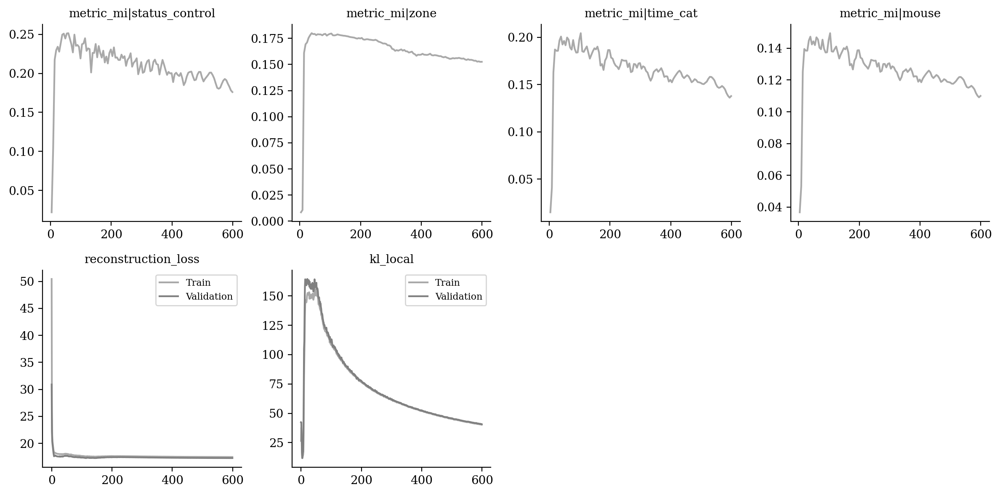

In [15]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [16]:
from tardis._disentanglementmanager import DisentanglementManager as DM

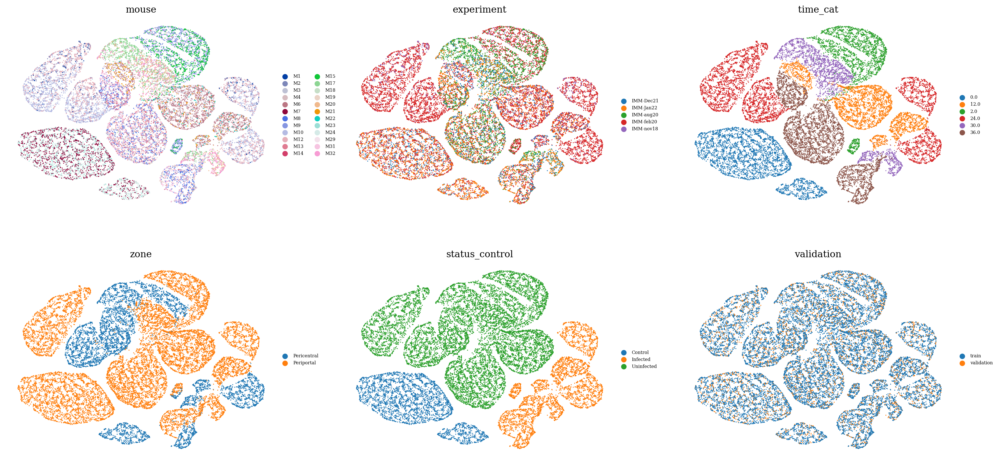

In [17]:
sublatent = DM.configurations.get_by_obs_key("status_control").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

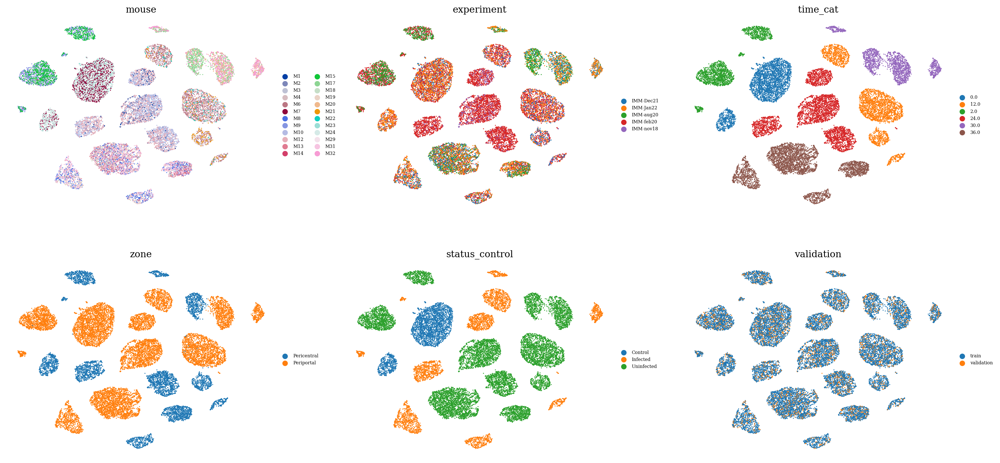

In [18]:
sublatent = DM.configurations.get_by_obs_key("time_cat").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

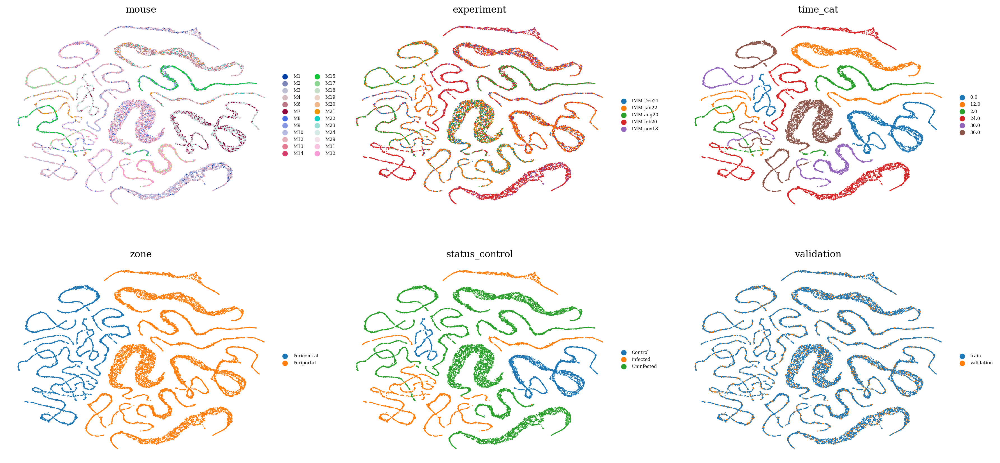

In [19]:
sublatent = DM.configurations.get_by_obs_key("zone").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

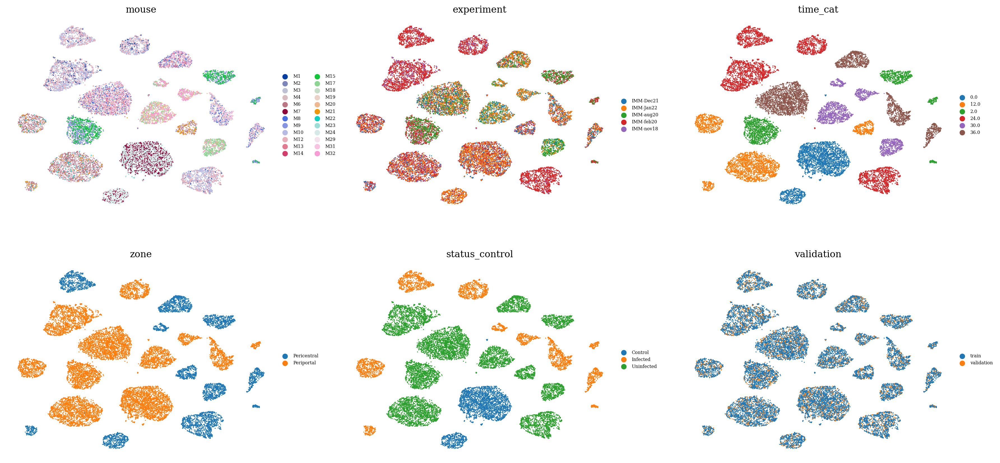

In [20]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

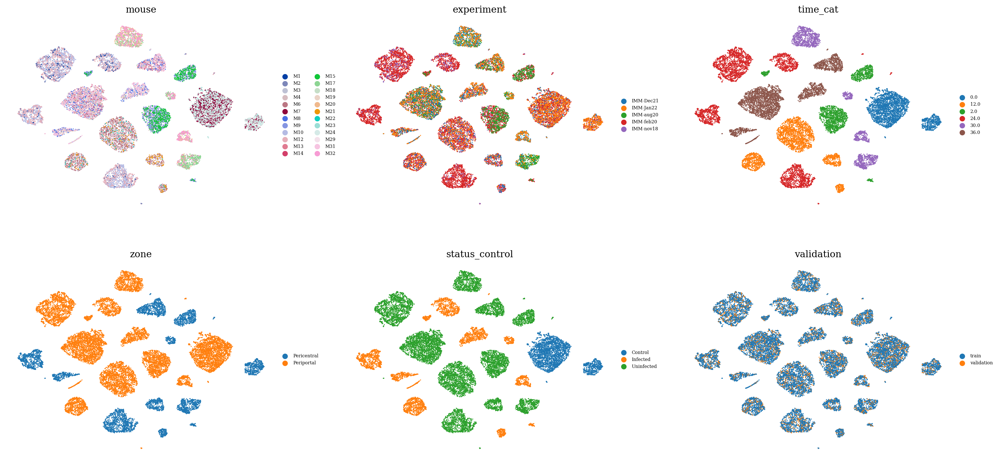

In [21]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [22]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data, factors=factors, variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.5997242789866071

In [23]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data[vae.validation_indices, :], factors=factors[vae.validation_indices, :], variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.5662367847331976

In [24]:
vae.get_MI_normalized_training("zone")

{('validation', 'reserved'): 1.000000000000002,
 ('validation', 'unreserved'): 0.36004445384765765,
 ('train', 'reserved'): 0.9962654229270314,
 ('train', 'unreserved'): 0.31418045960579893}

In [25]:
vae.get_MI_normalized_training("status_control")

{('validation', 'reserved'): 0.9894919013004464,
 ('validation', 'unreserved'): 0.4983819939590271,
 ('train', 'reserved'): 0.9864340190741786,
 ('train', 'unreserved'): 0.4552989016513548}

In [26]:
vae.get_MI_normalized_training("time_cat")

{('validation', 'reserved'): 0.9880689465699726,
 ('validation', 'unreserved'): 0.4217554121712833,
 ('train', 'reserved'): 0.9882540564300739,
 ('train', 'unreserved'): 0.36121822054519204}